In [142]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s3e19/sample_submission.csv
/kaggle/input/playground-series-s3e19/train.csv
/kaggle/input/playground-series-s3e19/test.csv


In [143]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, RobustScaler,
    LabelEncoder, OneHotEncoder, OrdinalEncoder,
    PowerTransformer, QuantileTransformer
)
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


from sklearn.model_selection import (
    train_test_split, cross_val_score, cross_validate,
    StratifiedKFold, KFold, GridSearchCV, RandomizedSearchCV,
    validation_curve, learning_curve
)


from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, ExtraTreesClassifier,
    GradientBoostingClassifier, AdaBoostClassifier,
    VotingClassifier, BaggingClassifier
)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis


from sklearn.linear_model import (
    LinearRegression, Ridge, Lasso, ElasticNet,
    SGDRegressor, BayesianRidge, HuberRegressor
)
from sklearn.ensemble import (
    RandomForestRegressor, ExtraTreesRegressor,
    GradientBoostingRegressor, AdaBoostRegressor,
    VotingRegressor, BaggingRegressor
)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor


from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture


from sklearn.decomposition import PCA, TruncatedSVD, FastICA
from sklearn.manifold import TSNE
from sklearn.feature_selection import (
    SelectKBest, SelectFromModel, RFE, RFECV,
    chi2, f_classif, f_regression, mutual_info_classif
)


from sklearn.metrics import (
    # Clasificación
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, roc_auc_score,
    roc_curve, precision_recall_curve, auc, log_loss,
    
    # Regresión
    mean_squared_error, mean_absolute_error, r2_score,
    mean_squared_log_error, mean_absolute_percentage_error,
    
    # Clustering
    silhouette_score, adjusted_rand_score, calinski_harabasz_score
)

try:
    import xgboost as xgb
    print("✅ XGBoost disponible")
except ImportError:
    print("❌ XGBoost no instalado")

try:
    import lightgbm as lgb
    print("✅ LightGBM disponible")
except ImportError:
    print("❌ LightGBM no instalado")

try:
    from catboost import CatBoostClassifier, CatBoostRegressor
    print("✅ CatBoost disponible")
except ImportError:
    print("❌ CatBoost no instalado")


try:
    import tensorflow as tf
    from tensorflow import keras
    from tensorflow.keras import layers
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
    print("✅ TensorFlow disponible")
except ImportError:
    print("❌ TensorFlow no instalado")

try:
    import torch
    import torch.nn as nn
    import torch.optim as optim
    print("✅ PyTorch disponible")
except ImportError:
    print("❌ PyTorch no instalado")


try:
    import spacy
    print("✅ SpaCy disponible")
except ImportError:
    print("❌ SpaCy no instalado")


try:
    import scipy.stats as stats
    from scipy import stats
    print("✅ SciPy disponible")
except ImportError:
    print("❌ SciPy no instalado")

try:
    import statsmodels.api as sm
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    print("✅ Statsmodels disponible")
except ImportError:
    print("❌ Statsmodels no instalado")


try:
    from prophet import Prophet
    print("✅ Prophet disponible")
except ImportError:
    print("❌ Prophet no instalado")


try:
    import optuna
    print("✅ Optuna disponible")
except ImportError:
    print("❌ Optuna no instalado")


import os
import sys
import json
import pickle
import joblib
from datetime import datetime, timedelta
import itertools
from collections import Counter
import gc


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.4f}'.format)
pd.set_option('display.width', None)


plt.style.use('default')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12


sns.set_palette("husl")
sns.set_style("whitegrid")


np.random.seed(1722)


def info_basica(df):
    """Función para explorar un dataset rápidamente"""
    print("=" * 50)
    print("INFORMACIÓN BÁSICA DEL DATASET")
    print("=" * 50)
    print(f"Forma del dataset: {df.shape}")
    print(f"Memoria utilizada: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
    print("\nTipos de datos:")
    print(df.dtypes.value_counts())
    print("\nValores nulos:")
    print(df.isnull().sum().sort_values(ascending=False))
    print("\nValores duplicados:", df.duplicated().sum())
    print("\nPrimeras 5 filas:")
    print(df.head())

def plot_distribucion(df, columna, tipo='auto'):
    """Plotea la distribución de una columna"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    if tipo == 'auto':
        tipo = 'continua' if df[columna].dtype in ['float64', 'int64'] else 'categorica'
    
    if tipo == 'continua':
        # Histograma
        ax1.hist(df[columna].dropna(), bins=30, alpha=0.7, color='skyblue', edgecolor='black')
        ax1.set_title(f'Distribución de {columna}')
        ax1.set_xlabel(columna)
        ax1.set_ylabel('Frecuencia')
        
        # Boxplot
        ax2.boxplot(df[columna].dropna())
        ax2.set_title(f'Boxplot de {columna}')
        ax2.set_ylabel(columna)
    else:
        # Gráfico de barras
        df[columna].value_counts().plot(kind='bar', ax=ax1, color='lightcoral')
        ax1.set_title(f'Distribución de {columna}')
        ax1.set_xlabel(columna)
        ax1.set_ylabel('Frecuencia')
        ax1.tick_params(axis='x', rotation=45)
        
        # Gráfico de pie
        df[columna].value_counts().plot(kind='pie', ax=ax2, autopct='%1.1f%%')
        ax2.set_title(f'Proporción de {columna}')
        ax2.set_ylabel('')
    
    plt.tight_layout()
    plt.show()


✅ XGBoost disponible
✅ LightGBM disponible
✅ CatBoost disponible
✅ TensorFlow disponible
✅ PyTorch disponible
✅ SpaCy disponible
✅ SciPy disponible
✅ Statsmodels disponible
✅ Prophet disponible
✅ Optuna disponible


In [144]:
train = pd.read_csv('/kaggle/input/playground-series-s3e19/train.csv') 
test  = pd.read_csv("/kaggle/input/playground-series-s3e19/test.csv")

train.head()

,id,date,country,store,product,num_sold
0,0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63
1,1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66
2,2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9
3,3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59
4,4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49


In [145]:
info_basica(train)

INFORMACIÓN BÁSICA DEL DATASET
Forma del dataset: (136950, 6)
Memoria utilizada: 40.04 MB

Tipos de datos:
object    4
int64     2
Name: count, dtype: int64

Valores nulos:
id          0
date        0
country     0
store       0
product     0
num_sold    0
dtype: int64

Valores duplicados: 0

Primeras 5 filas:
   id        date    country         store  \
0   0  2017-01-01  Argentina  Kaggle Learn   
1   1  2017-01-01  Argentina  Kaggle Learn   
2   2  2017-01-01  Argentina  Kaggle Learn   
3   3  2017-01-01  Argentina  Kaggle Learn   
4   4  2017-01-01  Argentina  Kaggle Learn   

                                          product  num_sold  
0               Using LLMs to Improve Your Coding        63  
1                   Using LLMs to Train More LLMs        66  
2  Using LLMs to Win Friends and Influence People         9  
3      Using LLMs to Win More Kaggle Competitions        59  
4                      Using LLMs to Write Better        49  


In [146]:
info_basica(test)

INFORMACIÓN BÁSICA DEL DATASET
Forma del dataset: (27375, 5)
Memoria utilizada: 7.80 MB

Tipos de datos:
object    4
int64     1
Name: count, dtype: int64

Valores nulos:
id         0
date       0
country    0
store      0
product    0
dtype: int64

Valores duplicados: 0

Primeras 5 filas:
       id        date    country         store  \
0  136950  2022-01-01  Argentina  Kaggle Learn   
1  136951  2022-01-01  Argentina  Kaggle Learn   
2  136952  2022-01-01  Argentina  Kaggle Learn   
3  136953  2022-01-01  Argentina  Kaggle Learn   
4  136954  2022-01-01  Argentina  Kaggle Learn   

                                          product  
0               Using LLMs to Improve Your Coding  
1                   Using LLMs to Train More LLMs  
2  Using LLMs to Win Friends and Influence People  
3      Using LLMs to Win More Kaggle Competitions  
4                      Using LLMs to Write Better  


In [147]:
# num_sold lo que tengo que predecir para 27375 filas osea (27375/365) = 75 id cada dia
# 5 paises , 3 tiendas, 5 productos ,(136950/1826) = 75 id para cada dia , (75/5) = 15 de cada pais ,
# cada tienda vende 5 productos en cada pais cada dia (5 * 3 * 5) = 75 id , productos = (136950/27390) = 5
# fecha desde 01-01-2017 a 31-12-2021 5 años * 365 = 1825 , 1826 por un año bisiesto
# predecir todo el año de ventas del 2022

#por como esta hecha toda sintetica la info lo primero que se me viene en agrupar informacion y enfocar el modelo
#en predecir distribuciones sea nivel pais o dia o tienda o producto , ver si sigue alguna distrib de conteo conocida
# y comparar si año a año cambia

train.describe(include="all")

,id,date,country,store,product,num_sold
count,136950.0000,136950,136950,136950,136950,136950.0000
unique,NaN,1826,5,3,5,NaN
top,NaN,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,NaN
freq,NaN,75,27390,45650,27390,NaN
mean,68474.5000,NaN,NaN,NaN,NaN,165.5226
std,39534.2040,NaN,NaN,NaN,NaN,183.6916
min,0.0000,NaN,NaN,NaN,NaN,2.0000
25%,34237.2500,NaN,NaN,NaN,NaN,46.0000
50%,68474.5000,NaN,NaN,NaN,NaN,98.0000
75%,102711.7500,NaN,NaN,NaN,NaN,184.0000


In [148]:
test.describe(include="all")

,id,date,country,store,product
count,27375.0000,27375,27375,27375,27375
unique,NaN,365,5,3,5
top,NaN,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding
freq,NaN,75,5475,9125,5475
mean,150637.0000,NaN,NaN,NaN,NaN
std,7902.6261,NaN,NaN,NaN,NaN
min,136950.0000,NaN,NaN,NaN,NaN
25%,143793.5000,NaN,NaN,NaN,NaN
50%,150637.0000,NaN,NaN,NaN,NaN
75%,157480.5000,NaN,NaN,NaN,NaN


In [149]:
train["date"].value_counts()

date
2017-01-01    75
2020-05-11    75
2020-05-09    75
2020-05-08    75
2020-05-07    75
              ..
2018-08-29    75
2018-08-28    75
2018-08-27    75
2018-08-26    75
2021-12-31    75
Name: count, Length: 1826, dtype: int64

In [150]:
test["date"].value_counts()

date
2022-01-01    75
2022-09-09    75
2022-09-07    75
2022-09-06    75
2022-09-05    75
              ..
2022-05-01    75
2022-04-30    75
2022-04-29    75
2022-04-28    75
2022-12-31    75
Name: count, Length: 365, dtype: int64

In [151]:
train1 = train.copy()
test1  = test.copy()

# date lo separo 

train1['date'] = pd.to_datetime(train1['date'])
test1['date'] = pd.to_datetime(test1['date'])


train1['Year'] = train1['date'].dt.year
train1['Quarter'] = train1['date'].dt.quarter
train1['Month'] = train1['date'].dt.month
train1['Day'] = train1['date'].dt.day
train1['DayOfWeek'] = train1['date'].dt.dayofweek  # 0=Lunes, 6=Domingo

test1['Year'] = test1['date'].dt.year
test1['Quarter'] = test1['date'].dt.quarter
test1['Month'] = test1['date'].dt.month
test1['Day'] = test1['date'].dt.day
test1['DayOfWeek'] = test1['date'].dt.dayofweek  # 0=Lunes, 6=Domingo

train1.head(76)

,id,date,country,store,product,num_sold,Year,Quarter,Month,Day,DayOfWeek
0,0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63,2017,1,1,1,6
1,1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66,2017,1,1,1,6
2,2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9,2017,1,1,1,6
3,3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59,2017,1,1,1,6
4,4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49,2017,1,1,1,6
5,5,2017-01-01,Argentina,Kaggle Store,Using LLMs to Improve Your Coding,88,2017,1,1,1,6
6,6,2017-01-01,Argentina,Kaggle Store,Using LLMs to Train More LLMs,98,2017,1,1,1,6
7,7,2017-01-01,Argentina,Kaggle Store,Using LLMs to Win Friends and Influence People,14,2017,1,1,1,6
8,8,2017-01-01,Argentina,Kaggle Store,Using LLMs to Win More Kaggle Competitions,83,2017,1,1,1,6
9,9,2017-01-01,Argentina,Kaggle Store,Using LLMs to Write Better,69,2017,1,1,1,6


In [152]:
# voy a prodecer a ver distintos tipos de agrupaciones y estadisticas , para ver de que forma me conviene
# hacer el modelo , si predecir de arriba para abajo o  al reves


# Distribuciones a diferentes niveles de agregación
daily_sales = train1.groupby('date')['num_sold'].sum()
country_daily = train1.groupby(['date', 'country'])['num_sold'].sum()
store_daily = train1.groupby(['date', 'country', 'store'])['num_sold'].sum()
product_daily = train1.groupby(['date', 'product'])['num_sold'].sum()

daily_sales


date
2017-01-01    20086
2017-01-02    15563
2017-01-03    15039
2017-01-04    14516
2017-01-05    14083
              ...  
2021-12-27    16724
2021-12-28    18507
2021-12-29    20110
2021-12-30    20156
2021-12-31    20422
Name: num_sold, Length: 1826, dtype: int64

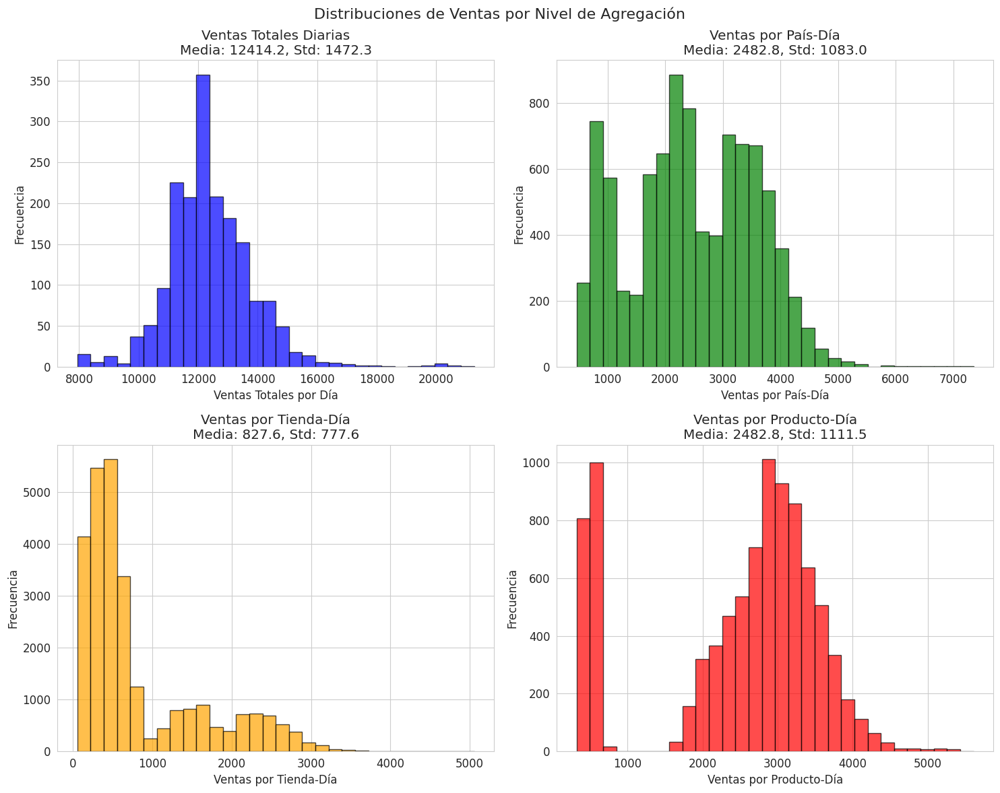

=== ESTADÍSTICAS DESCRIPTIVAS ===

1. VENTAS TOTALES DIARIAS (75 registros/día):
   Min: 7942, Max: 21273
   Media: 12414.20, Mediana: 12231.50
   Coef. Variación: 0.119

2. VENTAS POR PAÍS-DÍA (15 registros/país/día):
   Min: 466, Max: 7347
   Media: 2482.84, Mediana: 2404.50
   Coef. Variación: 0.436

3. VENTAS POR TIENDA-DÍA (5 registros/tienda/día):
   Min: 55, Max: 5056
   Media: 827.61, Mediana: 483.00
   Coef. Variación: 0.940

4. VENTAS POR PRODUCTO-DÍA:
   Min: 321, Max: 5609
   Media: 2482.84, Mediana: 2820.00
   Coef. Variación: 0.448

5. VENTAS INDIVIDUALES (nivel más granular):
   Min: 2, Max: 1380
   Media: 165.52, Mediana: 98.00
   Coef. Variación: 1.110


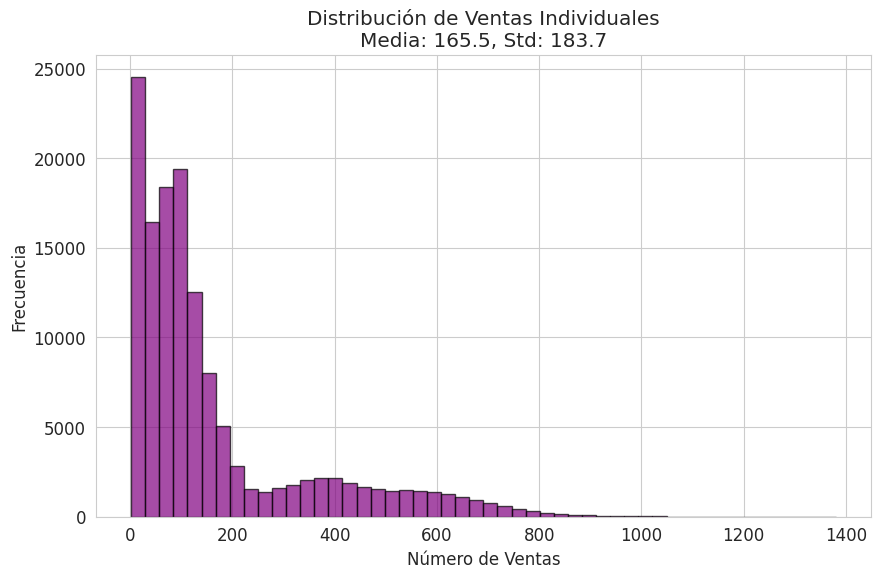

In [153]:

# Crear subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Distribuciones de Ventas por Nivel de Agregación', fontsize=16)

# 1. Ventas totales diarias
axes[0,0].hist(daily_sales, bins=30, alpha=0.7, color='blue', edgecolor='black')
axes[0,0].set_title(f'Ventas Totales Diarias\nMedia: {daily_sales.mean():.1f}, Std: {daily_sales.std():.1f}')
axes[0,0].set_xlabel('Ventas Totales por Día')
axes[0,0].set_ylabel('Frecuencia')

# 2. Ventas por país-día
axes[0,1].hist(country_daily, bins=30, alpha=0.7, color='green', edgecolor='black')
axes[0,1].set_title(f'Ventas por País-Día\nMedia: {country_daily.mean():.1f}, Std: {country_daily.std():.1f}')
axes[0,1].set_xlabel('Ventas por País-Día')
axes[0,1].set_ylabel('Frecuencia')

# 3. Ventas por tienda-día
axes[1,0].hist(store_daily, bins=30, alpha=0.7, color='orange', edgecolor='black')
axes[1,0].set_title(f'Ventas por Tienda-Día\nMedia: {store_daily.mean():.1f}, Std: {store_daily.std():.1f}')
axes[1,0].set_xlabel('Ventas por Tienda-Día')
axes[1,0].set_ylabel('Frecuencia')

# 4. Ventas por producto-día
axes[1,1].hist(product_daily, bins=30, alpha=0.7, color='red', edgecolor='black')
axes[1,1].set_title(f'Ventas por Producto-Día\nMedia: {product_daily.mean():.1f}, Std: {product_daily.std():.1f}')
axes[1,1].set_xlabel('Ventas por Producto-Día')
axes[1,1].set_ylabel('Frecuencia')

plt.tight_layout()
plt.show()

# Estadísticas descriptivas
print("=== ESTADÍSTICAS DESCRIPTIVAS ===")
print(f"\n1. VENTAS TOTALES DIARIAS (75 registros/día):")
print(f"   Min: {daily_sales.min()}, Max: {daily_sales.max()}")
print(f"   Media: {daily_sales.mean():.2f}, Mediana: {daily_sales.median():.2f}")
print(f"   Coef. Variación: {daily_sales.std()/daily_sales.mean():.3f}")

print(f"\n2. VENTAS POR PAÍS-DÍA (15 registros/país/día):")
print(f"   Min: {country_daily.min()}, Max: {country_daily.max()}")
print(f"   Media: {country_daily.mean():.2f}, Mediana: {country_daily.median():.2f}")
print(f"   Coef. Variación: {country_daily.std()/country_daily.mean():.3f}")

print(f"\n3. VENTAS POR TIENDA-DÍA (5 registros/tienda/día):")
print(f"   Min: {store_daily.min()}, Max: {store_daily.max()}")
print(f"   Media: {store_daily.mean():.2f}, Mediana: {store_daily.median():.2f}")
print(f"   Coef. Variación: {store_daily.std()/store_daily.mean():.3f}")

print(f"\n4. VENTAS POR PRODUCTO-DÍA:")
print(f"   Min: {product_daily.min()}, Max: {product_daily.max()}")
print(f"   Media: {product_daily.mean():.2f}, Mediana: {product_daily.median():.2f}")
print(f"   Coef. Variación: {product_daily.std()/product_daily.mean():.3f}")

# Ver la distribución individual (nivel más granular)
print(f"\n5. VENTAS INDIVIDUALES (nivel más granular):")
print(f"   Min: {train1['num_sold'].min()}, Max: {train1['num_sold'].max()}")
print(f"   Media: {train1['num_sold'].mean():.2f}, Mediana: {train1['num_sold'].median():.2f}")
print(f"   Coef. Variación: {train1['num_sold'].std()/train1['num_sold'].mean():.3f}")

# Histograma adicional para el nivel individual
plt.figure(figsize=(10, 6))
plt.hist(train1['num_sold'], bins=50, alpha=0.7, color='purple', edgecolor='black')
plt.title(f'Distribución de Ventas Individuales\nMedia: {train1["num_sold"].mean():.1f}, Std: {train1["num_sold"].std():.1f}')
plt.xlabel('Número de Ventas')
plt.ylabel('Frecuencia')
plt.show()

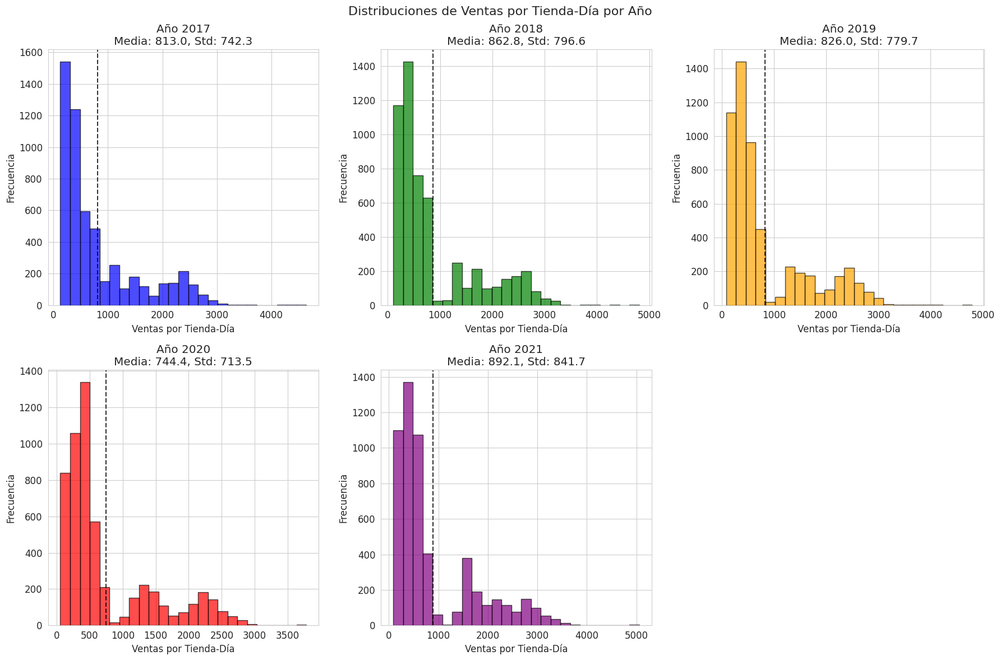

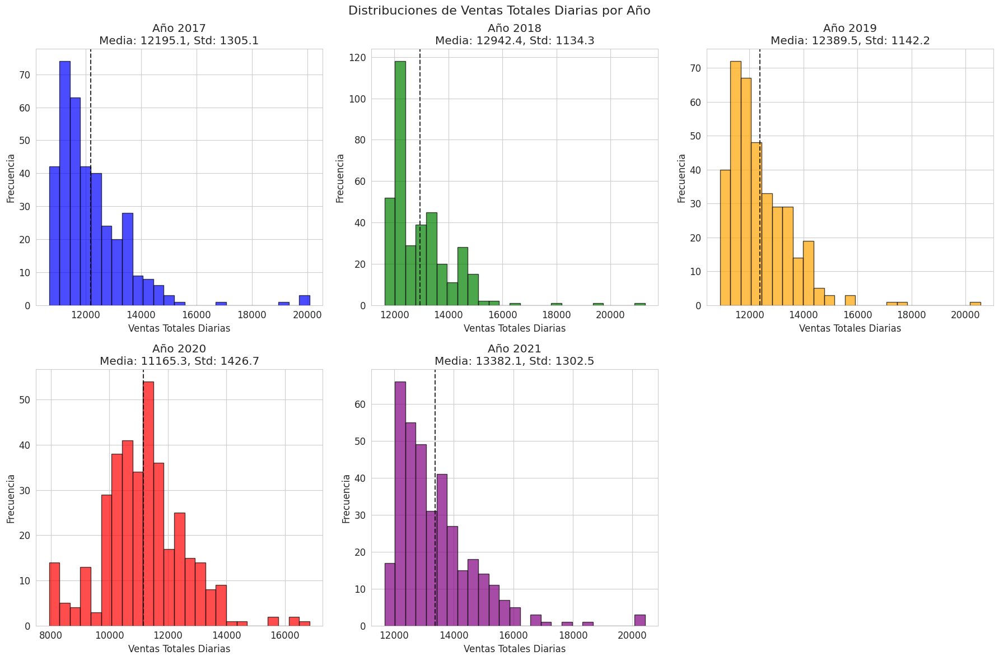

=== EVOLUCIÓN DE ESTADÍSTICAS POR AÑO ===

1. VENTAS POR TIENDA-DÍA:
Año	Media	Std	Coef.Var	Min	Max
--------------------------------------------------
2017	813.0	742.3	0.913		125	4643
2018	862.8	796.6	0.923		105	4809
2019	826.0	779.7	0.944		84	4793
2020	744.4	713.5	0.959		55	3781
2021	892.1	841.7	0.943		89	5056

2. VENTAS TOTALES DIARIAS:
Año	Media	Std	Coef.Var	Min	Max
--------------------------------------------------
2017	12195.1	1305.1	0.107		10684	20086
2018	12942.4	1134.3	0.088		11640	21273
2019	12389.5	1142.2	0.092		10908	20556
2020	11165.3	1426.7	0.128		7942	16841
2021	13382.1	1302.5	0.097		11677	20422


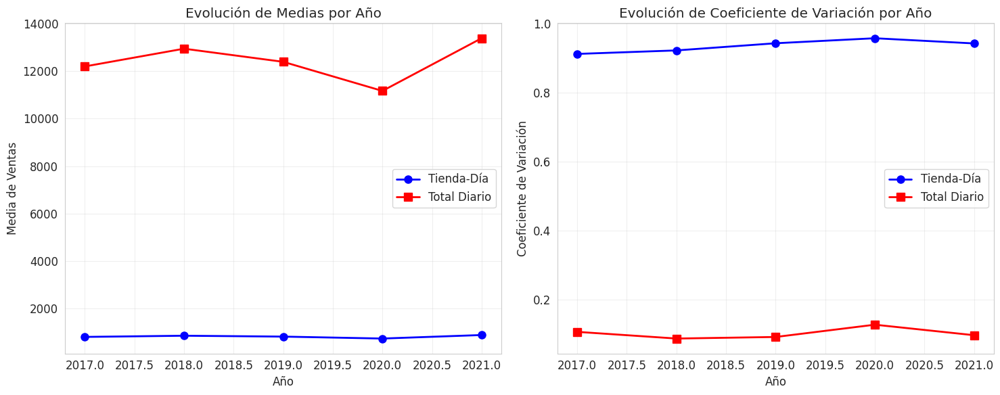


=== TESTS DE FORMA DE DISTRIBUCIÓN ===

Para detectar si las distribuciones cambian de forma:
- Si Coef.Var ≈ 1: podría ser Poisson
- Si Coef.Var > 1: podría ser Binomial Negativa
- Si Coef.Var << 1: podría tender a Normal
Año 2017 - Tienda-Día: CV=0.913 -> Poisson-like
Año 2018 - Tienda-Día: CV=0.923 -> Poisson-like
Año 2019 - Tienda-Día: CV=0.944 -> Poisson-like
Año 2020 - Tienda-Día: CV=0.959 -> Poisson-like
Año 2021 - Tienda-Día: CV=0.943 -> Poisson-like


In [154]:
# Crear las agregaciones por año
years = [2017, 2018, 2019, 2020, 2021]
colors = ['blue', 'green', 'orange', 'red', 'purple']

# 1. VENTAS POR TIENDA-DÍA POR AÑO
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Distribuciones de Ventas por Tienda-Día por Año', fontsize=16)

for i, year in enumerate(years):
    year_data = train1[train1['Year'] == year]
    store_daily_year = year_data.groupby(['date', 'country', 'store'])['num_sold'].sum()
    
    row = i // 3
    col = i % 3
    
    axes[row, col].hist(store_daily_year, bins=25, alpha=0.7, color=colors[i], edgecolor='black')
    axes[row, col].set_title(f'Año {year}\nMedia: {store_daily_year.mean():.1f}, Std: {store_daily_year.std():.1f}')
    axes[row, col].set_xlabel('Ventas por Tienda-Día')
    axes[row, col].set_ylabel('Frecuencia')
    
    # Agregar línea vertical en la media
    axes[row, col].axvline(store_daily_year.mean(), color='black', linestyle='--', alpha=0.8)

# Remover el subplot extra
axes[1, 2].remove()

plt.tight_layout()
plt.show()

# 2. VENTAS TOTALES DIARIAS POR AÑO
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Distribuciones de Ventas Totales Diarias por Año', fontsize=16)

for i, year in enumerate(years):
    year_data = train1[train1['Year'] == year]
    daily_sales_year = year_data.groupby('date')['num_sold'].sum()
    
    row = i // 3
    col = i % 3
    
    axes[row, col].hist(daily_sales_year, bins=25, alpha=0.7, color=colors[i], edgecolor='black')
    axes[row, col].set_title(f'Año {year}\nMedia: {daily_sales_year.mean():.1f}, Std: {daily_sales_year.std():.1f}')
    axes[row, col].set_xlabel('Ventas Totales Diarias')
    axes[row, col].set_ylabel('Frecuencia')
    
    # Agregar línea vertical en la media
    axes[row, col].axvline(daily_sales_year.mean(), color='black', linestyle='--', alpha=0.8)

# Remover el subplot extra
axes[1, 2].remove()

plt.tight_layout()
plt.show()

# 3. COMPARACIÓN DE ESTADÍSTICAS POR AÑO
print("=== EVOLUCIÓN DE ESTADÍSTICAS POR AÑO ===")
print("\n1. VENTAS POR TIENDA-DÍA:")
print("Año\tMedia\tStd\tCoef.Var\tMin\tMax")
print("-" * 50)

store_stats = []
for year in years:
    year_data = train1[train1['Year'] == year]
    store_daily_year = year_data.groupby(['date', 'country', 'store'])['num_sold'].sum()
    
    mean_val = store_daily_year.mean()
    std_val = store_daily_year.std()
    cv = std_val / mean_val
    min_val = store_daily_year.min()
    max_val = store_daily_year.max()
    
    store_stats.append([year, mean_val, std_val, cv, min_val, max_val])
    print(f"{year}\t{mean_val:.1f}\t{std_val:.1f}\t{cv:.3f}\t\t{min_val}\t{max_val}")

print("\n2. VENTAS TOTALES DIARIAS:")
print("Año\tMedia\tStd\tCoef.Var\tMin\tMax")
print("-" * 50)

daily_stats = []
for year in years:
    year_data = train1[train1['Year'] == year]
    daily_sales_year = year_data.groupby('date')['num_sold'].sum()
    
    mean_val = daily_sales_year.mean()
    std_val = daily_sales_year.std()
    cv = std_val / mean_val
    min_val = daily_sales_year.min()
    max_val = daily_sales_year.max()
    
    daily_stats.append([year, mean_val, std_val, cv, min_val, max_val])
    print(f"{year}\t{mean_val:.1f}\t{std_val:.1f}\t{cv:.3f}\t\t{min_val}\t{max_val}")

# 4. GRÁFICOS DE EVOLUCIÓN TEMPORAL
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Evolución de medias
store_means = [stats[1] for stats in store_stats]
daily_means = [stats[1] for stats in daily_stats]

axes[0].plot(years, store_means, 'o-', color='blue', linewidth=2, markersize=8, label='Tienda-Día')
axes[0].plot(years, daily_means, 's-', color='red', linewidth=2, markersize=8, label='Total Diario')
axes[0].set_title('Evolución de Medias por Año')
axes[0].set_xlabel('Año')
axes[0].set_ylabel('Media de Ventas')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Evolución de coeficientes de variación
store_cvs = [stats[3] for stats in store_stats]
daily_cvs = [stats[3] for stats in daily_stats]

axes[1].plot(years, store_cvs, 'o-', color='blue', linewidth=2, markersize=8, label='Tienda-Día')
axes[1].plot(years, daily_cvs, 's-', color='red', linewidth=2, markersize=8, label='Total Diario')
axes[1].set_title('Evolución de Coeficiente de Variación por Año')
axes[1].set_xlabel('Año')
axes[1].set_ylabel('Coeficiente de Variación')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. TEST DE NORMALIDAD BÁSICO (opcional)
from scipy import stats as scipy_stats

print("\n=== TESTS DE FORMA DE DISTRIBUCIÓN ===")
print("\nPara detectar si las distribuciones cambian de forma:")
print("- Si Coef.Var ≈ 1: podría ser Poisson")
print("- Si Coef.Var > 1: podría ser Binomial Negativa")
print("- Si Coef.Var << 1: podría tender a Normal")

for year in years:
    year_data = train1[train1['Year'] == year]
    store_daily_year = year_data.groupby(['date', 'country', 'store'])['num_sold'].sum()
    
    cv = store_daily_year.std() / store_daily_year.mean()
    
    if abs(cv - 1) < 0.1:
        distribution_type = "Poisson-like"
    elif cv > 1.2:
        distribution_type = "Overdispersed (Binomial Negativa?)"
    elif cv < 0.5:
        distribution_type = "Underdispersed (Normal?)"
    else:
        distribution_type = "Intermedio"
    
    print(f"Año {year} - Tienda-Día: CV={cv:.3f} -> {distribution_type}")

=== ANÁLISIS POR PAÍS AÑO A AÑO ===
Países en el dataset: ['Argentina' 'Canada' 'Estonia' 'Japan' 'Spain']


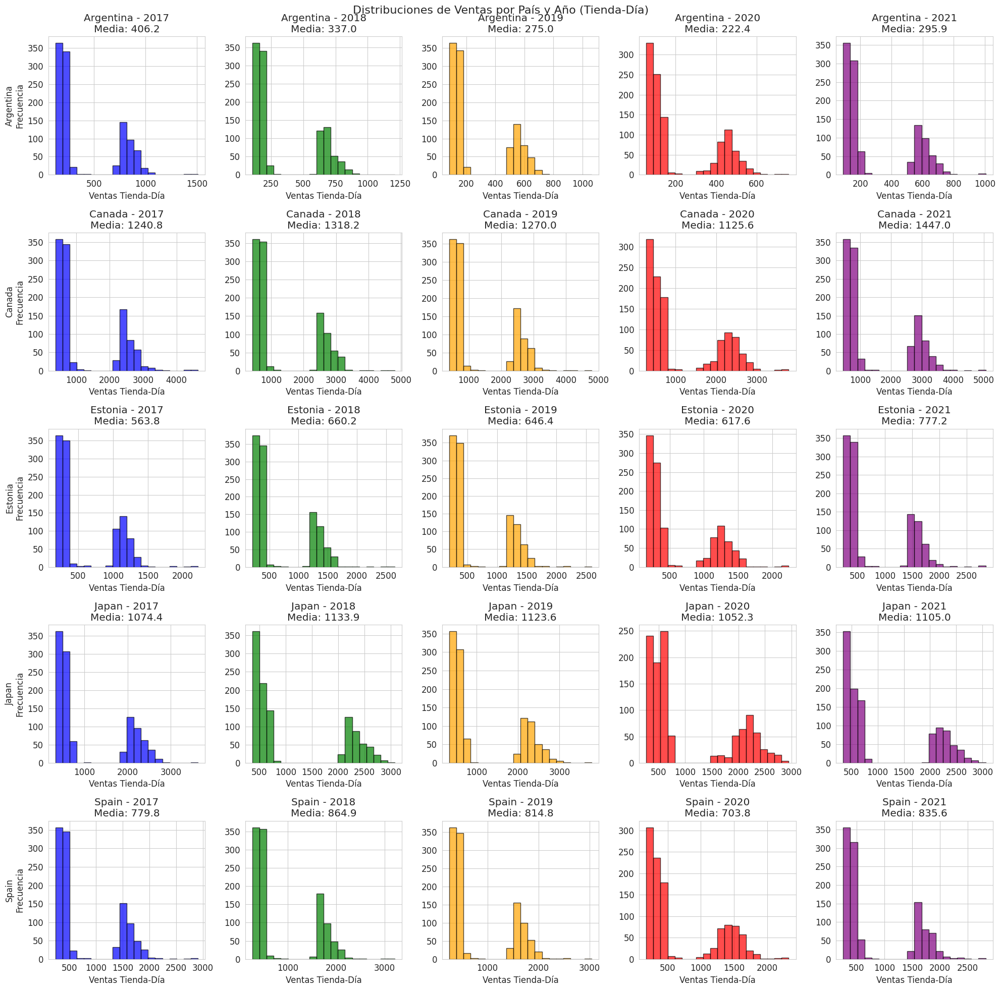


ESTADÍSTICAS POR PAÍS:

ARGENTINA:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	406.2	316.8	0.780		1095
2018	337.0	262.0	0.778		1095
2019	275.0	214.3	0.779		1095
2020	222.4	175.1	0.787		1098
2021	295.9	230.5	0.779		1095

CANADA:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	1240.8	963.2	0.776		1095
2018	1318.2	1017.8	0.772		1095
2019	1270.0	982.3	0.773		1095
2020	1125.6	879.3	0.781		1098
2021	1447.0	1121.8	0.775		1095

ESTONIA:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	563.8	439.2	0.779		1095
2018	660.2	512.5	0.776		1095
2019	646.4	502.4	0.777		1095
2020	617.6	484.7	0.785		1098
2021	777.2	603.8	0.777		1095

JAPAN:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	1074.4	828.7	0.771		1095
2018	1133.9	873.1	0.770		1095
2019	1123.6	870.4	0.775		1095
2020	1052.3	821.1	0.780		1098
2021	1105.0	851.3	0.770		1095

SPAIN:
Año	Media	Std	Coef.Var	N_obs
----------------------------

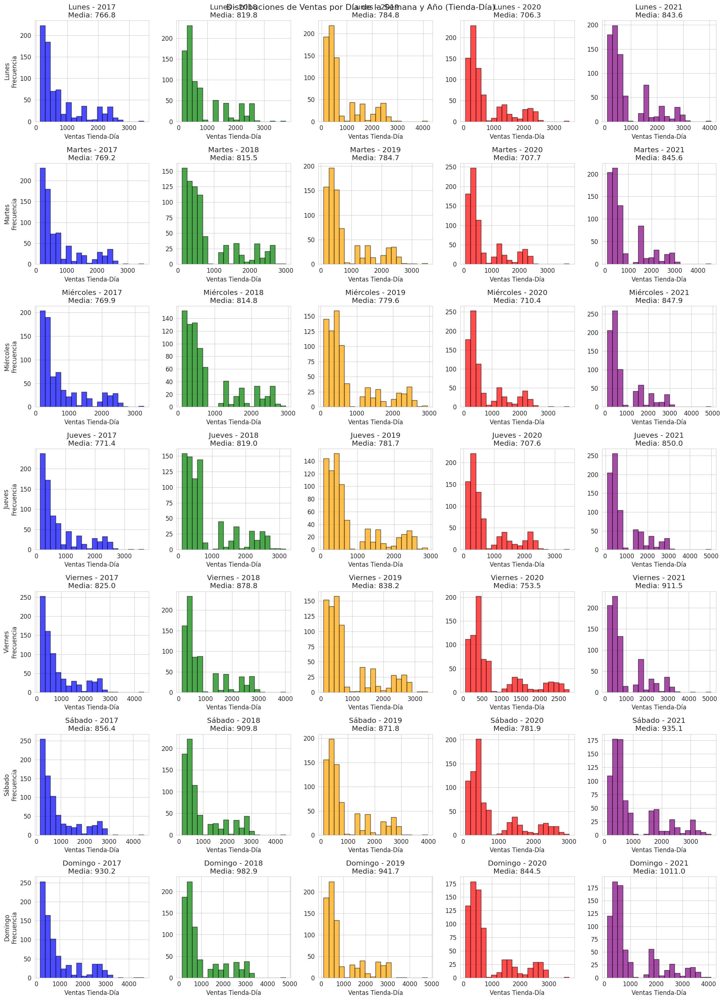


ESTADÍSTICAS POR DÍA DE LA SEMANA:

LUNES:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	766.8	695.2	0.907		780
2018	819.8	753.1	0.919		795
2019	784.8	740.8	0.944		780
2020	706.3	674.6	0.955		780
2021	843.6	791.8	0.939		780

MARTES:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	769.2	699.4	0.909		780
2018	815.5	749.2	0.919		780
2019	784.7	737.5	0.940		795
2020	707.7	676.8	0.956		780
2021	845.6	794.4	0.940		780

MIÉRCOLES:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	769.9	698.0	0.907		780
2018	814.8	745.0	0.914		780
2019	779.6	728.9	0.935		780
2020	710.4	681.1	0.959		795
2021	847.9	798.7	0.942		780

JUEVES:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	771.4	700.4	0.908		780
2018	819.0	753.1	0.919		780
2019	781.7	733.5	0.938		780
2020	707.6	676.1	0.956		795
2021	850.0	802.1	0.944		780

VIERNES:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	8

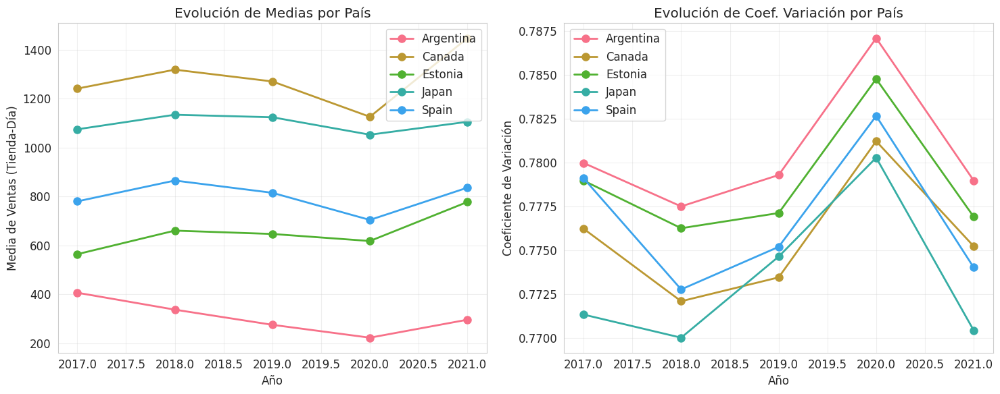

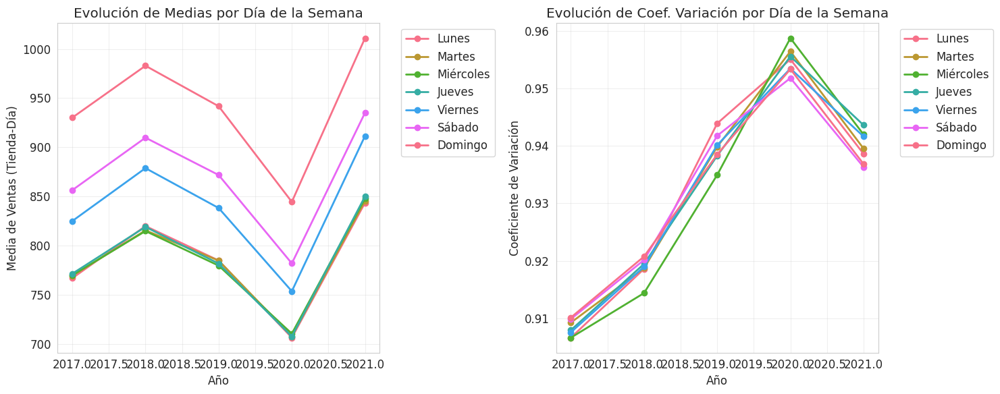


=== ANÁLISIS DE PATRONES ===

RANKING PROMEDIO DE VENTAS POR PAÍS:
1. Canada: 1280.3
2. Japan: 1097.8
3. Spain: 799.8
4. Estonia: 653.1
5. Argentina: 307.3

RANKING PROMEDIO DE VENTAS POR DÍA:
1. Domingo: 942.1
2. Sábado: 871.0
3. Viernes: 841.4
4. Jueves: 785.9
5. Martes: 784.5
6. Miércoles: 784.5
7. Lunes: 784.3


In [155]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Asegurarse de que la columna date sea datetime si no lo está
train1['date'] = pd.to_datetime(train1['date'])

# Para los días de la semana, crear nombres legibles
day_names = {0: 'Lunes', 1: 'Martes', 2: 'Miércoles', 3: 'Jueves', 
             4: 'Viernes', 5: 'Sábado', 6: 'Domingo'}
train1['day_name'] = train1['DayOfWeek'].map(day_names)

years = [2017, 2018, 2019, 2020, 2021]
colors = ['blue', 'green', 'orange', 'red', 'purple']

# ===== 1. ANÁLISIS POR PAÍS AÑO A AÑO =====
print("=== ANÁLISIS POR PAÍS AÑO A AÑO ===")

# Obtener los países únicos
countries = train1['country'].unique()
print(f"Países en el dataset: {countries}")

# Crear figura para distribuciones por país
fig, axes = plt.subplots(len(countries), len(years), figsize=(20, 4*len(countries)))
fig.suptitle('Distribuciones de Ventas por País y Año (Tienda-Día)', fontsize=16)

country_stats = {}
for i, country in enumerate(countries):
    country_stats[country] = []
    for j, year in enumerate(years):
        # Filtrar por país y año
        country_year_data = train1[(train1['country'] == country) & (train1['Year'] == year)]
        store_daily = country_year_data.groupby(['date', 'store'])['num_sold'].sum()
        
        # Crear histograma
        axes[i, j].hist(store_daily, bins=20, alpha=0.7, color=colors[j], edgecolor='black')
        axes[i, j].set_title(f'{country} - {year}\nMedia: {store_daily.mean():.1f}')
        axes[i, j].set_xlabel('Ventas Tienda-Día')
        if j == 0:  # Solo en la primera columna
            axes[i, j].set_ylabel(f'{country}\nFrecuencia')
        
        # Guardar estadísticas
        country_stats[country].append({
            'year': year,
            'mean': store_daily.mean(),
            'std': store_daily.std(),
            'cv': store_daily.std() / store_daily.mean(),
            'count': len(store_daily)
        })

plt.tight_layout()
plt.show()

# Tabla de estadísticas por país
print("\nESTADÍSTICAS POR PAÍS:")
for country in countries:
    print(f"\n{country.upper()}:")
    print("Año\tMedia\tStd\tCoef.Var\tN_obs")
    print("-" * 40)
    for stat in country_stats[country]:
        print(f"{stat['year']}\t{stat['mean']:.1f}\t{stat['std']:.1f}\t{stat['cv']:.3f}\t\t{stat['count']}")

# ===== 2. ANÁLISIS POR DÍA DE LA SEMANA AÑO A AÑO =====
print("\n\n=== ANÁLISIS POR DÍA DE LA SEMANA AÑO A AÑO ===")

# Crear figura para distribuciones por día de la semana
fig, axes = plt.subplots(7, len(years), figsize=(20, 28))
fig.suptitle('Distribuciones de Ventas por Día de la Semana y Año (Tienda-Día)', fontsize=16)

day_stats = {}
days_order = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

for i, day in enumerate(days_order):
    day_stats[day] = []
    for j, year in enumerate(years):
        # Filtrar por día de la semana y año
        day_year_data = train1[(train1['day_name'] == day) & (train1['Year'] == year)]
        store_daily = day_year_data.groupby(['date', 'country', 'store'])['num_sold'].sum()
        
        # Crear histograma
        axes[i, j].hist(store_daily, bins=20, alpha=0.7, color=colors[j], edgecolor='black')
        axes[i, j].set_title(f'{day} - {year}\nMedia: {store_daily.mean():.1f}')
        axes[i, j].set_xlabel('Ventas Tienda-Día')
        if j == 0:  # Solo en la primera columna
            axes[i, j].set_ylabel(f'{day}\nFrecuencia')
        
        # Guardar estadísticas
        day_stats[day].append({
            'year': year,
            'mean': store_daily.mean(),
            'std': store_daily.std(),
            'cv': store_daily.std() / store_daily.mean(),
            'count': len(store_daily)
        })

plt.tight_layout()
plt.show()

# Tabla de estadísticas por día de la semana
print("\nESTADÍSTICAS POR DÍA DE LA SEMANA:")
for day in days_order:
    print(f"\n{day.upper()}:")
    print("Año\tMedia\tStd\tCoef.Var\tN_obs")
    print("-" * 40)
    for stat in day_stats[day]:
        print(f"{stat['year']}\t{stat['mean']:.1f}\t{stat['std']:.1f}\t{stat['cv']:.3f}\t\t{stat['count']}")

# ===== 3. GRÁFICOS DE EVOLUCIÓN TEMPORAL =====

# 3.1 Evolución por país
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

for country in countries:
    means = [stat['mean'] for stat in country_stats[country]]
    cvs = [stat['cv'] for stat in country_stats[country]]
    
    axes[0].plot(years, means, 'o-', linewidth=2, markersize=8, label=country)
    axes[1].plot(years, cvs, 'o-', linewidth=2, markersize=8, label=country)

axes[0].set_title('Evolución de Medias por País')
axes[0].set_xlabel('Año')
axes[0].set_ylabel('Media de Ventas (Tienda-Día)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Evolución de Coef. Variación por País')
axes[1].set_xlabel('Año')
axes[1].set_ylabel('Coeficiente de Variación')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 3.2 Evolución por día de la semana
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

for day in days_order:
    means = [stat['mean'] for stat in day_stats[day]]
    cvs = [stat['cv'] for stat in day_stats[day]]
    
    axes[0].plot(years, means, 'o-', linewidth=2, markersize=6, label=day)
    axes[1].plot(years, cvs, 'o-', linewidth=2, markersize=6, label=day)

axes[0].set_title('Evolución de Medias por Día de la Semana')
axes[0].set_xlabel('Año')
axes[0].set_ylabel('Media de Ventas (Tienda-Día)')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Evolución de Coef. Variación por Día de la Semana')
axes[1].set_xlabel('Año')
axes[1].set_ylabel('Coeficiente de Variación')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ===== 4. ANÁLISIS DE PATRONES =====
print("\n=== ANÁLISIS DE PATRONES ===")

# 4.1 Ranking promedio por país (todos los años)
print("\nRANKING PROMEDIO DE VENTAS POR PAÍS:")
country_overall = []
for country in countries:
    overall_mean = np.mean([stat['mean'] for stat in country_stats[country]])
    country_overall.append((country, overall_mean))

country_overall.sort(key=lambda x: x[1], reverse=True)
for i, (country, mean) in enumerate(country_overall, 1):
    print(f"{i}. {country}: {mean:.1f}")

# 4.2 Ranking promedio por día de la semana
print("\nRANKING PROMEDIO DE VENTAS POR DÍA:")
day_overall = []
for day in days_order:
    overall_mean = np.mean([stat['mean'] for stat in day_stats[day]])
    day_overall.append((day, overall_mean))

day_overall.sort(key=lambda x: x[1], reverse=True)
for i, (day, mean) in enumerate(day_overall, 1):
    print(f"{i}. {day}: {mean:.1f}")

Países: 5 - ['Argentina' 'Canada' 'Estonia' 'Japan' 'Spain']
Productos: 5 - ['Using LLMs to Improve Your Coding' 'Using LLMs to Train More LLMs'
 'Using LLMs to Win Friends and Influence People'
 'Using LLMs to Win More Kaggle Competitions' 'Using LLMs to Write Better']
Tiendas: 3 - ['Kaggle Learn' 'Kaggle Store' 'Kagglazon']

=== ANÁLISIS POR PRODUCTO-PAÍS-AÑO ===

ANÁLISIS PARA ARGENTINA


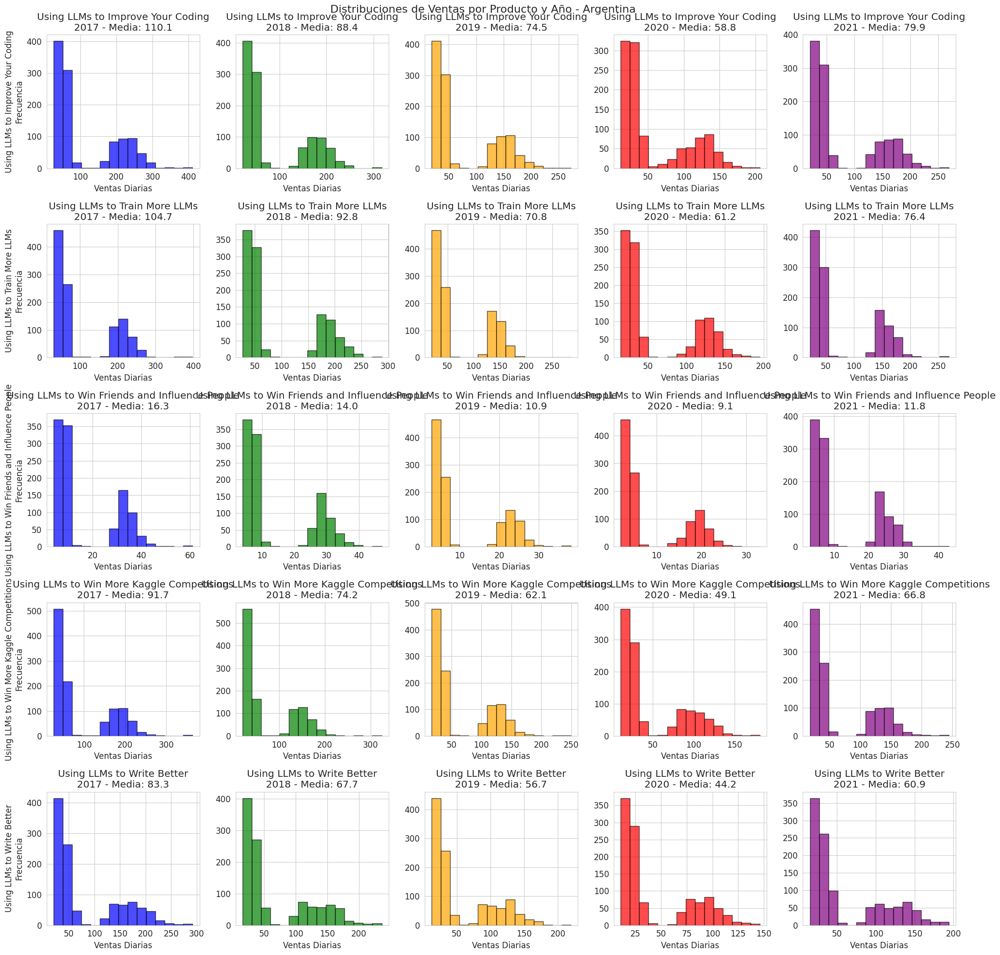


ESTADÍSTICAS DE PRODUCTOS EN Argentina:

Using LLMs to Improve Your Coding:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	110.1	87.1	0.791		1095
2018	88.4	69.5	0.786		1095
2019	74.5	58.6	0.787		1095
2020	58.8	47.2	0.803		1098
2021	79.9	63.0	0.788		1095

Using LLMs to Train More LLMs:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	104.7	81.8	0.781		1095
2018	92.8	72.1	0.777		1095
2019	70.8	54.9	0.775		1095
2020	61.2	48.0	0.784		1098
2021	76.4	59.4	0.777		1095

Using LLMs to Win Friends and Influence People:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	16.3	13.1	0.802		1095
2018	14.0	11.2	0.801		1095
2019	10.9	8.8	0.812		1095
2020	9.1	7.4	0.819		1098
2021	11.8	9.5	0.808		1095

Using LLMs to Win More Kaggle Competitions:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	91.7	72.6	0.791		1095
2018	74.2	58.7	0.791		1095
2019	62.1	49.0	0.788		1095
2020	49.1	39.5	0.805		1098
2021	6

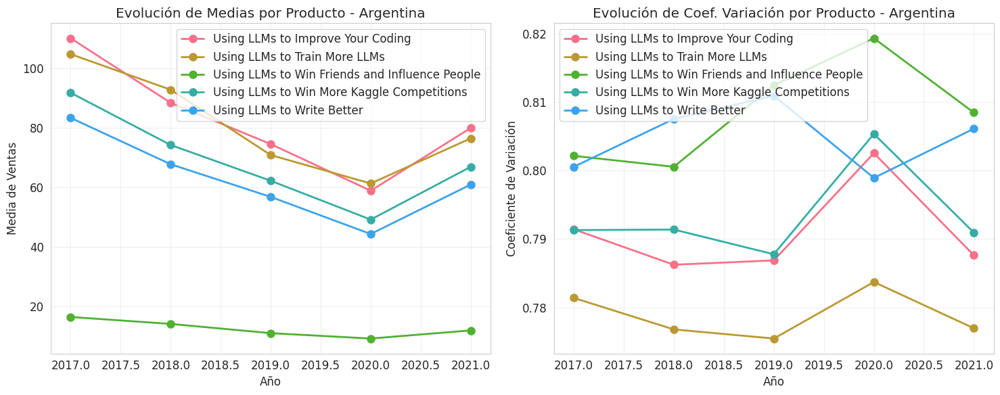


ANÁLISIS PARA CANADA


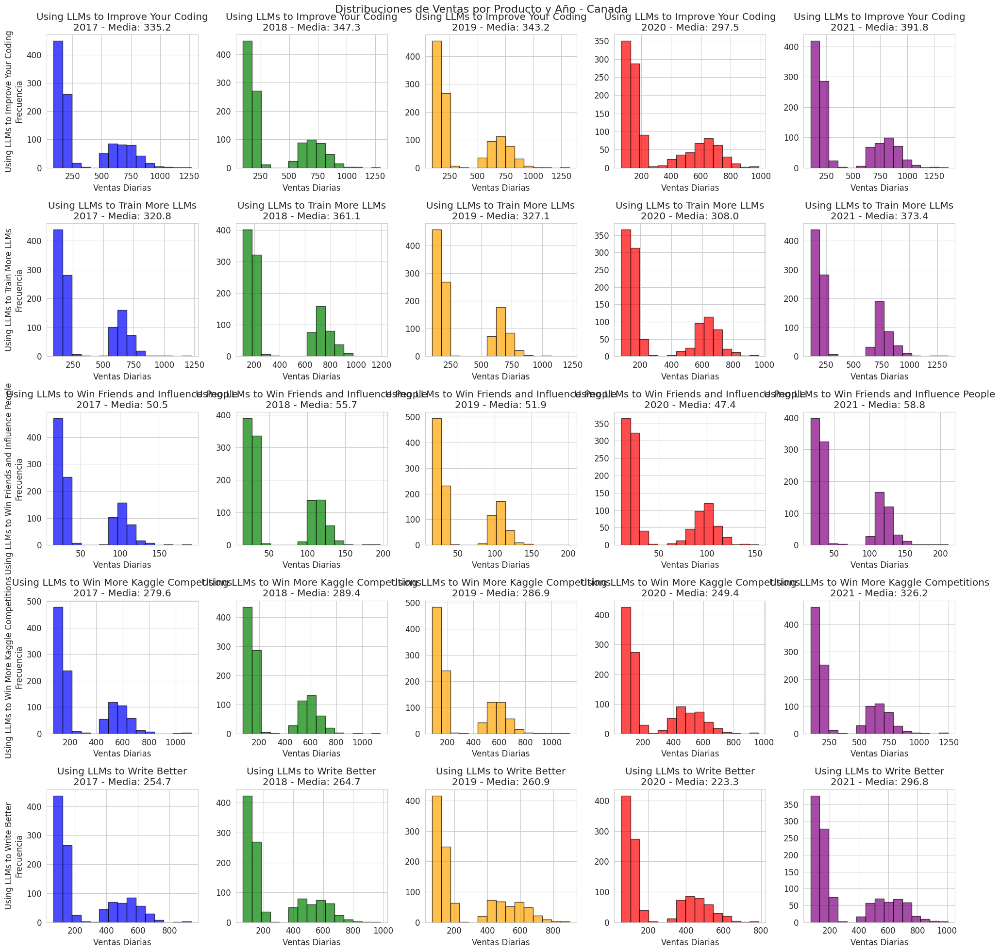


ESTADÍSTICAS DE PRODUCTOS EN Canada:

Using LLMs to Improve Your Coding:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	335.2	264.2	0.788		1095
2018	347.3	272.8	0.785		1095
2019	343.2	269.3	0.785		1095
2020	297.5	238.0	0.800		1098
2021	391.8	307.7	0.785		1095

Using LLMs to Train More LLMs:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	320.8	249.9	0.779		1095
2018	361.1	278.4	0.771		1095
2019	327.1	253.7	0.776		1095
2020	308.0	239.0	0.776		1098
2021	373.4	290.9	0.779		1095

Using LLMs to Win Friends and Influence People:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	50.5	39.4	0.781		1095
2018	55.7	43.3	0.778		1095
2019	51.9	40.5	0.781		1095
2020	47.4	37.1	0.784		1098
2021	58.8	45.8	0.778		1095

Using LLMs to Win More Kaggle Competitions:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	279.6	220.7	0.789		1095
2018	289.4	226.4	0.782		1095
2019	286.9	224.6	0.783		1095
2020	249

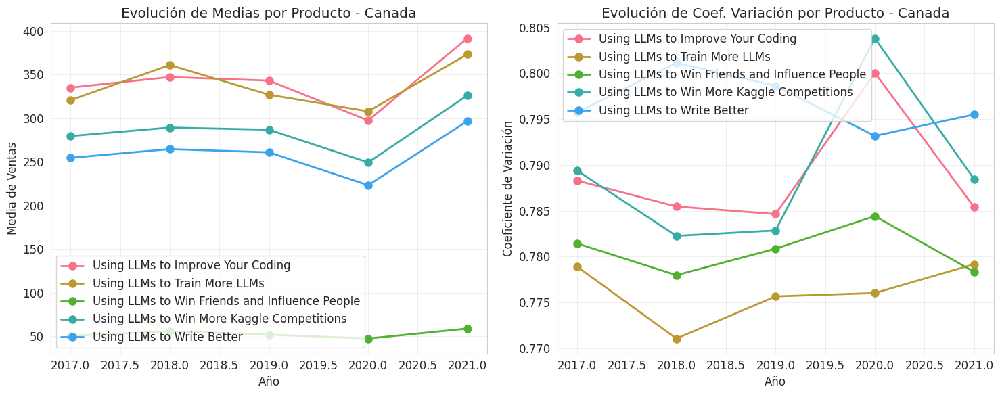


ANÁLISIS PARA ESTONIA


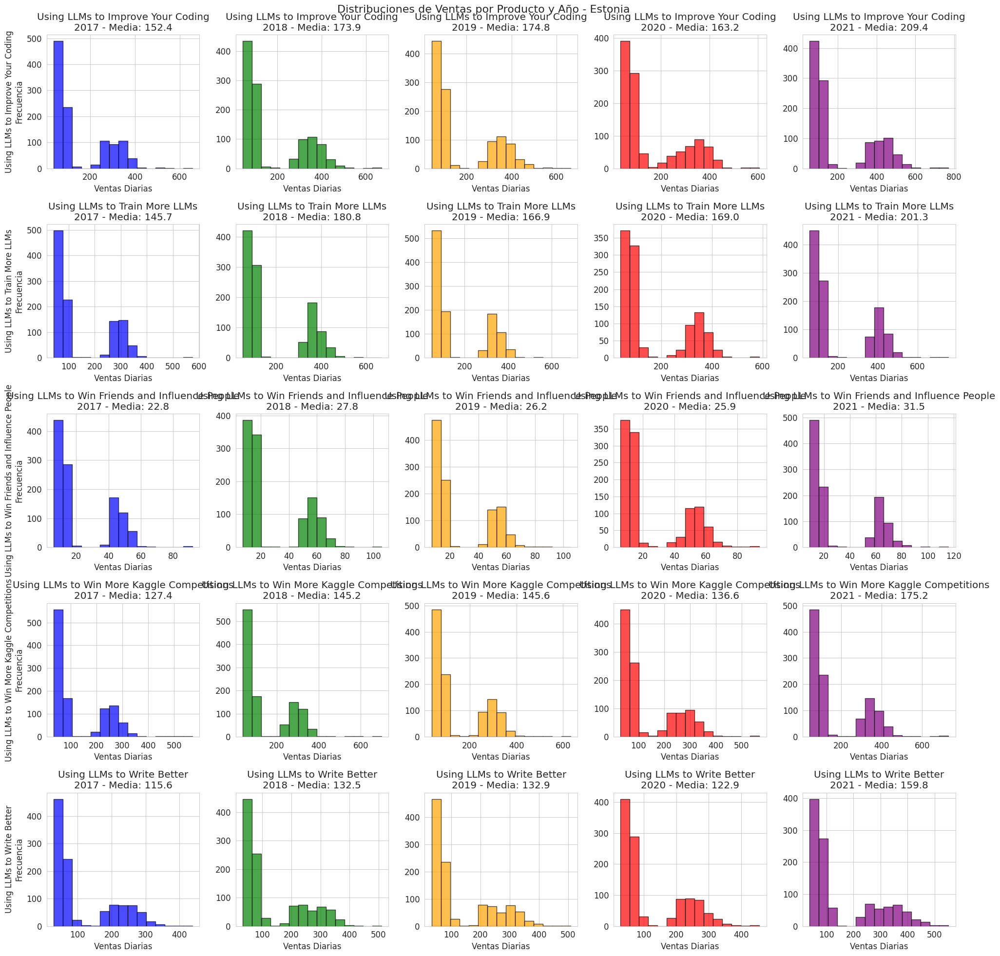


ESTADÍSTICAS DE PRODUCTOS EN Estonia:

Using LLMs to Improve Your Coding:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	152.4	120.4	0.790		1095
2018	173.9	137.4	0.790		1095
2019	174.8	137.6	0.787		1095
2020	163.2	130.8	0.802		1098
2021	209.4	164.1	0.784		1095

Using LLMs to Train More LLMs:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	145.7	113.9	0.782		1095
2018	180.8	139.9	0.774		1095
2019	166.9	129.8	0.778		1095
2020	169.0	131.8	0.780		1098
2021	201.3	156.9	0.780		1095

Using LLMs to Win Friends and Influence People:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	22.8	18.1	0.797		1095
2018	27.8	22.0	0.790		1095
2019	26.2	20.7	0.793		1095
2020	25.9	20.6	0.796		1098
2021	31.5	24.9	0.790		1095

Using LLMs to Win More Kaggle Competitions:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	127.4	100.7	0.790		1095
2018	145.2	114.4	0.788		1095
2019	145.6	114.3	0.785		1095
2020	13

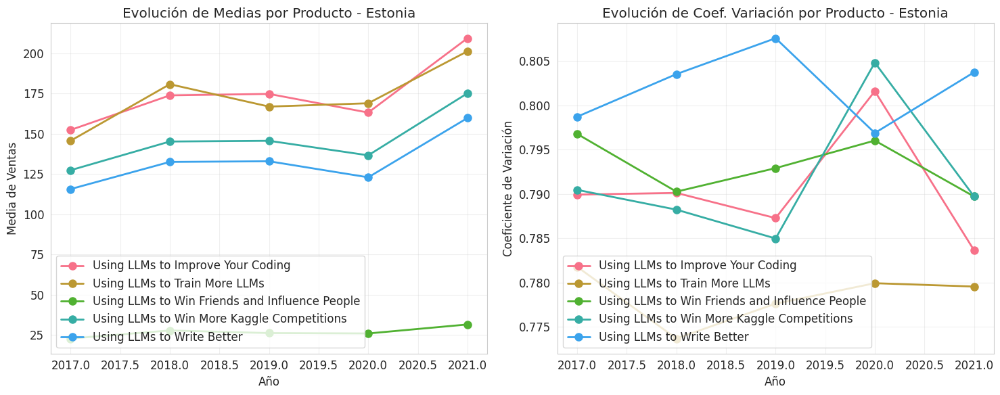


ANÁLISIS PARA JAPAN


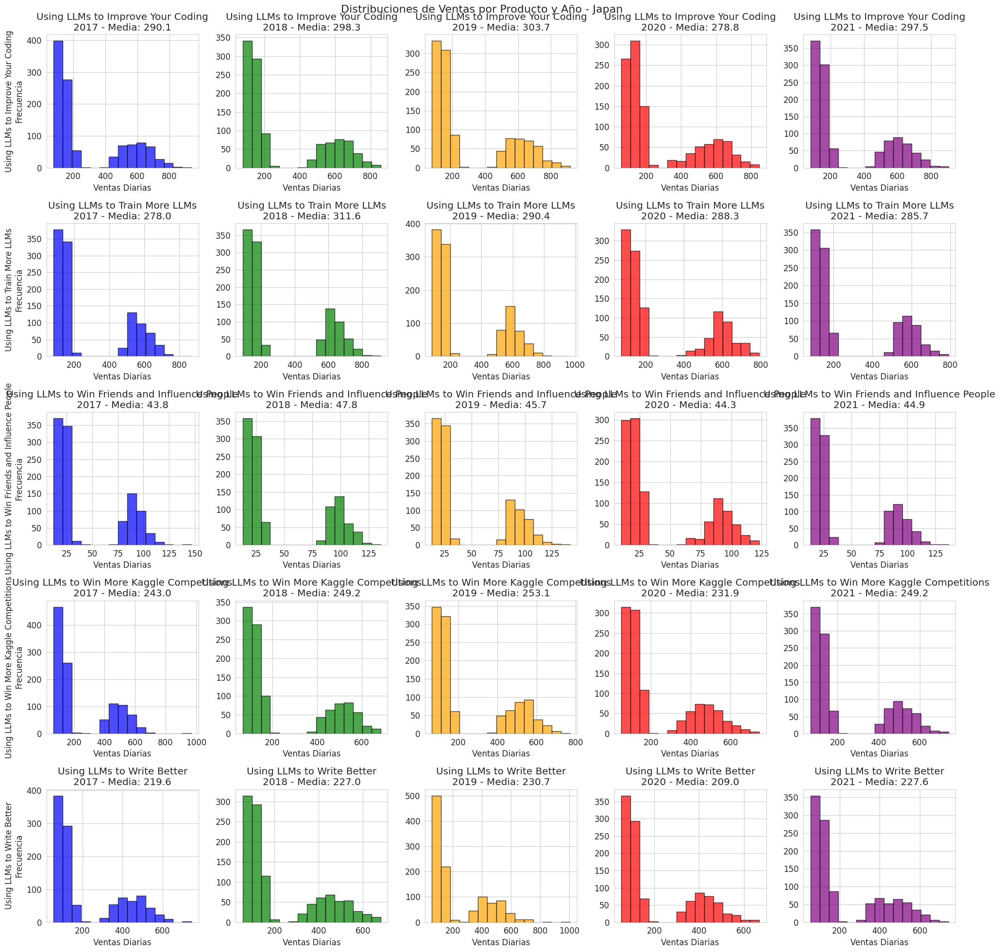


ESTADÍSTICAS DE PRODUCTOS EN Japan:

Using LLMs to Improve Your Coding:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	290.1	227.5	0.784		1095
2018	298.3	233.7	0.783		1095
2019	303.7	239.2	0.788		1095
2020	278.8	223.0	0.800		1098
2021	297.5	231.9	0.779		1095

Using LLMs to Train More LLMs:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	278.0	215.7	0.776		1095
2018	311.6	240.7	0.773		1095
2019	290.4	225.5	0.776		1095
2020	288.3	224.3	0.778		1098
2021	285.7	220.7	0.772		1095

Using LLMs to Win Friends and Influence People:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	43.8	34.1	0.780		1095
2018	47.8	37.1	0.777		1095
2019	45.7	35.6	0.781		1095
2020	44.3	34.8	0.786		1098
2021	44.9	35.0	0.778		1095

Using LLMs to Win More Kaggle Competitions:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	243.0	190.4	0.784		1095
2018	249.2	193.9	0.778		1095
2019	253.1	197.6	0.781		1095
2020	231.

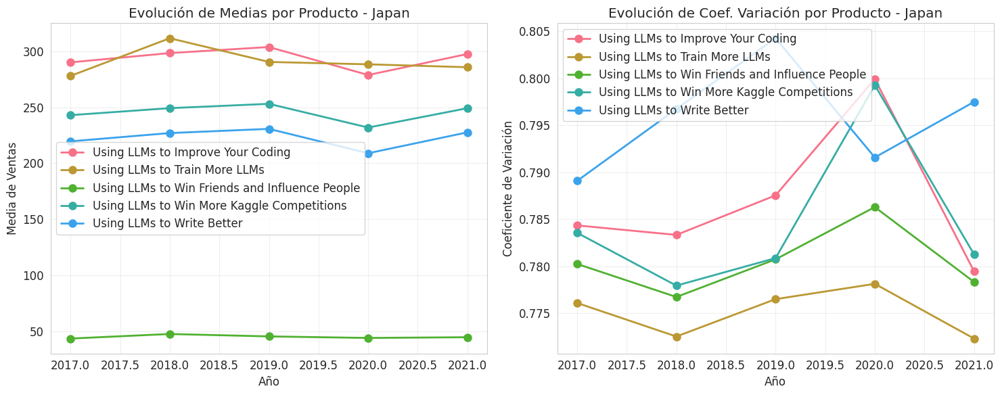


ANÁLISIS PARA SPAIN


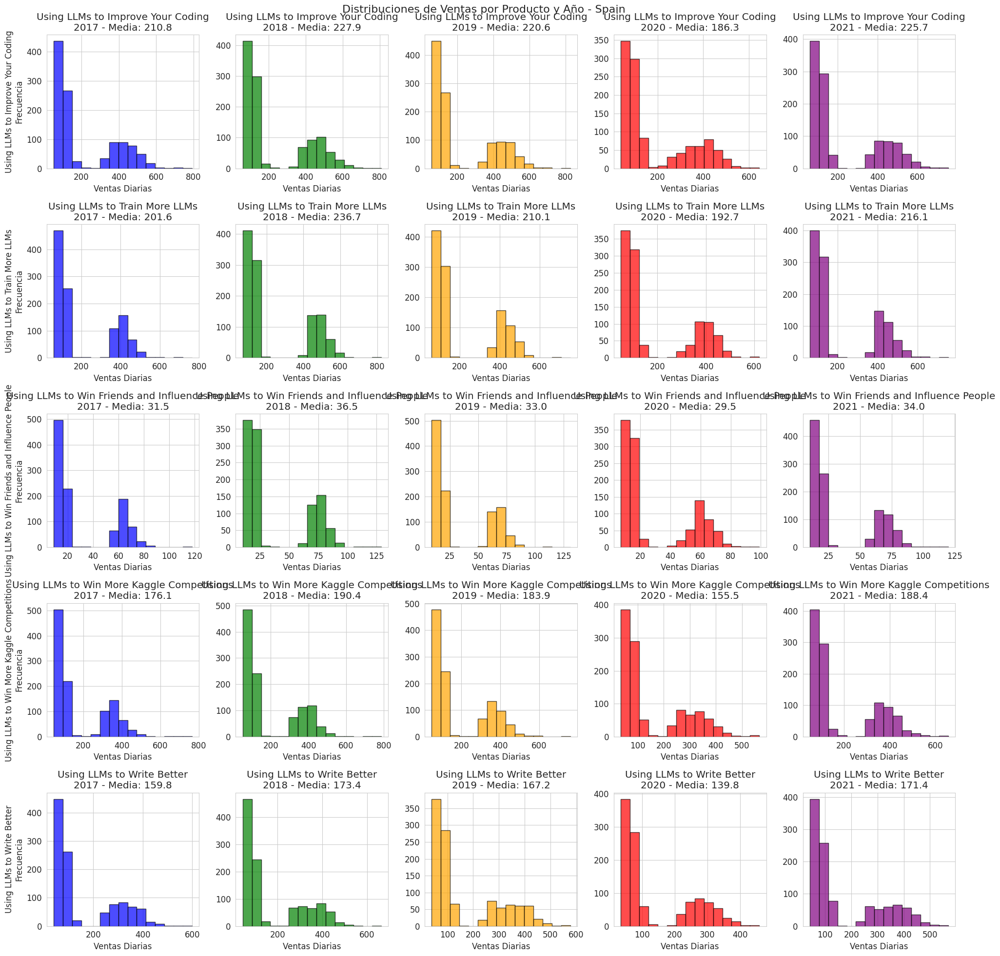


ESTADÍSTICAS DE PRODUCTOS EN Spain:

Using LLMs to Improve Your Coding:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	210.8	166.9	0.792		1095
2018	227.9	178.8	0.785		1095
2019	220.6	173.6	0.787		1095
2020	186.3	149.8	0.804		1098
2021	225.7	176.7	0.783		1095

Using LLMs to Train More LLMs:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	201.6	157.2	0.780		1095
2018	236.7	182.5	0.771		1095
2019	210.1	163.2	0.777		1095
2020	192.7	150.3	0.780		1098
2021	216.1	168.0	0.777		1095

Using LLMs to Win Friends and Influence People:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	31.5	24.8	0.788		1095
2018	36.5	28.7	0.785		1095
2019	33.0	25.9	0.786		1095
2020	29.5	23.3	0.790		1098
2021	34.0	26.7	0.786		1095

Using LLMs to Win More Kaggle Competitions:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	176.1	139.6	0.793		1095
2018	190.4	149.5	0.785		1095
2019	183.9	144.5	0.786		1095
2020	155.

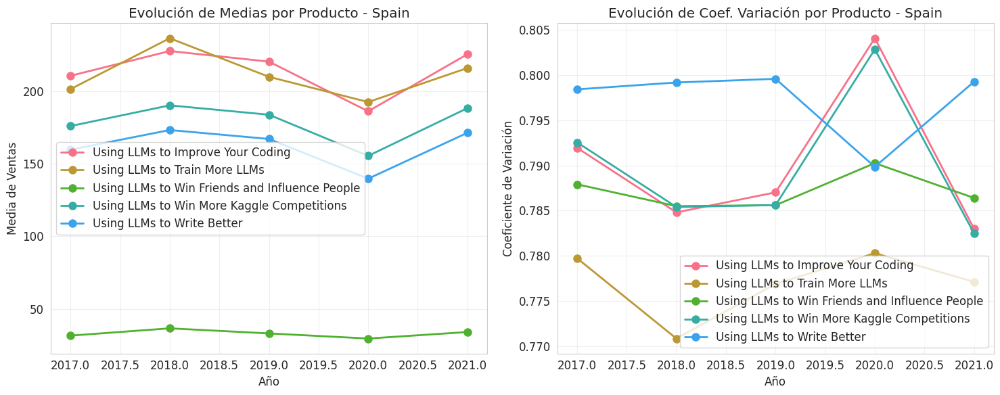


ANÁLISIS POR TIENDA-AÑO


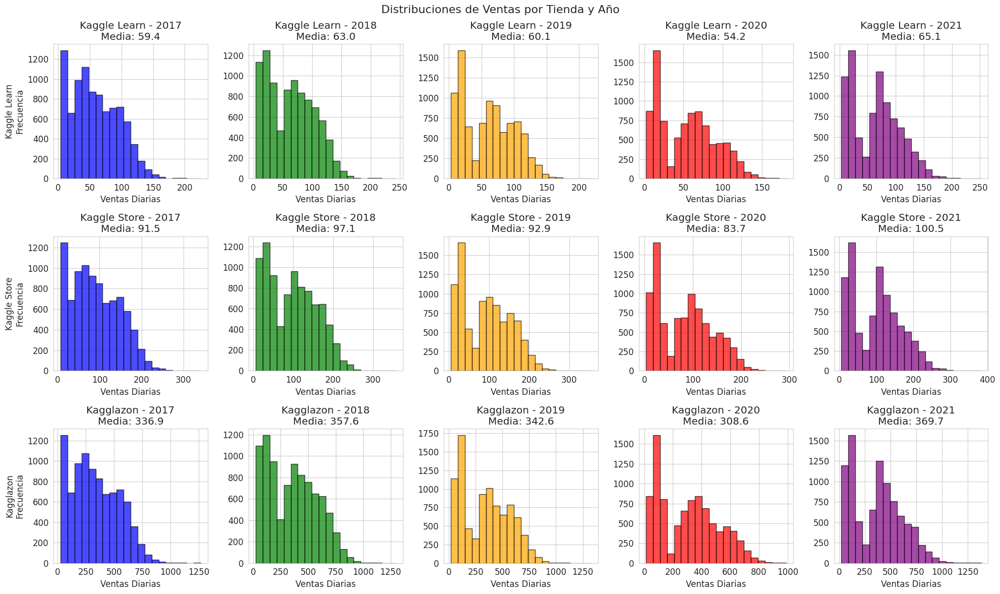


ESTADÍSTICAS POR TIENDA:

KAGGLE LEARN:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	59.4	36.6	0.617		9125
2018	63.0	39.6	0.628		9125
2019	60.1	38.9	0.647		9125
2020	54.2	36.2	0.667		9150
2021	65.1	42.2	0.647		9125

KAGGLE STORE:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	91.5	56.2	0.614		9125
2018	97.1	60.7	0.626		9125
2019	92.9	59.9	0.645		9125
2020	83.7	55.8	0.666		9150
2021	100.5	64.9	0.646		9125

KAGGLAZON:
Año	Media	Std	Coef.Var	N_obs
----------------------------------------
2017	336.9	205.9	0.611		9125
2018	357.6	223.0	0.624		9125
2019	342.6	220.6	0.644		9125
2020	308.6	204.6	0.663		9150
2021	369.7	238.2	0.644		9125


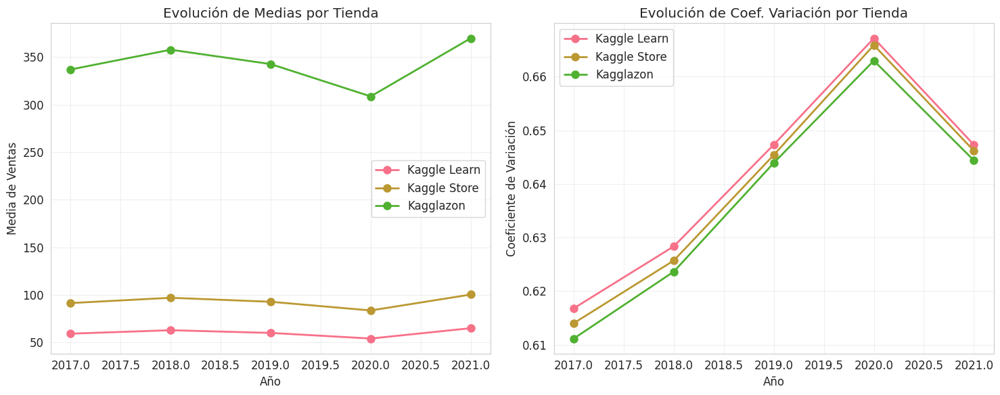


RANKINGS Y ANÁLISIS COMPARATIVO

RANKING DE PRODUCTOS POR PAÍS (Promedio 2017-2021):

ARGENTINA:
  1. Using LLMs to Improve Your Coding: 82.3
  2. Using LLMs to Train More LLMs: 81.2
  3. Using LLMs to Win More Kaggle Competitions: 68.8
  4. Using LLMs to Write Better: 62.6
  5. Using LLMs to Win Friends and Influence People: 12.4

CANADA:
  1. Using LLMs to Improve Your Coding: 343.0
  2. Using LLMs to Train More LLMs: 338.1
  3. Using LLMs to Win More Kaggle Competitions: 286.3
  4. Using LLMs to Write Better: 260.1
  5. Using LLMs to Win Friends and Influence People: 52.8

ESTONIA:
  1. Using LLMs to Improve Your Coding: 174.7
  2. Using LLMs to Train More LLMs: 172.7
  3. Using LLMs to Win More Kaggle Competitions: 146.0
  4. Using LLMs to Write Better: 132.8
  5. Using LLMs to Win Friends and Influence People: 26.8

JAPAN:
  1. Using LLMs to Improve Your Coding: 293.7
  2. Using LLMs to Train More LLMs: 290.8
  3. Using LLMs to Win More Kaggle Competitions: 245.3
  4. Using LLMs 

In [156]:
years = [2017, 2018, 2019, 2020, 2021]
colors = ['blue', 'green', 'orange', 'red', 'purple']

# Obtener valores únicos
countries = train1['country'].unique()
products = train1['product'].unique()
stores = train1['store'].unique()

print(f"Países: {len(countries)} - {countries}")
print(f"Productos: {len(products)} - {products}")
print(f"Tiendas: {len(stores)} - {stores}")

# ===== 1. ANÁLISIS POR PRODUCTO-PAÍS-AÑO =====
print("\n=== ANÁLISIS POR PRODUCTO-PAÍS-AÑO ===")

# Para cada país, mostrar productos por año
for country in countries:
    print(f"\n{'='*50}")
    print(f"ANÁLISIS PARA {country.upper()}")
    print(f"{'='*50}")
    
    fig, axes = plt.subplots(len(products), len(years), figsize=(20, 4*len(products)))
    fig.suptitle(f'Distribuciones de Ventas por Producto y Año - {country}', fontsize=16)
    
    product_stats = {}
    
    for i, product in enumerate(products):
        product_stats[product] = []
        
        for j, year in enumerate(years):
            # Filtrar por país, producto y año
            filtered_data = train1[(train1['country'] == country) & 
                                 (train1['product'] == product) & 
                                 (train1['Year'] == year)]
            
            # Agrupar por fecha y tienda (cada producto-tienda-día)
            daily_sales = filtered_data.groupby(['date', 'store'])['num_sold'].sum()
            
            # Si hay un solo producto, usar axes unidimensional
            if len(products) == 1:
                ax = axes[j]
            else:
                ax = axes[i, j]
            
            # Crear histograma
            ax.hist(daily_sales, bins=15, alpha=0.7, color=colors[j], edgecolor='black')
            ax.set_title(f'{product}\n{year} - Media: {daily_sales.mean():.1f}')
            ax.set_xlabel('Ventas Diarias')
            
            if j == 0:  # Solo en la primera columna
                if len(products) == 1:
                    ax.set_ylabel('Frecuencia')
                else:
                    ax.set_ylabel(f'{product}\nFrecuencia')
            
            # Guardar estadísticas
            product_stats[product].append({
                'year': year,
                'mean': daily_sales.mean(),
                'std': daily_sales.std(),
                'cv': daily_sales.std() / daily_sales.mean() if daily_sales.mean() > 0 else 0,
                'count': len(daily_sales)
            })
    
    plt.tight_layout()
    plt.show()
    
    # Tabla de estadísticas por producto en este país
    print(f"\nESTADÍSTICAS DE PRODUCTOS EN {country}:")
    for product in products:
        print(f"\n{product}:")
        print("Año\tMedia\tStd\tCoef.Var\tN_obs")
        print("-" * 40)
        for stat in product_stats[product]:
            print(f"{stat['year']}\t{stat['mean']:.1f}\t{stat['std']:.1f}\t{stat['cv']:.3f}\t\t{stat['count']}")
    
    # Gráfico de evolución para este país
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    for product in products:
        means = [stat['mean'] for stat in product_stats[product]]
        cvs = [stat['cv'] for stat in product_stats[product]]
        
        axes[0].plot(years, means, 'o-', linewidth=2, markersize=8, label=product)
        axes[1].plot(years, cvs, 'o-', linewidth=2, markersize=8, label=product)
    
    axes[0].set_title(f'Evolución de Medias por Producto - {country}')
    axes[0].set_xlabel('Año')
    axes[0].set_ylabel('Media de Ventas')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    axes[1].set_title(f'Evolución de Coef. Variación por Producto - {country}')
    axes[1].set_xlabel('Año')
    axes[1].set_ylabel('Coeficiente de Variación')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# ===== 2. ANÁLISIS POR TIENDA-AÑO =====
print(f"\n{'='*60}")
print("ANÁLISIS POR TIENDA-AÑO")
print(f"{'='*60}")

# Crear figura para distribuciones por tienda
fig, axes = plt.subplots(len(stores), len(years), figsize=(20, 4*len(stores)))
fig.suptitle('Distribuciones de Ventas por Tienda y Año', fontsize=16)

store_stats = {}

for i, store in enumerate(stores):
    store_stats[store] = []
    
    for j, year in enumerate(years):
        # Filtrar por tienda y año
        store_year_data = train1[(train1['store'] == store) & (train1['Year'] == year)]
        # Agrupar por fecha, país y producto (cada tienda-día)
        daily_sales = store_year_data.groupby(['date', 'country', 'product'])['num_sold'].sum()
        
        # Si hay una sola tienda, usar axes unidimensional
        if len(stores) == 1:
            ax = axes[j]
        else:
            ax = axes[i, j]
        
        # Crear histograma
        ax.hist(daily_sales, bins=20, alpha=0.7, color=colors[j], edgecolor='black')
        ax.set_title(f'{store} - {year}\nMedia: {daily_sales.mean():.1f}')
        ax.set_xlabel('Ventas Diarias')
        
        if j == 0:  # Solo en la primera columna
            if len(stores) == 1:
                ax.set_ylabel('Frecuencia')
            else:
                ax.set_ylabel(f'{store}\nFrecuencia')
        
        # Guardar estadísticas
        store_stats[store].append({
            'year': year,
            'mean': daily_sales.mean(),
            'std': daily_sales.std(),
            'cv': daily_sales.std() / daily_sales.mean() if daily_sales.mean() > 0 else 0,
            'count': len(daily_sales)
        })

plt.tight_layout()
plt.show()

# Tabla de estadísticas por tienda
print("\nESTADÍSTICAS POR TIENDA:")
for store in stores:
    print(f"\n{store.upper()}:")
    print("Año\tMedia\tStd\tCoef.Var\tN_obs")
    print("-" * 40)
    for stat in store_stats[store]:
        print(f"{stat['year']}\t{stat['mean']:.1f}\t{stat['std']:.1f}\t{stat['cv']:.3f}\t\t{stat['count']}")

# Gráfico de evolución por tienda
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

for store in stores:
    means = [stat['mean'] for stat in store_stats[store]]
    cvs = [stat['cv'] for stat in store_stats[store]]
    
    axes[0].plot(years, means, 'o-', linewidth=2, markersize=8, label=store)
    axes[1].plot(years, cvs, 'o-', linewidth=2, markersize=8, label=store)

axes[0].set_title('Evolución de Medias por Tienda')
axes[0].set_xlabel('Año')
axes[0].set_ylabel('Media de Ventas')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Evolución de Coef. Variación por Tienda')
axes[1].set_xlabel('Año')
axes[1].set_ylabel('Coeficiente de Variación')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ===== 3. RANKINGS Y ANÁLISIS COMPARATIVO =====
print(f"\n{'='*60}")
print("RANKINGS Y ANÁLISIS COMPARATIVO")
print(f"{'='*60}")

# 3.1 Ranking de productos por país (promedio todos los años)
print("\nRANKING DE PRODUCTOS POR PAÍS (Promedio 2017-2021):")
for country in countries:
    print(f"\n{country.upper()}:")
    country_data = train1[train1['country'] == country]
    product_means = country_data.groupby('product')['num_sold'].mean().sort_values(ascending=False)
    
    for i, (product, mean) in enumerate(product_means.items(), 1):
        print(f"  {i}. {product}: {mean:.1f}")

# 3.2 Ranking de tiendas (promedio todos los años)
print(f"\nRANKING DE TIENDAS (Promedio 2017-2021):")
store_means = train1.groupby('store')['num_sold'].mean().sort_values(ascending=False)
for i, (store, mean) in enumerate(store_means.items(), 1):
    print(f"  {i}. {store}: {mean:.1f}")

# 3.3 Productos más consistentes (menor CV)
print(f"\nPRODUCTOS MÁS CONSISTENTES (Menor Coef. Variación):")
product_consistency = train1.groupby('product')['num_sold'].agg(['mean', 'std'])
product_consistency['cv'] = product_consistency['std'] / product_consistency['mean']
product_consistency = product_consistency.sort_values('cv')

for i, (product, stats) in enumerate(product_consistency.iterrows(), 1):
    print(f"  {i}. {product}: CV={stats['cv']:.3f} (Media: {stats['mean']:.1f})")


In [157]:
# de todas estas estadisticas se obtuvo informacion muy relevante
# lo que mas destaco es ver una distribucion bimodal poisson-normal  o binomial_neg-normal en varios lados, 
# ejemplo la distrib de ventas por producto/año/pais
# en la distrib por tienda y año se ve como todas comparten la misma tendencia cada año
# la distrib por dia y pais se ve las ventas de lu-ju una forma y el fin de semana como cambia el viernes un 5 a 7% aprox mas que el jueves
# el sabado entre 3 a 5 % mas y el domingo 6 a 8 % mas
# cada pais sus propias ventas pero parecen multiplos de una base ,porque respetan proporciones

# lo mismo que pasa abajo , se de tienda en tienda , teniendo a Kaggle Learn como base
#   Arg   Canada(Arg/4.1) Estonia(Arg/2.1)  Japon(Arg/3.6) España(Arg/2.6)
# 1  82.3      83.7          83.2              81.6           82.4
# 2  81.2      82.5          82.2              80.8           81.3
# 3  68.8      69.8          69.5              68.1           68.8
# 4  62.6      63.4          63.2              61.9           62.4
# 5  12.4      12.9          12.8              12.6           12.7



PRODUCTOS DISPONIBLES:
1. Using LLMs to Improve Your Coding
2. Using LLMs to Train More LLMs
3. Using LLMs to Win Friends and Influence People
4. Using LLMs to Win More Kaggle Competitions
5. Using LLMs to Write Better

PAÍSES DISPONIBLES:
1. Argentina
2. Canada
3. Estonia
4. Japan
5. Spain

🔍 ANÁLISIS DE EJEMPLO:
Producto: Using LLMs to Improve Your Coding
País: Argentina

ANÁLISIS DE MIXTURE DISTRIBUTION
Producto: Using LLMs to Improve Your Coding
País: Argentina
Threshold: 74

RESULTADOS DE SEPARACIÓN:
Total observaciones: 5478

RÉGIMEN BAJO (≤74):
  Observaciones: 3623 (66.1%)
  Media: 37.68
  Std: 12.37

RÉGIMEN ALTO (>74):
  Observaciones: 1855 (33.9%)
  Media: 169.51
  Std: 45.34


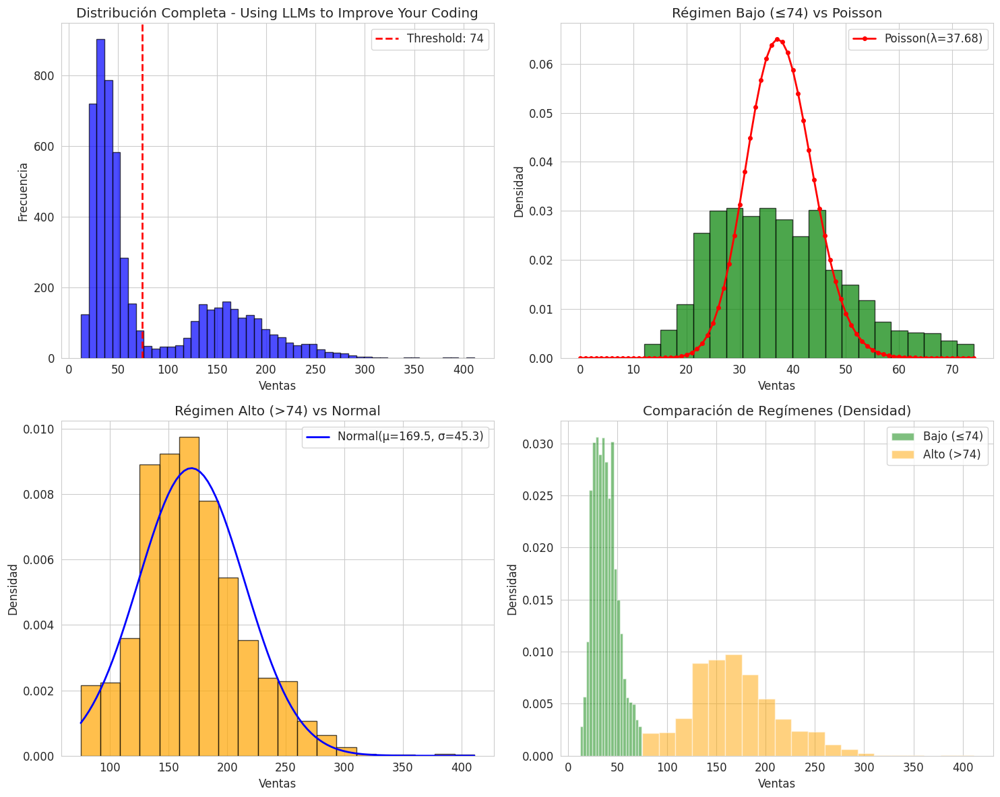


TEST DE DISTRIBUCIONES - RÉGIMEN BAJO:
  NORMAL: KS p-value = 0.0000
    Media: 37.68, Std: 12.37
  GAMMA: KS p-value = 0.0008

TEST DE DISTRIBUCIONES - RÉGIMEN ALTO:
  NORMAL: KS p-value = 0.0000
    Media: 169.51, Std: 45.33
  GAMMA: KS p-value = 0.0176

🎯 BÚSQUEDA DE THRESHOLD ÓPTIMO:

TOP 3 THRESHOLDS:
  Threshold: 95.0
    Proporción bajo: 67.6%, alto: 32.4%
    Media bajo: 38.7, alto: 173.5
    Ratio medias: 4.48

  Threshold: 90.0
    Proporción bajo: 67.3%, alto: 32.7%
    Media bajo: 38.4, alto: 172.6
    Ratio medias: 4.49

  Threshold: 85.0
    Proporción bajo: 67.0%, alto: 33.0%
    Media bajo: 38.2, alto: 171.9
    Ratio medias: 4.50



In [158]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats
from scipy.optimize import minimize

# ===== 1. ANÁLISIS DE SEPARACIÓN CON THRESHOLD =====
def analyze_threshold_split(data, threshold=74):
    """Analiza la separación de datos en dos grupos usando un threshold"""
    
    low_regime = data[data <= threshold]
    high_regime = data[data > threshold]
    
    total_count = len(data)
    low_count = len(low_regime)
    high_count = len(high_regime)
    
    low_prop = low_count / total_count
    high_prop = high_count / total_count
    
    results = {
        'threshold': threshold,
        'total_count': total_count,
        'low_regime': {
            'count': low_count,
            'proportion': low_prop,
            'mean': low_regime.mean() if len(low_regime) > 0 else 0,
            'std': low_regime.std() if len(low_regime) > 0 else 0,
            'data': low_regime
        },
        'high_regime': {
            'count': high_count,
            'proportion': high_prop,
            'mean': high_regime.mean() if len(high_regime) > 0 else 0,
            'std': high_regime.std() if len(high_regime) > 0 else 0,
            'data': high_regime
        }
    }
    
    return results

# ===== 2. TEST DE DISTRIBUCIONES POR RÉGIMEN =====
def test_distributions(data, regime_name):
    """Testa qué distribución se ajusta mejor a los datos"""
    
    if len(data) < 10:
        return f"Datos insuficientes para {regime_name}"
    
    results = {}
    
    # Test Poisson (solo para enteros positivos)
    if regime_name == "low" and all(data >= 0) and all(data == data.astype(int)):
        try:
            poisson_param = stats.poisson.fit(data, method='MLE')[0]
            poisson_ks = stats.kstest(data, lambda x: stats.poisson.cdf(x, poisson_param))
            results['poisson'] = {
                'param': poisson_param,
                'ks_stat': poisson_ks.statistic,
                'p_value': poisson_ks.pvalue
            }
        except:
            results['poisson'] = {'error': 'No se pudo ajustar Poisson'}
    
    # Test Normal
    try:
        normal_params = stats.norm.fit(data)
        normal_ks = stats.kstest(data, lambda x: stats.norm.cdf(x, *normal_params))
        results['normal'] = {
            'params': normal_params,
            'ks_stat': normal_ks.statistic,
            'p_value': normal_ks.pvalue
        }
    except:
        results['normal'] = {'error': 'No se pudo ajustar Normal'}
    
    # Test Gamma (para datos positivos)
    if all(data > 0):
        try:
            gamma_params = stats.gamma.fit(data)
            gamma_ks = stats.kstest(data, lambda x: stats.gamma.cdf(x, *gamma_params))
            results['gamma'] = {
                'params': gamma_params,
                'ks_stat': gamma_ks.statistic,
                'p_value': gamma_ks.pvalue
            }
        except:
            results['gamma'] = {'error': 'No se pudo ajustar Gamma'}
    
    return results

# ===== 3. ANÁLISIS PARA UN PRODUCTO ESPECÍFICO =====
def analyze_product_mixture(train1, product_name, country_name=None, threshold=74):
    """Analiza mixture distribution para un producto específico"""
    
    print(f"\n{'='*60}")
    print(f"ANÁLISIS DE MIXTURE DISTRIBUTION")
    print(f"Producto: {product_name}")
    if country_name:
        print(f"País: {country_name}")
    print(f"Threshold: {threshold}")
    print(f"{'='*60}")
    
    # Filtrar datos
    if country_name:
        data = train1[(train1['product'] == product_name) & 
                     (train1['country'] == country_name)]['num_sold']
    else:
        data = train1[train1['product'] == product_name]['num_sold']
    
    if len(data) == 0:
        print("No se encontraron datos para los filtros especificados")
        return
    
    # Análisis de threshold
    analysis = analyze_threshold_split(data, threshold)
    
    print(f"\nRESULTADOS DE SEPARACIÓN:")
    print(f"Total observaciones: {analysis['total_count']}")
    print(f"\nRÉGIMEN BAJO (≤{threshold}):")
    print(f"  Observaciones: {analysis['low_regime']['count']} ({analysis['low_regime']['proportion']:.1%})")
    print(f"  Media: {analysis['low_regime']['mean']:.2f}")
    print(f"  Std: {analysis['low_regime']['std']:.2f}")
    
    print(f"\nRÉGIMEN ALTO (>{threshold}):")
    print(f"  Observaciones: {analysis['high_regime']['count']} ({analysis['high_regime']['proportion']:.1%})")
    print(f"  Media: {analysis['high_regime']['mean']:.2f}")
    print(f"  Std: {analysis['high_regime']['std']:.2f}")
    
    # Visualización
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Histograma completo
    axes[0,0].hist(data, bins=50, alpha=0.7, color='blue', edgecolor='black')
    axes[0,0].axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold: {threshold}')
    axes[0,0].set_title(f'Distribución Completa - {product_name}')
    axes[0,0].set_xlabel('Ventas')
    axes[0,0].set_ylabel('Frecuencia')
    axes[0,0].legend()
    
    # Régimen bajo con Poisson ajustada
    if len(analysis['low_regime']['data']) > 0:
        low_data = analysis['low_regime']['data']
        n, bins, patches = axes[0,1].hist(low_data, bins=20, alpha=0.7, color='green', edgecolor='black', density=True)
        
        # Ajustar Poisson
        poisson_lambda = low_data.mean()
        x_poisson = np.arange(0, int(low_data.max()) + 1)
        y_poisson = stats.poisson.pmf(x_poisson, poisson_lambda)
        axes[0,1].plot(x_poisson, y_poisson, 'ro-', linewidth=2, markersize=4, label=f'Poisson(λ={poisson_lambda:.2f})')
        
        axes[0,1].set_title(f'Régimen Bajo (≤{threshold}) vs Poisson')
        axes[0,1].set_xlabel('Ventas')
        axes[0,1].set_ylabel('Densidad')
        axes[0,1].legend()
    
    # Régimen alto con Normal ajustada
    if len(analysis['high_regime']['data']) > 0:
        high_data = analysis['high_regime']['data']
        n, bins, patches = axes[1,0].hist(high_data, bins=20, alpha=0.7, color='orange', edgecolor='black', density=True)
        
        # Ajustar Normal
        normal_mu = high_data.mean()
        normal_sigma = high_data.std()
        x_normal = np.linspace(high_data.min(), high_data.max(), 100)
        y_normal = stats.norm.pdf(x_normal, normal_mu, normal_sigma)
        axes[1,0].plot(x_normal, y_normal, 'b-', linewidth=2, label=f'Normal(μ={normal_mu:.1f}, σ={normal_sigma:.1f})')
        
        axes[1,0].set_title(f'Régimen Alto (>{threshold}) vs Normal')
        axes[1,0].set_xlabel('Ventas')
        axes[1,0].set_ylabel('Densidad')
        axes[1,0].legend()
    
    # Comparación de distribuciones
    axes[1,1].hist(analysis['low_regime']['data'], bins=20, alpha=0.5, color='green', label=f'Bajo (≤{threshold})', density=True)
    axes[1,1].hist(analysis['high_regime']['data'], bins=20, alpha=0.5, color='orange', label=f'Alto (>{threshold})', density=True)
    axes[1,1].set_title('Comparación de Regímenes (Densidad)')
    axes[1,1].set_xlabel('Ventas')
    axes[1,1].set_ylabel('Densidad')
    axes[1,1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Test distribuciones
    if len(analysis['low_regime']['data']) > 10:
        print(f"\nTEST DE DISTRIBUCIONES - RÉGIMEN BAJO:")
        low_tests = test_distributions(analysis['low_regime']['data'], "low")
        for dist_name, result in low_tests.items():
            if isinstance(result, dict) and 'p_value' in result:
                print(f"  {dist_name.upper()}: KS p-value = {result['p_value']:.4f}")
                if dist_name == 'poisson':
                    print(f"    Lambda estimado: {result['param']:.2f}")
                elif dist_name == 'normal':
                    print(f"    Media: {result['params'][0]:.2f}, Std: {result['params'][1]:.2f}")
    
    if len(analysis['high_regime']['data']) > 10:
        print(f"\nTEST DE DISTRIBUCIONES - RÉGIMEN ALTO:")
        high_tests = test_distributions(analysis['high_regime']['data'], "high")
        for dist_name, result in high_tests.items():
            if isinstance(result, dict) and 'p_value' in result:
                print(f"  {dist_name.upper()}: KS p-value = {result['p_value']:.4f}")
                if dist_name == 'normal':
                    print(f"    Media: {result['params'][0]:.2f}, Std: {result['params'][1]:.2f}")
    
    return analysis

# ===== 4. ANÁLISIS PARA MÚLTIPLES THRESHOLDS =====
def find_optimal_threshold(data, threshold_range=range(50, 100, 5)):
    """Encuentra el threshold óptimo basado en criterios estadísticos"""
    
    results = []
    
    for threshold in threshold_range:
        analysis = analyze_threshold_split(data, threshold)
        
        # Criterios para evaluar la separación
        # 1. Balance en las proporciones (evitar que un grupo sea muy pequeño)
        balance_score = 1 - abs(0.5 - analysis['low_regime']['proportion'])
        
        # 2. Diferencia en medias (queremos que los grupos sean bien diferentes)
        if analysis['high_regime']['count'] > 0 and analysis['low_regime']['count'] > 0:
            mean_diff = abs(analysis['high_regime']['mean'] - analysis['low_regime']['mean'])
        else:
            mean_diff = 0
        
        # 3. Ratio de medias
        if analysis['low_regime']['mean'] > 0:
            mean_ratio = analysis['high_regime']['mean'] / analysis['low_regime']['mean']
        else:
            mean_ratio = 0
        
        results.append({
            'threshold': threshold,
            'low_prop': analysis['low_regime']['proportion'],
            'high_prop': analysis['high_regime']['proportion'],
            'low_mean': analysis['low_regime']['mean'],
            'high_mean': analysis['high_regime']['mean'],
            'mean_diff': mean_diff,
            'mean_ratio': mean_ratio,
            'balance_score': balance_score
        })
    
    results_df = pd.DataFrame(results)
    return results_df

# ===== EJECUCIÓN DEL ANÁLISIS =====

# Obtener lista de productos
products = train1['product'].unique()
countries = train1['country'].unique()

print("PRODUCTOS DISPONIBLES:")
for i, product in enumerate(products):
    print(f"{i+1}. {product}")

print("\nPAÍSES DISPONIBLES:")
for i, country in enumerate(countries):
    print(f"{i+1}. {country}")

# Análisis para el primer producto como ejemplo
if len(products) > 0:
    example_product = products[0]
    example_country = countries[0]
    
    print(f"\n🔍 ANÁLISIS DE EJEMPLO:")
    print(f"Producto: {example_product}")
    print(f"País: {example_country}")
    
    # Análisis con threshold 74
    analysis_74 = analyze_product_mixture(train1, example_product, example_country, threshold=74)
    
    # Buscar threshold óptimo
    product_data = train1[(train1['product'] == example_product) & 
                         (train1['country'] == example_country)]['num_sold']
    
    print(f"\n🎯 BÚSQUEDA DE THRESHOLD ÓPTIMO:")
    threshold_analysis = find_optimal_threshold(product_data)
    
    # Mostrar los mejores thresholds
    threshold_analysis['score'] = (threshold_analysis['balance_score'] * 
                                  threshold_analysis['mean_diff'] / 100)
    
    best_thresholds = threshold_analysis.nlargest(3, 'score')
    print("\nTOP 3 THRESHOLDS:")
    for idx, row in best_thresholds.iterrows():
        print(f"  Threshold: {row['threshold']}")
        print(f"    Proporción bajo: {row['low_prop']:.1%}, alto: {row['high_prop']:.1%}")
        print(f"    Media bajo: {row['low_mean']:.1f}, alto: {row['high_mean']:.1f}")
        print(f"    Ratio medias: {row['mean_ratio']:.2f}")
        print()



PRODUCTOS DISPONIBLES:
1. Using LLMs to Improve Your Coding
2. Using LLMs to Train More LLMs
3. Using LLMs to Win Friends and Influence People
4. Using LLMs to Win More Kaggle Competitions
5. Using LLMs to Write Better

PAÍSES DISPONIBLES:
1. Argentina
2. Canada
3. Estonia
4. Japan
5. Spain

🔍 ANÁLISIS DE EJEMPLO:
Producto: Using LLMs to Improve Your Coding
País: Argentina

ANÁLISIS DE MIXTURE DISTRIBUTION
Producto: Using LLMs to Improve Your Coding
País: Argentina
Threshold: 74

RESULTADOS DE SEPARACIÓN:
Total observaciones: 5478

RÉGIMEN BAJO (≤74):
  Observaciones: 3623 (66.1%)
  Media: 37.68
  Std: 12.37

RÉGIMEN ALTO (>74):
  Observaciones: 1855 (33.9%)
  Media: 169.51
  Std: 45.34


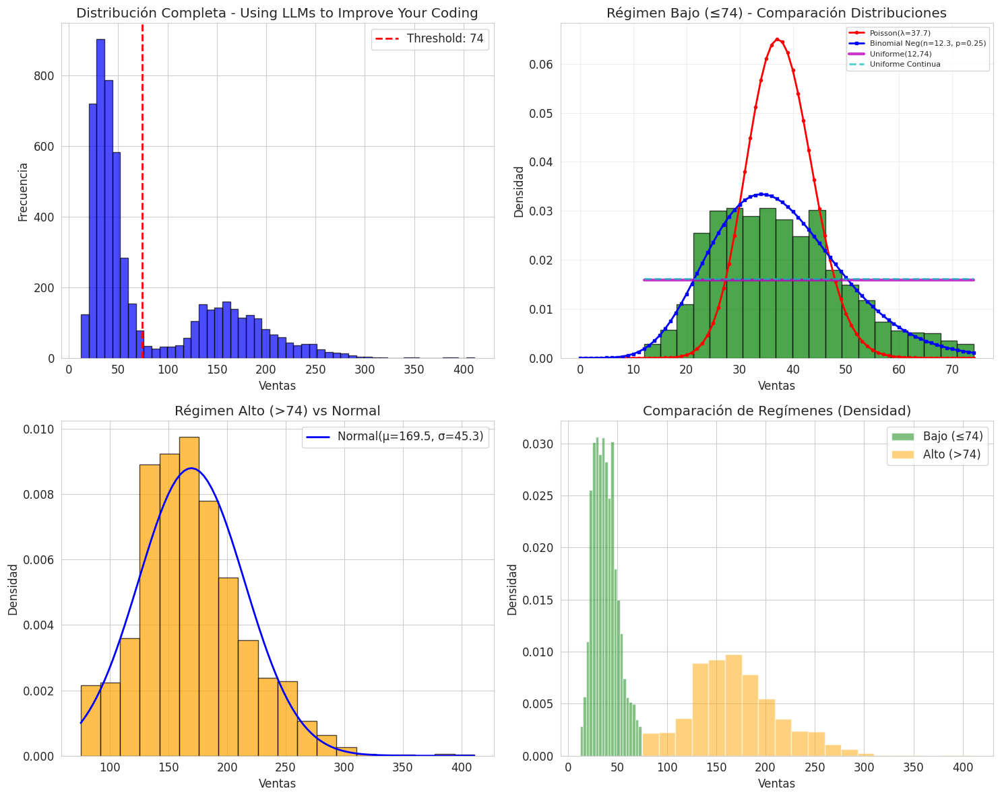


TEST DE DISTRIBUCIONES - RÉGIMEN BAJO:
  NORMAL: KS p-value = 0.0000
    Media: 37.68, Std: 12.37
  GAMMA: KS p-value = 0.0008

TEST DE DISTRIBUCIONES - RÉGIMEN ALTO:
  NORMAL: KS p-value = 0.0000
    Media: 169.51, Std: 45.33
  GAMMA: KS p-value = 0.0176

🎯 BÚSQUEDA DE THRESHOLD ÓPTIMO:

TOP 3 THRESHOLDS:
  Threshold: 95.0
    Proporción bajo: 67.6%, alto: 32.4%
    Media bajo: 38.7, alto: 173.5
    Ratio medias: 4.48

  Threshold: 90.0
    Proporción bajo: 67.3%, alto: 32.7%
    Media bajo: 38.4, alto: 172.6
    Ratio medias: 4.49

  Threshold: 85.0
    Proporción bajo: 67.0%, alto: 33.0%
    Media bajo: 38.2, alto: 171.9
    Ratio medias: 4.50



In [159]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats
from scipy.optimize import minimize

# ===== 1. ANÁLISIS DE SEPARACIÓN CON THRESHOLD =====
def analyze_threshold_split(data, threshold=74):
    """Analiza la separación de datos en dos grupos usando un threshold"""
    
    low_regime = data[data <= threshold]
    high_regime = data[data > threshold]
    
    total_count = len(data)
    low_count = len(low_regime)
    high_count = len(high_regime)
    
    low_prop = low_count / total_count
    high_prop = high_count / total_count
    
    results = {
        'threshold': threshold,
        'total_count': total_count,
        'low_regime': {
            'count': low_count,
            'proportion': low_prop,
            'mean': low_regime.mean() if len(low_regime) > 0 else 0,
            'std': low_regime.std() if len(low_regime) > 0 else 0,
            'data': low_regime
        },
        'high_regime': {
            'count': high_count,
            'proportion': high_prop,
            'mean': high_regime.mean() if len(high_regime) > 0 else 0,
            'std': high_regime.std() if len(high_regime) > 0 else 0,
            'data': high_regime
        }
    }
    
    return results

# ===== 2. TEST DE DISTRIBUCIONES POR RÉGIMEN =====
def test_distributions(data, regime_name):
    """Testa qué distribución se ajusta mejor a los datos"""
    
    if len(data) < 10:
        return f"Datos insuficientes para {regime_name}"
    
    results = {}
    
    # Test Poisson (solo para enteros positivos)
    if regime_name == "low" and all(data >= 0) and all(data == data.astype(int)):
        try:
            poisson_param = stats.poisson.fit(data, method='MLE')[0]
            poisson_ks = stats.kstest(data, lambda x: stats.poisson.cdf(x, poisson_param))
            results['poisson'] = {
                'param': poisson_param,
                'ks_stat': poisson_ks.statistic,
                'p_value': poisson_ks.pvalue
            }
        except:
            results['poisson'] = {'error': 'No se pudo ajustar Poisson'}
    
    # Test Normal
    try:
        normal_params = stats.norm.fit(data)
        normal_ks = stats.kstest(data, lambda x: stats.norm.cdf(x, *normal_params))
        results['normal'] = {
            'params': normal_params,
            'ks_stat': normal_ks.statistic,
            'p_value': normal_ks.pvalue
        }
    except:
        results['normal'] = {'error': 'No se pudo ajustar Normal'}
    
    # Test Gamma (para datos positivos)
    if all(data > 0):
        try:
            gamma_params = stats.gamma.fit(data)
            gamma_ks = stats.kstest(data, lambda x: stats.gamma.cdf(x, *gamma_params))
            results['gamma'] = {
                'params': gamma_params,
                'ks_stat': gamma_ks.statistic,
                'p_value': gamma_ks.pvalue
            }
        except:
            results['gamma'] = {'error': 'No se pudo ajustar Gamma'}
    
    return results

# ===== 3. ANÁLISIS PARA UN PRODUCTO ESPECÍFICO =====
def analyze_product_mixture(train1, product_name, country_name=None, threshold=74):
    """Analiza mixture distribution para un producto específico"""
    
    print(f"\n{'='*60}")
    print(f"ANÁLISIS DE MIXTURE DISTRIBUTION")
    print(f"Producto: {product_name}")
    if country_name:
        print(f"País: {country_name}")
    print(f"Threshold: {threshold}")
    print(f"{'='*60}")
    
    # Filtrar datos
    if country_name:
        data = train1[(train1['product'] == product_name) & 
                     (train1['country'] == country_name)]['num_sold']
    else:
        data = train1[train1['product'] == product_name]['num_sold']
    
    if len(data) == 0:
        print("No se encontraron datos para los filtros especificados")
        return
    
    # Análisis de threshold
    analysis = analyze_threshold_split(data, threshold)
    
    print(f"\nRESULTADOS DE SEPARACIÓN:")
    print(f"Total observaciones: {analysis['total_count']}")
    print(f"\nRÉGIMEN BAJO (≤{threshold}):")
    print(f"  Observaciones: {analysis['low_regime']['count']} ({analysis['low_regime']['proportion']:.1%})")
    print(f"  Media: {analysis['low_regime']['mean']:.2f}")
    print(f"  Std: {analysis['low_regime']['std']:.2f}")
    
    print(f"\nRÉGIMEN ALTO (>{threshold}):")
    print(f"  Observaciones: {analysis['high_regime']['count']} ({analysis['high_regime']['proportion']:.1%})")
    print(f"  Media: {analysis['high_regime']['mean']:.2f}")
    print(f"  Std: {analysis['high_regime']['std']:.2f}")
    
    # Visualización
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Histograma completo
    axes[0,0].hist(data, bins=50, alpha=0.7, color='blue', edgecolor='black')
    axes[0,0].axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold: {threshold}')
    axes[0,0].set_title(f'Distribución Completa - {product_name}')
    axes[0,0].set_xlabel('Ventas')
    axes[0,0].set_ylabel('Frecuencia')
    axes[0,0].legend()
    
    # Régimen bajo con múltiples distribuciones
    if len(analysis['low_regime']['data']) > 0:
        low_data = analysis['low_regime']['data']
        n, bins, patches = axes[0,1].hist(low_data, bins=20, alpha=0.7, color='green', edgecolor='black', density=True)
        
        # 1. Poisson
        poisson_lambda = low_data.mean()
        x_discrete = np.arange(0, int(low_data.max()) + 1)
        y_poisson = stats.poisson.pmf(x_discrete, poisson_lambda)
        axes[0,1].plot(x_discrete, y_poisson, 'ro-', linewidth=2, markersize=3, label=f'Poisson(λ={poisson_lambda:.1f})')
        
        # 2. Binomial Negativa (usando método de momentos)
        try:
            mean_low = low_data.mean()
            var_low = low_data.var()
            if var_low > mean_low:  # Solo si hay sobredispersión
                # Parámetros por método de momentos: n, p
                p_est = mean_low / var_low
                n_est = mean_low * p_est / (1 - p_est)
                if 0 < p_est < 1 and n_est > 0:
                    y_nbinom = stats.nbinom.pmf(x_discrete, n_est, p_est)
                    axes[0,1].plot(x_discrete, y_nbinom, 'bs-', linewidth=2, markersize=3, 
                                 label=f'Binomial Neg(n={n_est:.1f}, p={p_est:.2f})')
        except:
            pass
        
        # 3. Uniforme Discreta (aproximación)
        min_val = int(low_data.min())
        max_val = int(low_data.max())
        uniform_prob = 1.0 / (max_val - min_val + 1)
        x_uniform = np.arange(min_val, max_val + 1)
        y_uniform = np.full(len(x_uniform), uniform_prob)
        axes[0,1].plot(x_uniform, y_uniform, 'm-', linewidth=3, alpha=0.8, 
                     label=f'Uniforme({min_val},{max_val})')
        
        # 4. Uniforme continua (para referencia visual)
        x_cont = np.linspace(low_data.min(), low_data.max(), 100)
        y_uniform_cont = stats.uniform.pdf(x_cont, low_data.min(), low_data.max() - low_data.min())
        axes[0,1].plot(x_cont, y_uniform_cont, 'c--', linewidth=2, alpha=0.7, 
                     label=f'Uniforme Continua')
        
        axes[0,1].set_title(f'Régimen Bajo (≤{threshold}) - Comparación Distribuciones')
        axes[0,1].set_xlabel('Ventas')
        axes[0,1].set_ylabel('Densidad')
        axes[0,1].legend(fontsize=8)
        axes[0,1].grid(True, alpha=0.3)
    
    # Régimen alto con Normal ajustada
    if len(analysis['high_regime']['data']) > 0:
        high_data = analysis['high_regime']['data']
        n, bins, patches = axes[1,0].hist(high_data, bins=20, alpha=0.7, color='orange', edgecolor='black', density=True)
        
        # Ajustar Normal
        normal_mu = high_data.mean()
        normal_sigma = high_data.std()
        x_normal = np.linspace(high_data.min(), high_data.max(), 100)
        y_normal = stats.norm.pdf(x_normal, normal_mu, normal_sigma)
        axes[1,0].plot(x_normal, y_normal, 'b-', linewidth=2, label=f'Normal(μ={normal_mu:.1f}, σ={normal_sigma:.1f})')
        
        axes[1,0].set_title(f'Régimen Alto (>{threshold}) vs Normal')
        axes[1,0].set_xlabel('Ventas')
        axes[1,0].set_ylabel('Densidad')
        axes[1,0].legend()
    
    # Comparación de distribuciones
    axes[1,1].hist(analysis['low_regime']['data'], bins=20, alpha=0.5, color='green', label=f'Bajo (≤{threshold})', density=True)
    axes[1,1].hist(analysis['high_regime']['data'], bins=20, alpha=0.5, color='orange', label=f'Alto (>{threshold})', density=True)
    axes[1,1].set_title('Comparación de Regímenes (Densidad)')
    axes[1,1].set_xlabel('Ventas')
    axes[1,1].set_ylabel('Densidad')
    axes[1,1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Test distribuciones
    if len(analysis['low_regime']['data']) > 10:
        print(f"\nTEST DE DISTRIBUCIONES - RÉGIMEN BAJO:")
        low_tests = test_distributions(analysis['low_regime']['data'], "low")
        for dist_name, result in low_tests.items():
            if isinstance(result, dict) and 'p_value' in result:
                print(f"  {dist_name.upper()}: KS p-value = {result['p_value']:.4f}")
                if dist_name == 'poisson':
                    print(f"    Lambda estimado: {result['param']:.2f}")
                elif dist_name == 'normal':
                    print(f"    Media: {result['params'][0]:.2f}, Std: {result['params'][1]:.2f}")
    
    if len(analysis['high_regime']['data']) > 10:
        print(f"\nTEST DE DISTRIBUCIONES - RÉGIMEN ALTO:")
        high_tests = test_distributions(analysis['high_regime']['data'], "high")
        for dist_name, result in high_tests.items():
            if isinstance(result, dict) and 'p_value' in result:
                print(f"  {dist_name.upper()}: KS p-value = {result['p_value']:.4f}")
                if dist_name == 'normal':
                    print(f"    Media: {result['params'][0]:.2f}, Std: {result['params'][1]:.2f}")
    
    return analysis

# ===== 4. ANÁLISIS PARA MÚLTIPLES THRESHOLDS =====
def find_optimal_threshold(data, threshold_range=range(50, 100, 5)):
    """Encuentra el threshold óptimo basado en criterios estadísticos"""
    
    results = []
    
    for threshold in threshold_range:
        analysis = analyze_threshold_split(data, threshold)
        
        # Criterios para evaluar la separación
        # 1. Balance en las proporciones (evitar que un grupo sea muy pequeño)
        balance_score = 1 - abs(0.5 - analysis['low_regime']['proportion'])
        
        # 2. Diferencia en medias (queremos que los grupos sean bien diferentes)
        if analysis['high_regime']['count'] > 0 and analysis['low_regime']['count'] > 0:
            mean_diff = abs(analysis['high_regime']['mean'] - analysis['low_regime']['mean'])
        else:
            mean_diff = 0
        
        # 3. Ratio de medias
        if analysis['low_regime']['mean'] > 0:
            mean_ratio = analysis['high_regime']['mean'] / analysis['low_regime']['mean']
        else:
            mean_ratio = 0
        
        results.append({
            'threshold': threshold,
            'low_prop': analysis['low_regime']['proportion'],
            'high_prop': analysis['high_regime']['proportion'],
            'low_mean': analysis['low_regime']['mean'],
            'high_mean': analysis['high_regime']['mean'],
            'mean_diff': mean_diff,
            'mean_ratio': mean_ratio,
            'balance_score': balance_score
        })
    
    results_df = pd.DataFrame(results)
    return results_df

# ===== EJECUCIÓN DEL ANÁLISIS =====

# Obtener lista de productos
products = train1['product'].unique()
countries = train1['country'].unique()

print("PRODUCTOS DISPONIBLES:")
for i, product in enumerate(products):
    print(f"{i+1}. {product}")

print("\nPAÍSES DISPONIBLES:")
for i, country in enumerate(countries):
    print(f"{i+1}. {country}")

# Análisis para el primer producto como ejemplo
if len(products) > 0:
    example_product = products[0]
    example_country = countries[0]
    
    print(f"\n🔍 ANÁLISIS DE EJEMPLO:")
    print(f"Producto: {example_product}")
    print(f"País: {example_country}")
    
    # Análisis con threshold 74
    analysis_74 = analyze_product_mixture(train1, example_product, example_country, threshold=74)
    
    # Buscar threshold óptimo
    product_data = train1[(train1['product'] == example_product) & 
                         (train1['country'] == example_country)]['num_sold']
    
    print(f"\n🎯 BÚSQUEDA DE THRESHOLD ÓPTIMO:")
    threshold_analysis = find_optimal_threshold(product_data)
    
    # Mostrar los mejores thresholds
    threshold_analysis['score'] = (threshold_analysis['balance_score'] * 
                                  threshold_analysis['mean_diff'] / 100)
    
    best_thresholds = threshold_analysis.nlargest(3, 'score')
    print("\nTOP 3 THRESHOLDS:")
    for idx, row in best_thresholds.iterrows():
        print(f"  Threshold: {row['threshold']}")
        print(f"    Proporción bajo: {row['low_prop']:.1%}, alto: {row['high_prop']:.1%}")
        print(f"    Media bajo: {row['low_mean']:.1f}, alto: {row['high_mean']:.1f}")
        print(f"    Ratio medias: {row['mean_ratio']:.2f}")
        print()



In [160]:
# se ve , regimen bajo =<74 66% es binomial negativa o 
#         regiment alto >74 34% es normal
# mejor dicho se puede adepatar de esa manera
# este caso es para Argentina con el producto "Using LLMs to Improve Your Coding"


=== ANÁLISIS DE REGÍMENES Y VISUALIZACIÓN ===

PAÍS: ARGENTINA

--- Producto: Using LLMs to Improve Your Coding ---
Total observaciones: 5478, Rango: 12-411, Media: 82.3

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


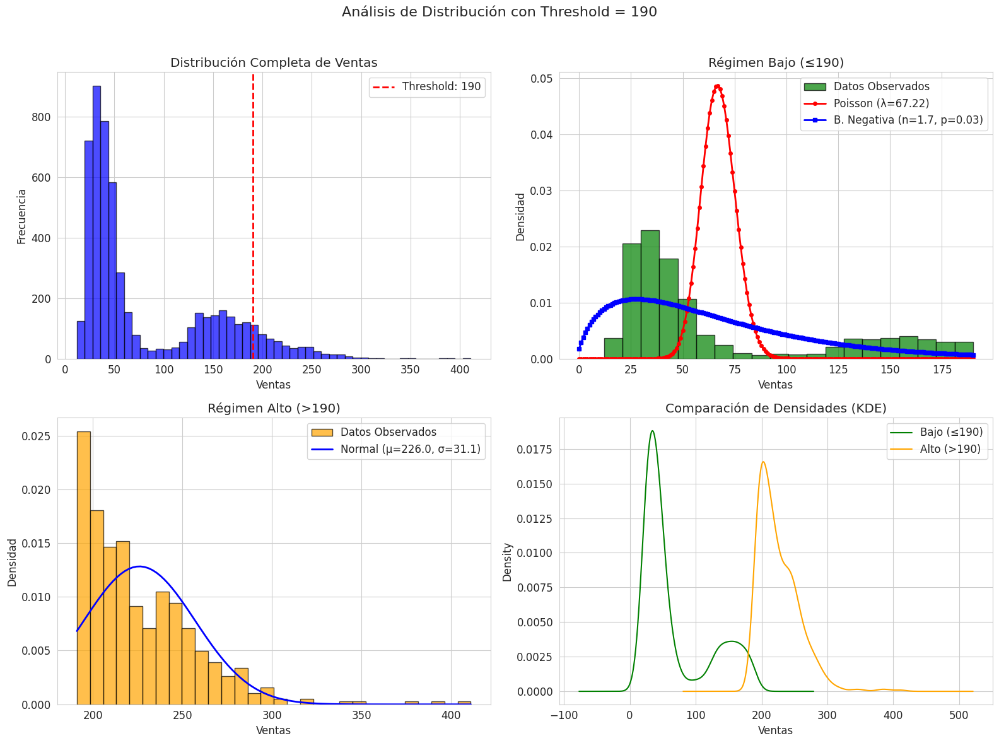


--- Producto: Using LLMs to Train More LLMs ---
Total observaciones: 5478, Rango: 15-398, Media: 81.2

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


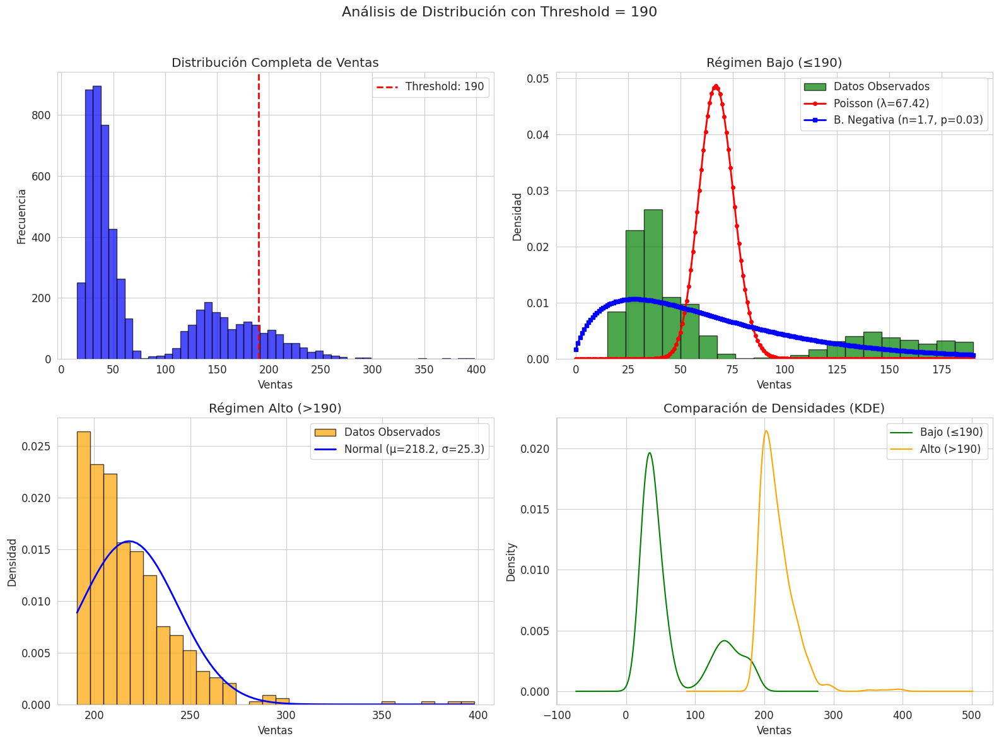


--- Producto: Using LLMs to Win Friends and Influence People ---
Total observaciones: 5478, Rango: 2-61, Media: 12.4

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 40

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


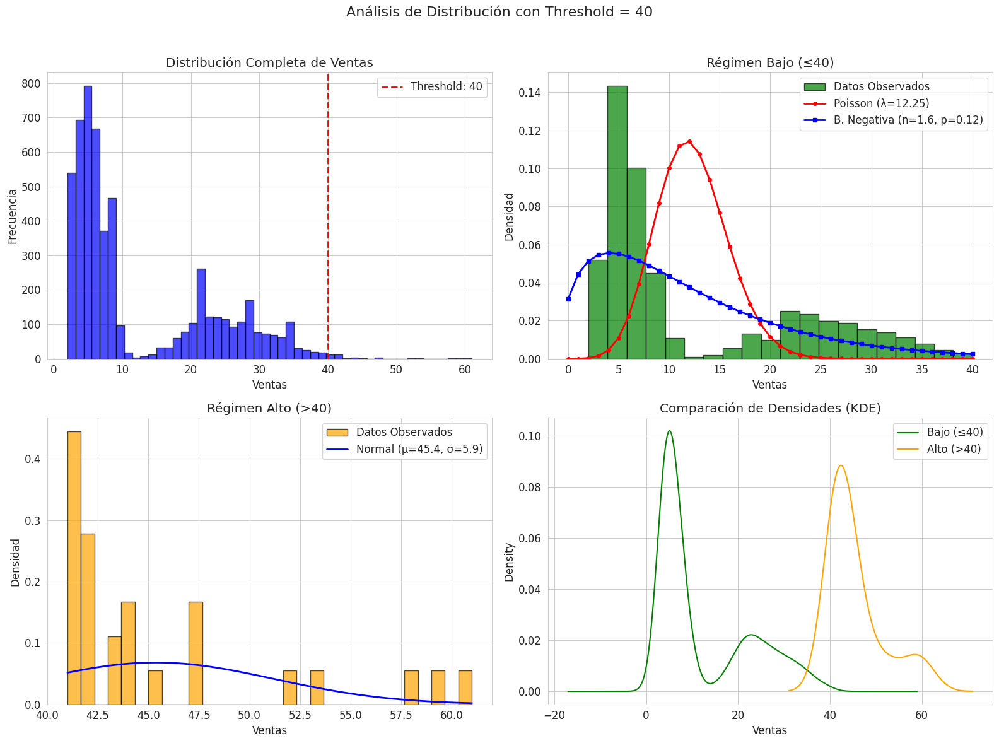


--- Producto: Using LLMs to Win More Kaggle Competitions ---
Total observaciones: 5478, Rango: 11-364, Media: 68.8

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


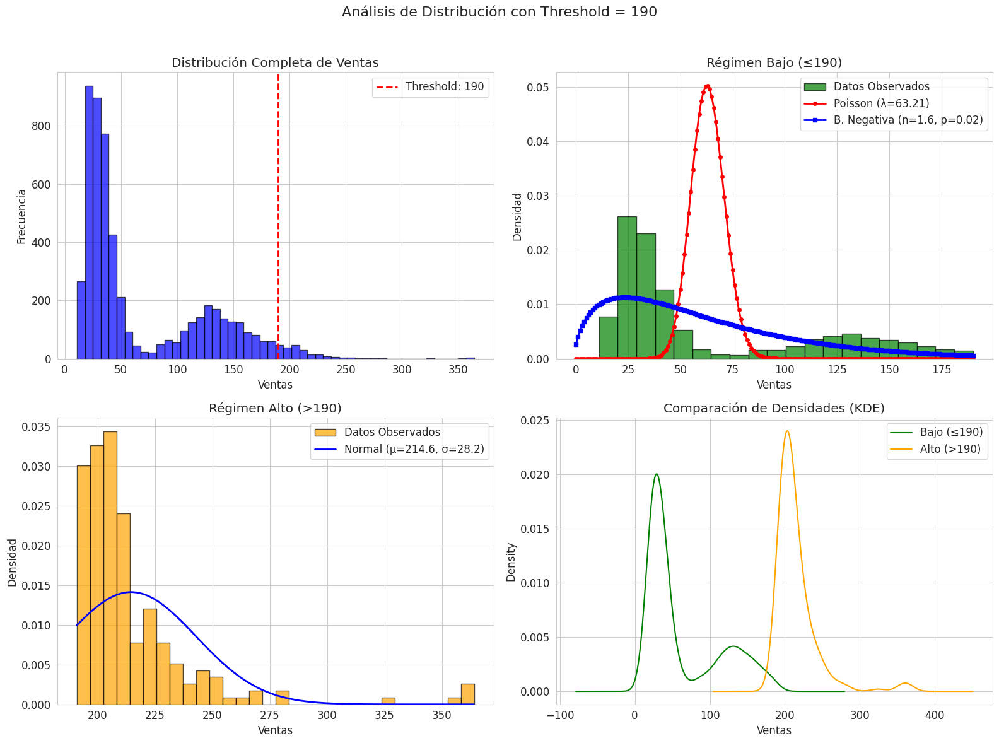


--- Producto: Using LLMs to Write Better ---
Total observaciones: 5478, Rango: 11-292, Media: 62.6

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


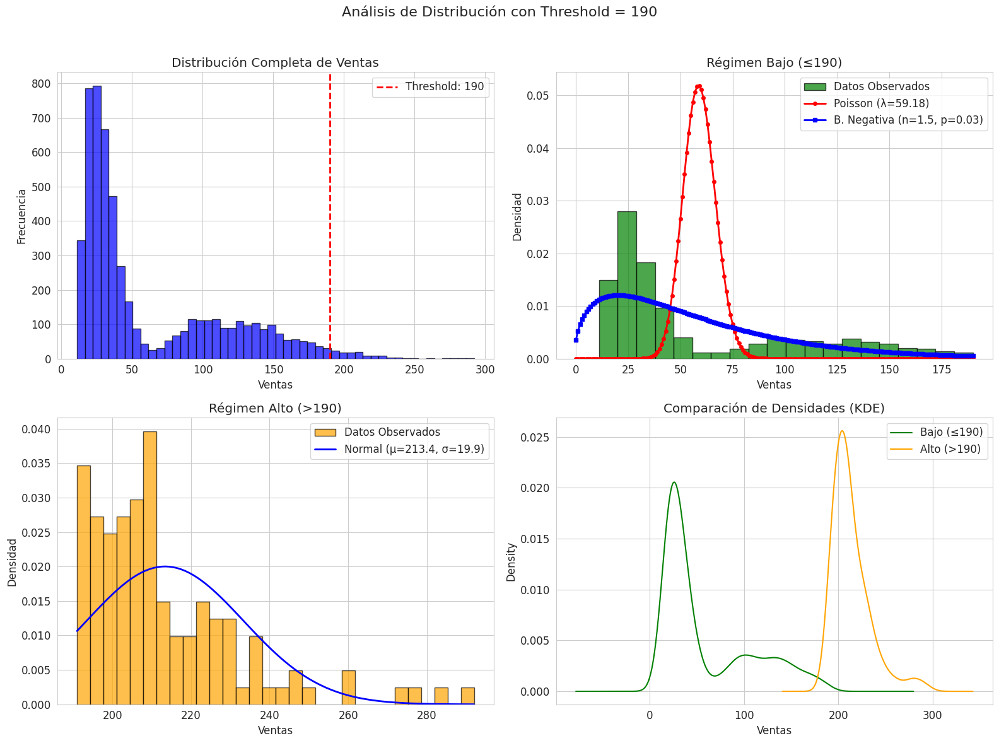

PAÍS: CANADA

--- Producto: Using LLMs to Improve Your Coding ---
Total observaciones: 5478, Rango: 65-1380, Media: 343.0

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


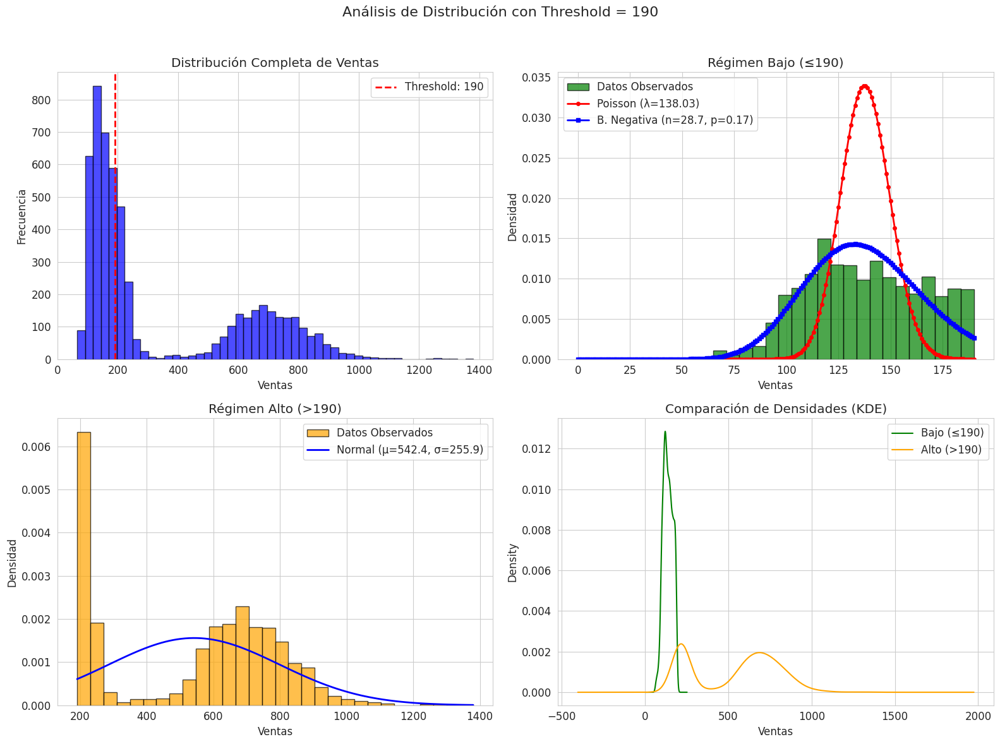


--- Producto: Using LLMs to Train More LLMs ---
Total observaciones: 5478, Rango: 78-1349, Media: 338.1

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


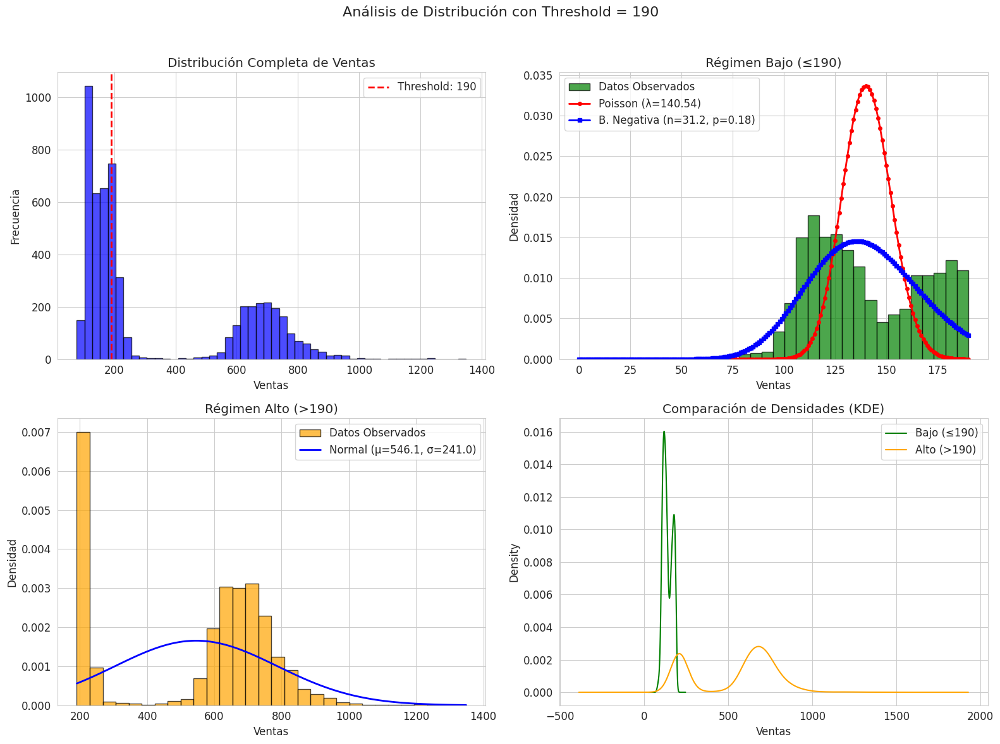


--- Producto: Using LLMs to Win Friends and Influence People ---
Total observaciones: 5478, Rango: 11-211, Media: 52.8

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 170

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


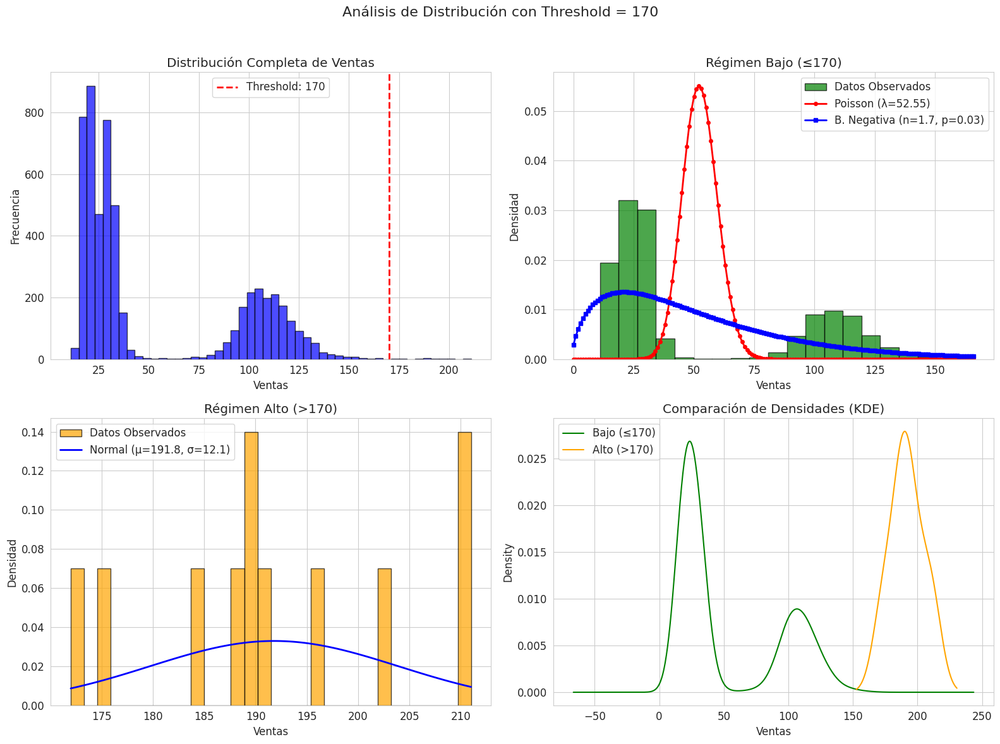


--- Producto: Using LLMs to Win More Kaggle Competitions ---
Total observaciones: 5478, Rango: 57-1247, Media: 286.3

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


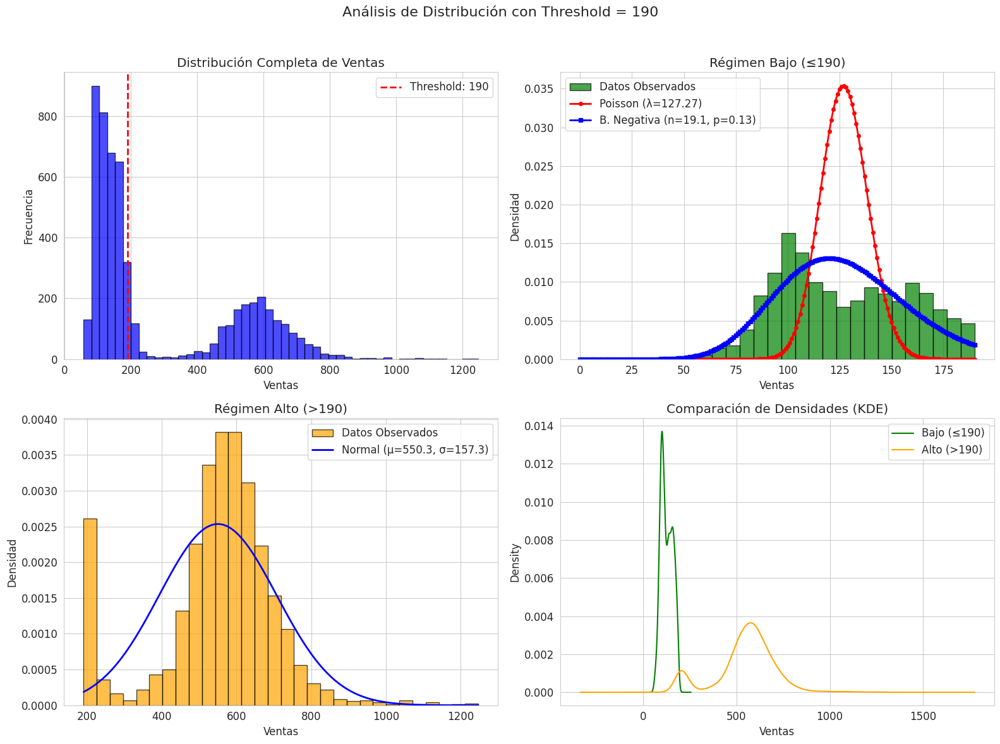


--- Producto: Using LLMs to Write Better ---
Total observaciones: 5478, Rango: 57-1009, Media: 260.1

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


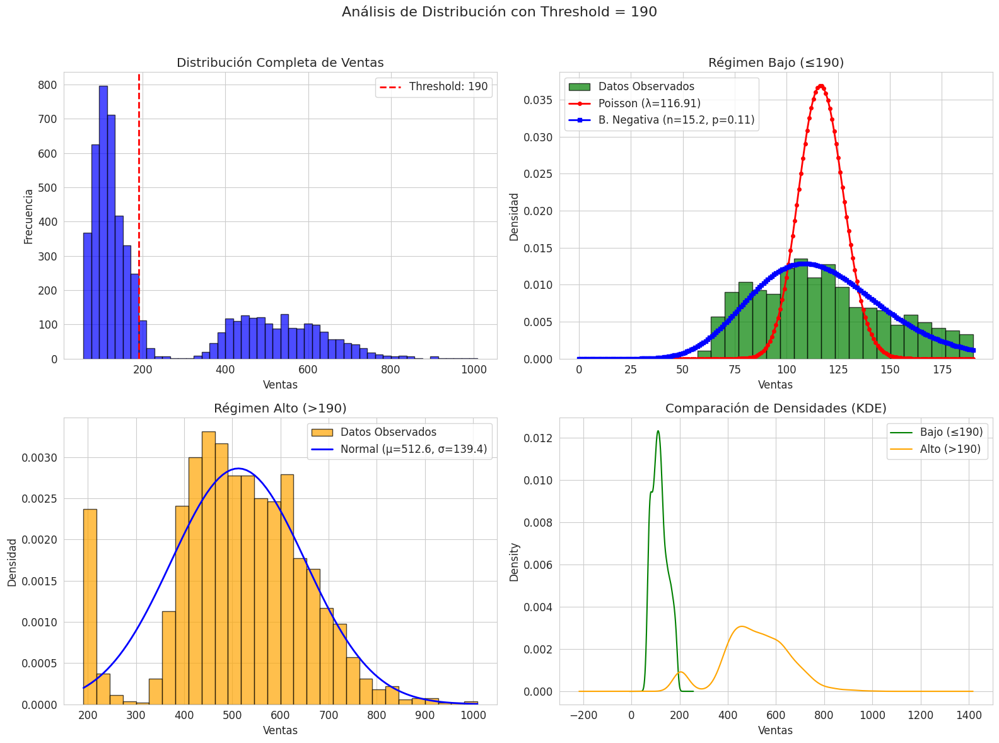

PAÍS: ESTONIA

--- Producto: Using LLMs to Improve Your Coding ---
Total observaciones: 5478, Rango: 34-771, Media: 174.7

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


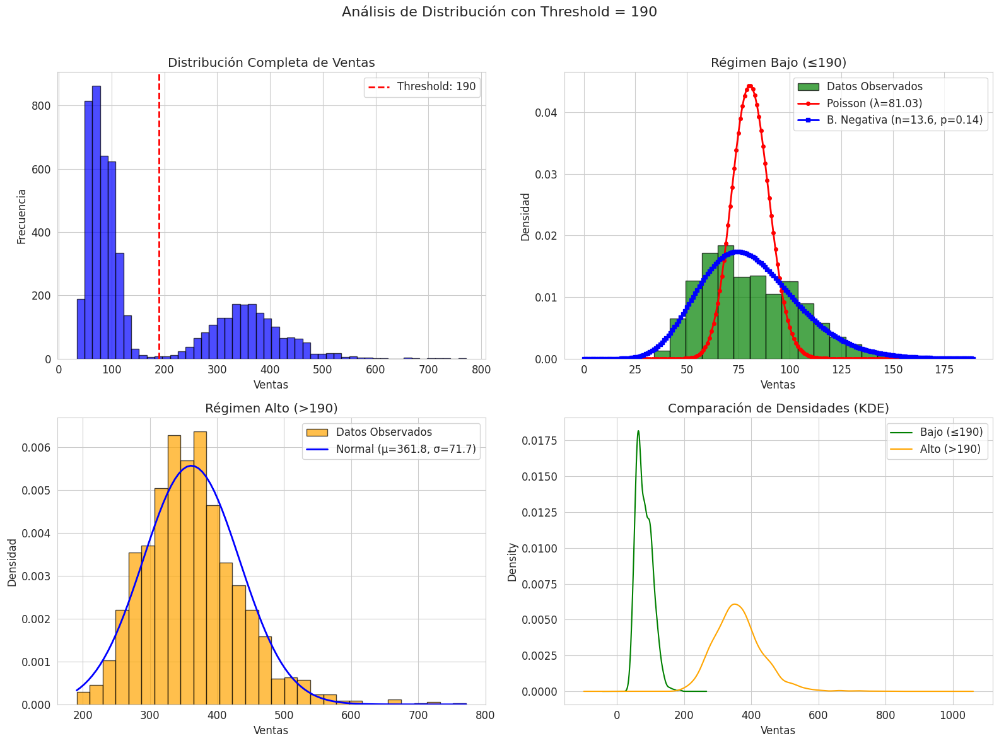


--- Producto: Using LLMs to Train More LLMs ---
Total observaciones: 5478, Rango: 39-755, Media: 172.7

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


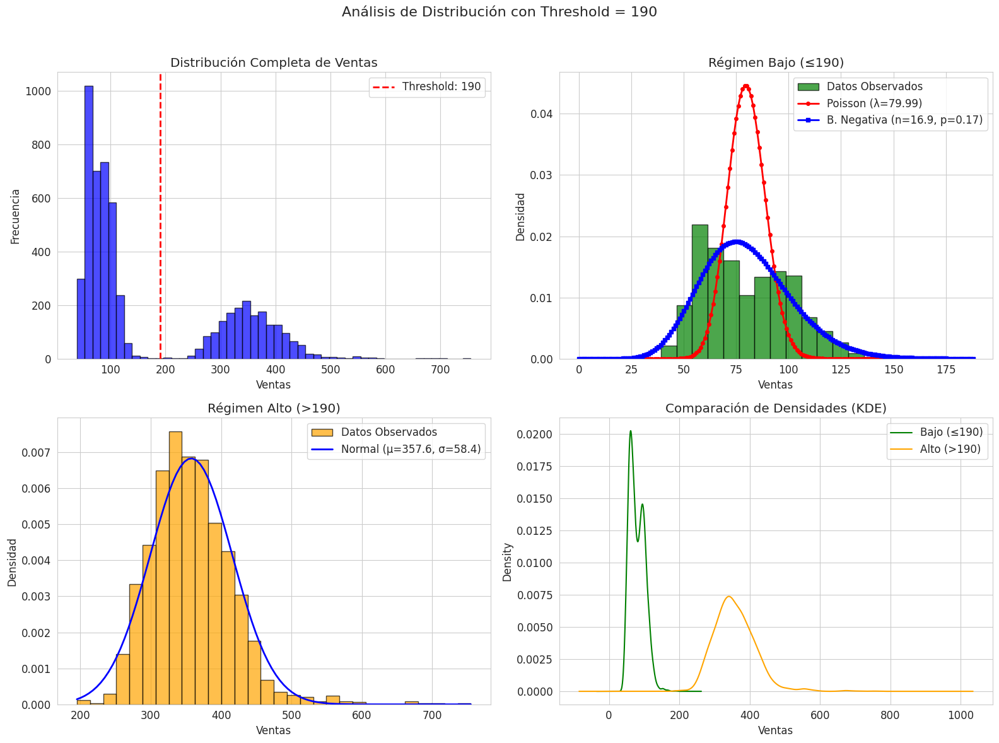


--- Producto: Using LLMs to Win Friends and Influence People ---
Total observaciones: 5478, Rango: 6-116, Media: 26.8

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 90

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


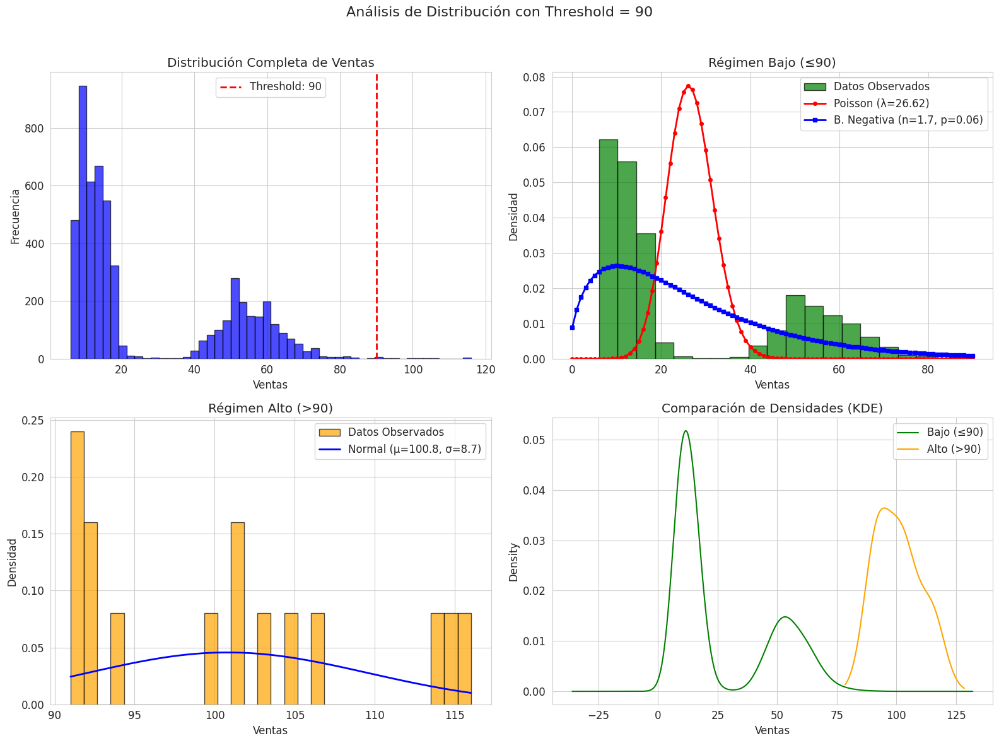


--- Producto: Using LLMs to Win More Kaggle Competitions ---
Total observaciones: 5478, Rango: 31-729, Media: 146.0

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


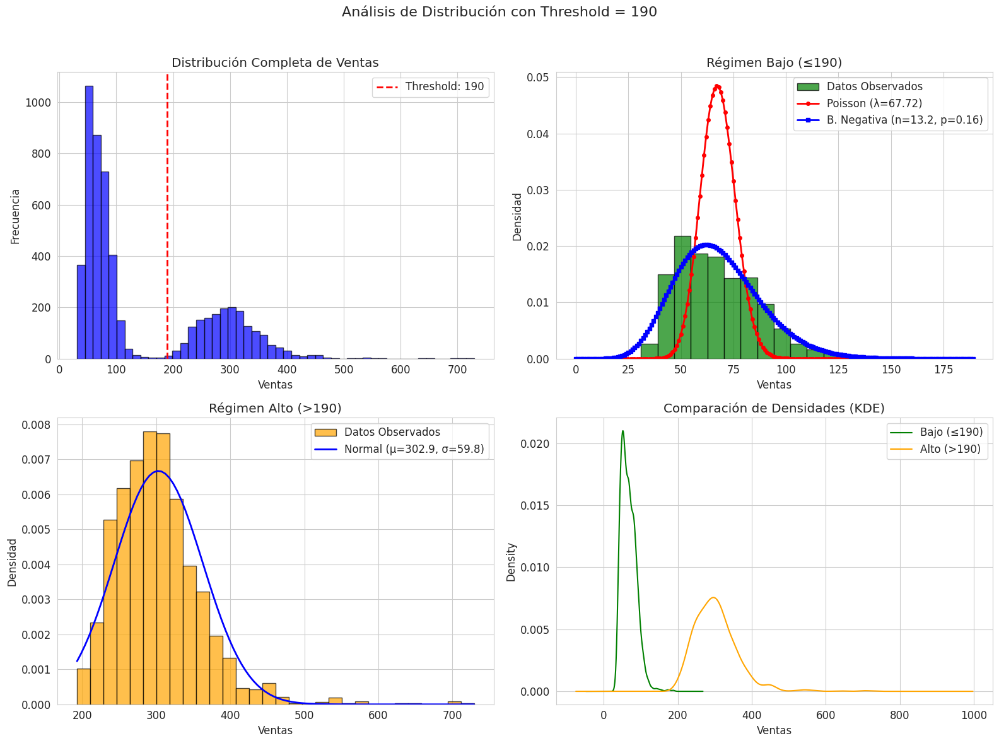


--- Producto: Using LLMs to Write Better ---
Total observaciones: 5478, Rango: 29-551, Media: 132.8

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


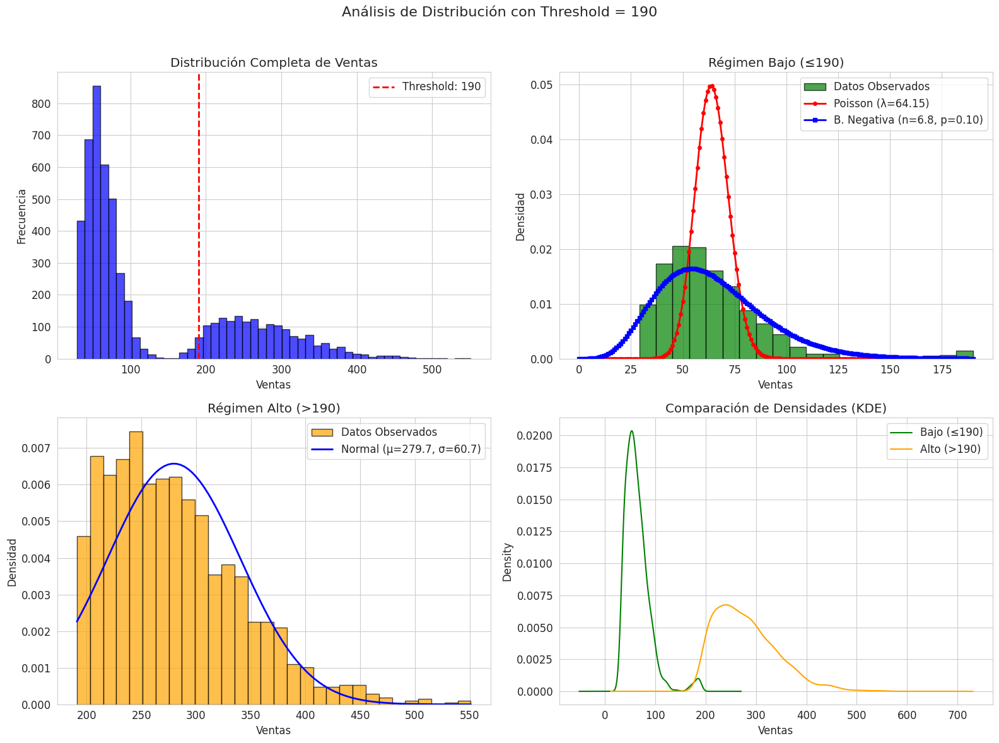

PAÍS: JAPAN

--- Producto: Using LLMs to Improve Your Coding ---
Total observaciones: 5478, Rango: 58-938, Media: 293.7

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


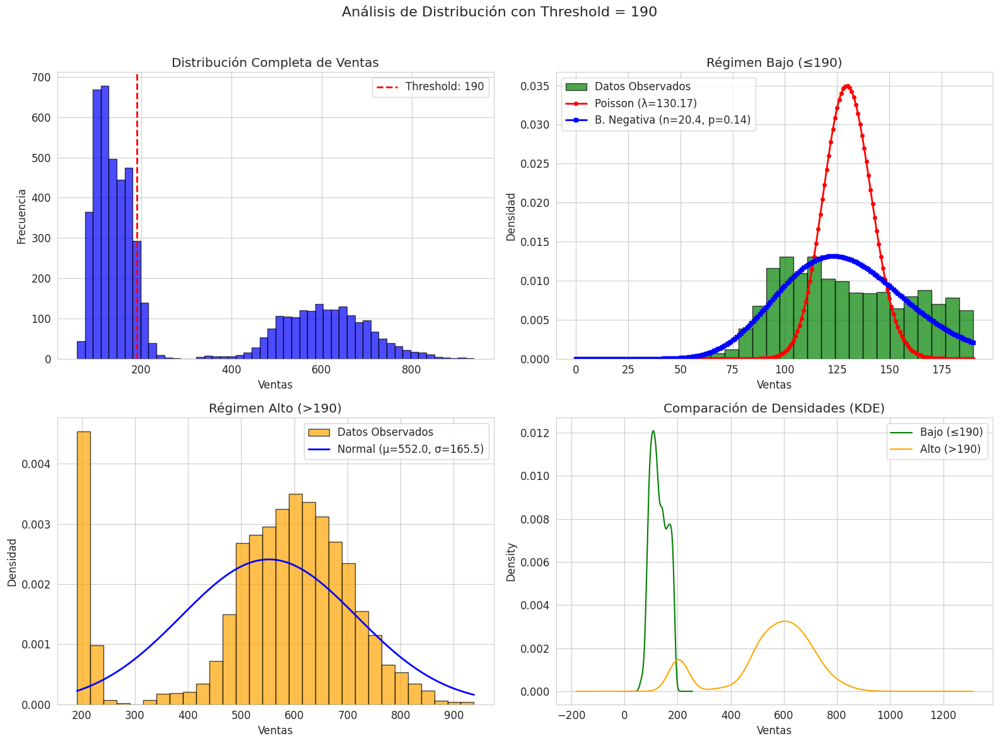


--- Producto: Using LLMs to Train More LLMs ---
Total observaciones: 5478, Rango: 72-969, Media: 290.8

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


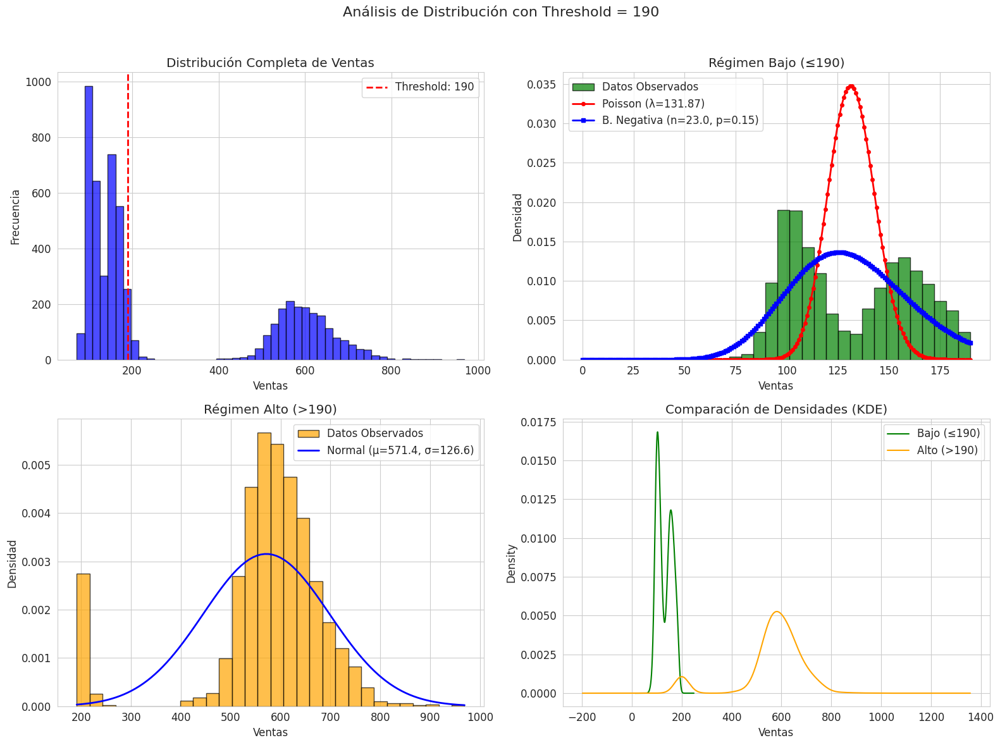


--- Producto: Using LLMs to Win Friends and Influence People ---
Total observaciones: 5478, Rango: 10-147, Media: 45.3

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 80

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


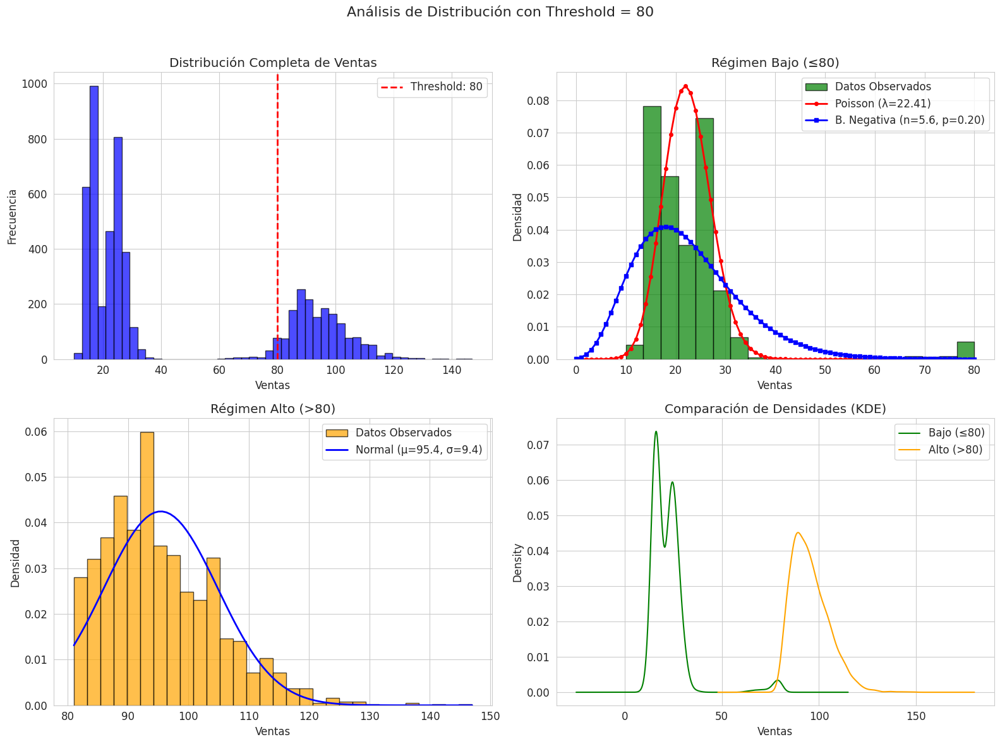


--- Producto: Using LLMs to Win More Kaggle Competitions ---
Total observaciones: 5478, Rango: 51-970, Media: 245.3

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


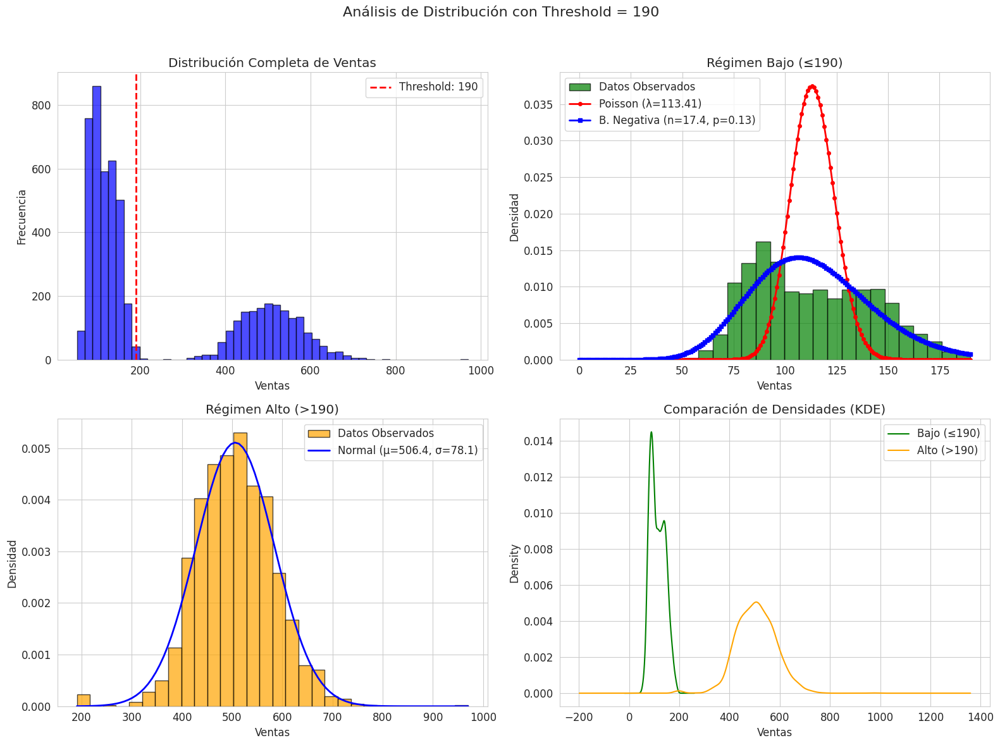


--- Producto: Using LLMs to Write Better ---
Total observaciones: 5478, Rango: 52-1005, Media: 222.8

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


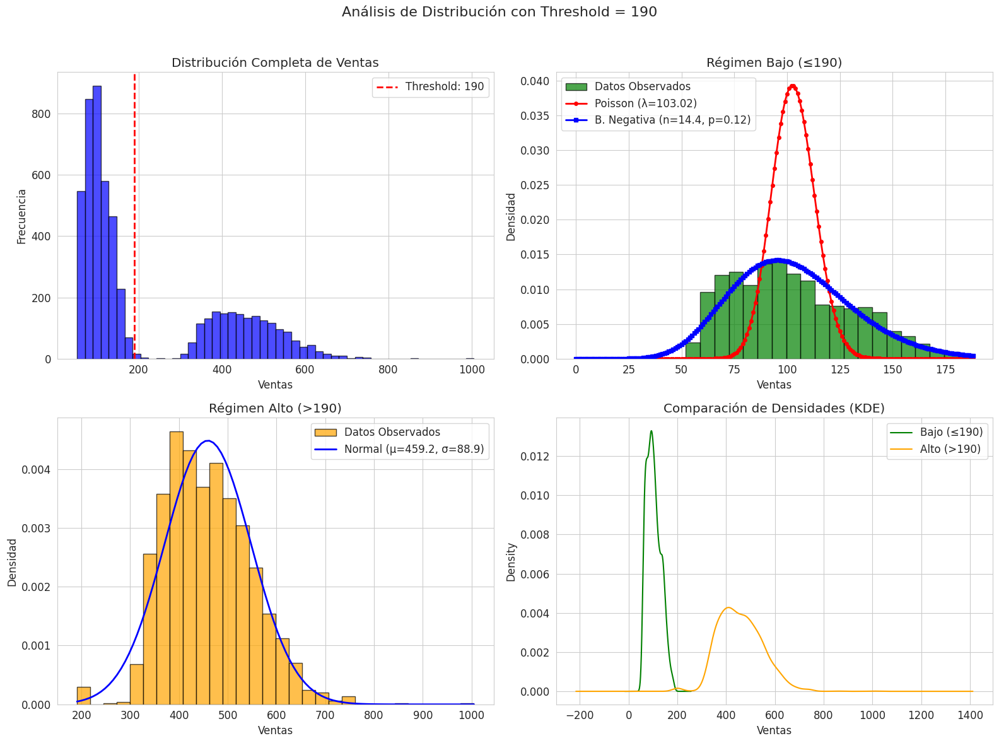

PAÍS: SPAIN

--- Producto: Using LLMs to Improve Your Coding ---
Total observaciones: 5478, Rango: 39-827, Media: 214.2

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


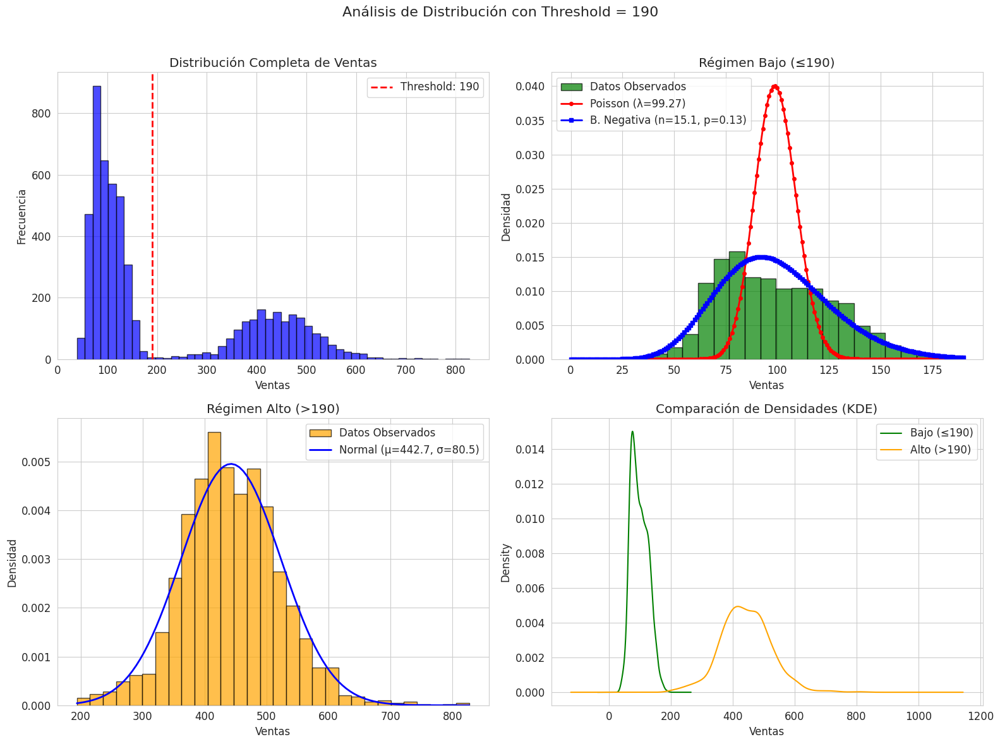


--- Producto: Using LLMs to Train More LLMs ---
Total observaciones: 5478, Rango: 48-822, Media: 211.4

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


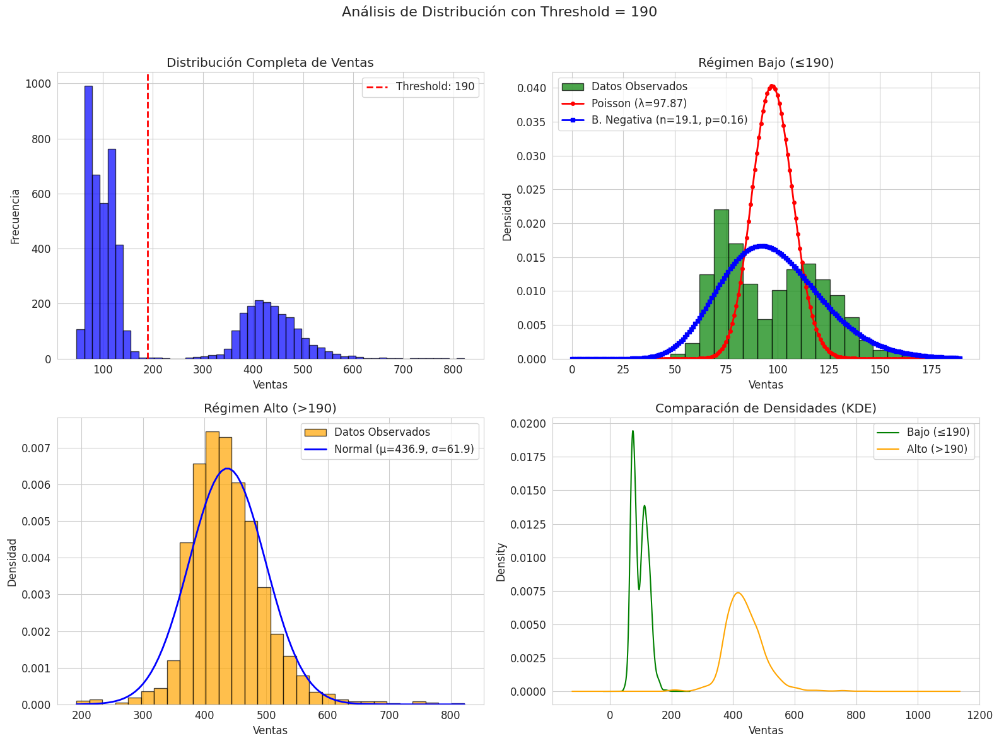


--- Producto: Using LLMs to Win Friends and Influence People ---
Total observaciones: 5478, Rango: 7-131, Media: 32.9

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 100

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


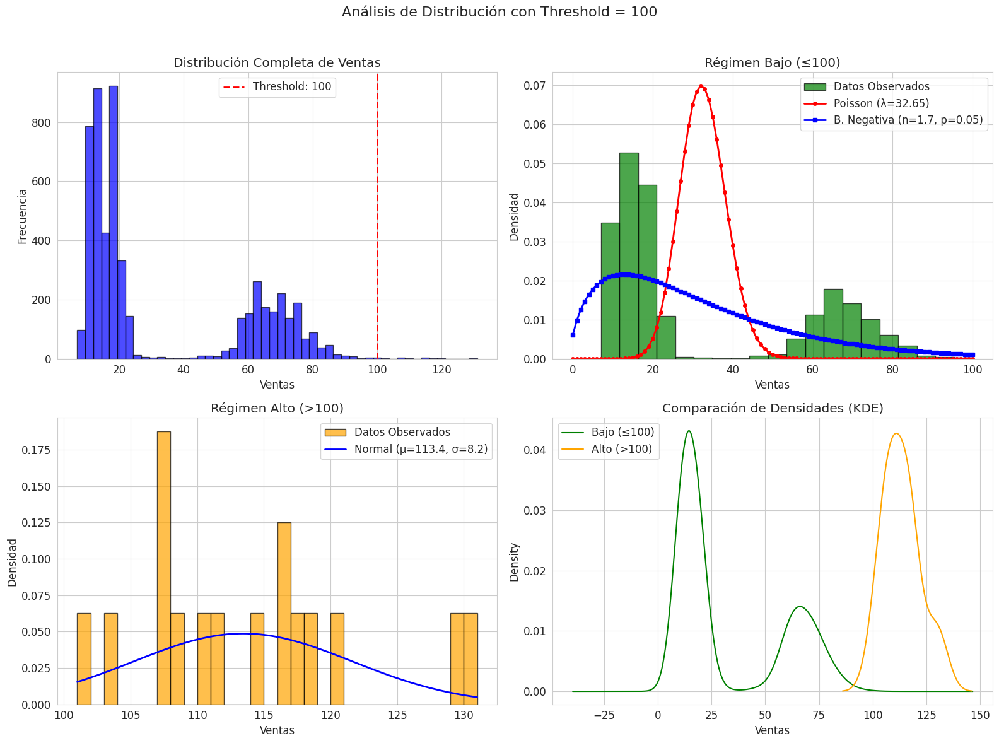


--- Producto: Using LLMs to Win More Kaggle Competitions ---
Total observaciones: 5478, Rango: 35-786, Media: 178.9

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 190

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


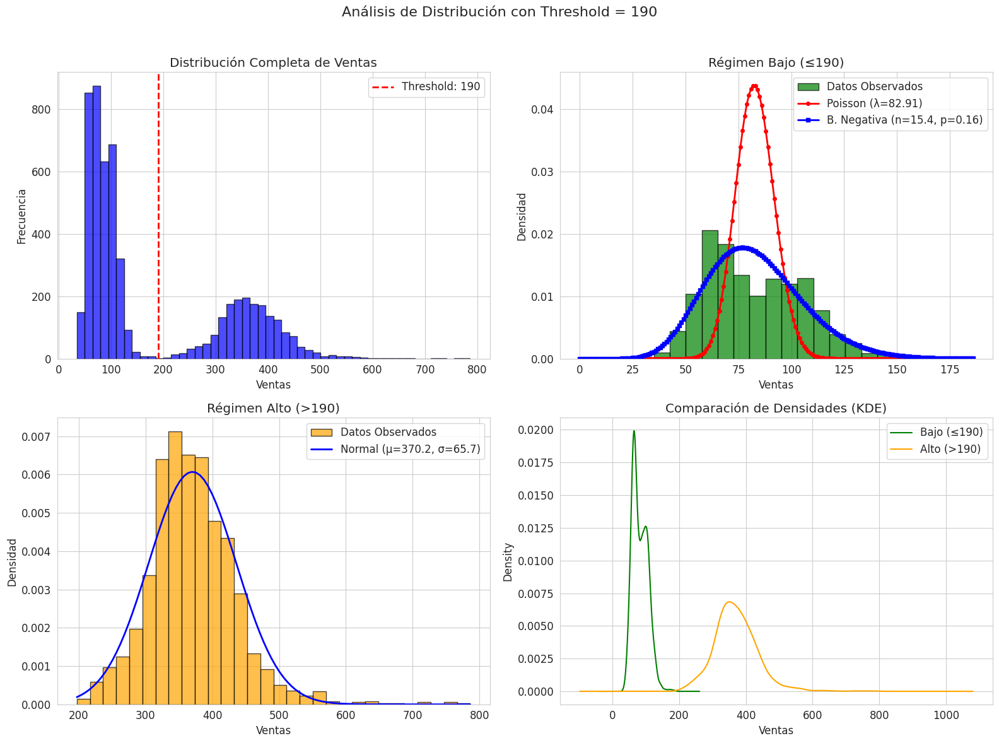


--- Producto: Using LLMs to Write Better ---
Total observaciones: 5478, Rango: 35-664, Media: 162.3

🎯 THRESHOLD ÓPTIMO ENCONTRADO: 180

📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):


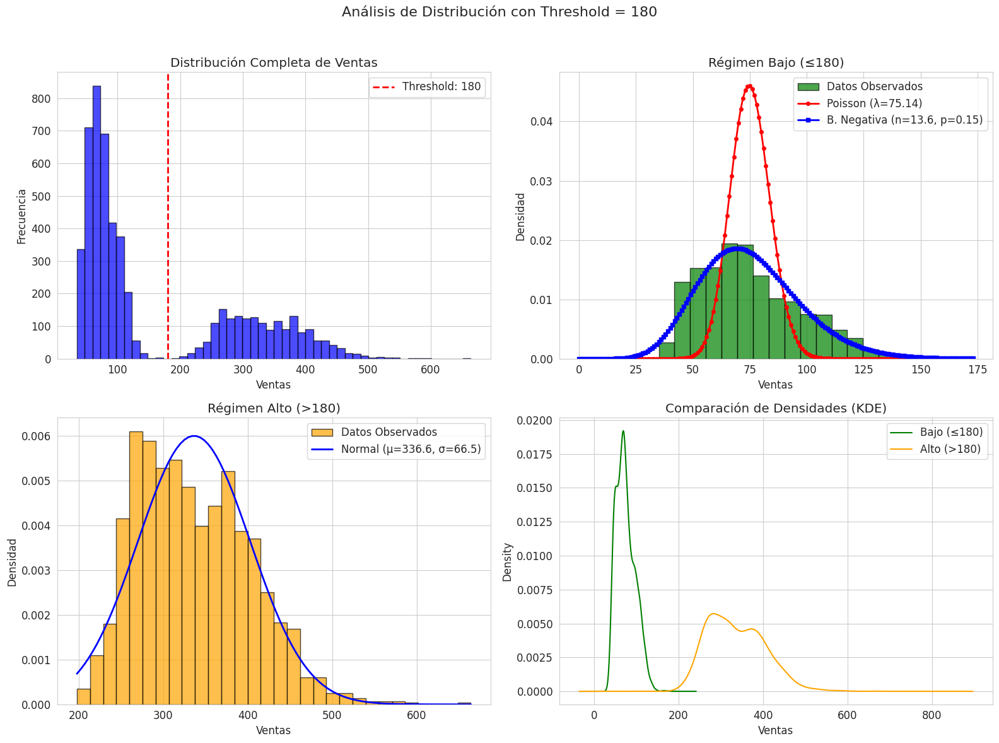

In [161]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats

def analyze_regime_threshold(data, threshold_candidates=range(10, 200, 10)):
    """Encuentra el mejor threshold para separar regímenes (tu función original)."""
    results = []
    for threshold in threshold_candidates:
        low_regime = data[data <= threshold]
        high_regime = data[data > threshold]
        
        if len(low_regime) < 10 or len(high_regime) < 10:
            continue
            
        low_prop = len(low_regime) / len(data)
        
        # Criterios para evaluar la separación
        balance_score = 1 - abs(0.5 - low_prop)
        mean_separation = abs(high_regime.mean() - low_regime.mean())
        cv_low = low_regime.std() / low_regime.mean() if low_regime.mean() > 0 else 99
        
        # Score combinado
        combined_score = (balance_score * 0.3 + 
                          (mean_separation / 100) * 0.5 + 
                          (1 / (1 + abs(cv_low - 1))) * 0.2)
        
        results.append({
            'threshold': threshold,
            'low_prop': low_prop,
            'high_prop': 1 - low_prop,
            'low_mean': low_regime.mean(),
            'high_mean': high_regime.mean(),
            'low_cv': cv_low,
            'mean_separation': mean_separation,
            'combined_score': combined_score
        })
    
    if not results:
        return None
    
    results_df = pd.DataFrame(results)
    best_threshold = results_df.loc[results_df['combined_score'].idxmax(), 'threshold']
    
    return best_threshold, results_df

def test_regime_distributions(low_data, high_data):
    """Testa qué distribuciones se ajustan mejor a cada régimen (tu función original)."""
    results = {'low_regime': {}, 'high_regime': {}}
    
    # Test régimen bajo
    if len(low_data) > 10:
        # Poisson
        try:
            poisson_lambda = low_data.mean()
            poisson_ks = stats.kstest(low_data, lambda x: stats.poisson.cdf(x, poisson_lambda))
            results['low_regime']['poisson'] = {'lambda': poisson_lambda, 'ks_pvalue': poisson_ks.pvalue}
        except: pass
        
        # Binomial Negativa
        try:
            mean_val, var_val = low_data.mean(), low_data.var()
            if var_val > mean_val:
                p_est = mean_val / var_val
                n_est = mean_val * p_est / (1 - p_est)
                if 0 < p_est < 1 and n_est > 0:
                    nbinom_ks = stats.kstest(low_data, lambda x: stats.nbinom.cdf(x, n_est, p_est))
                    results['low_regime']['nbinom'] = {'n': n_est, 'p': p_est, 'ks_pvalue': nbinom_ks.pvalue}
        except: pass
    
    # Test régimen alto
    if len(high_data) > 10:
        # Normal
        try:
            normal_mu, normal_sigma = stats.norm.fit(high_data)
            normal_ks = stats.kstest(high_data, lambda x: stats.norm.cdf(x, normal_mu, normal_sigma))
            results['high_regime']['normal'] = {'mu': normal_mu, 'sigma': normal_sigma, 'ks_pvalue': normal_ks.pvalue}
        except: pass
        
    return results

def plot_regime_distributions(data, threshold, low_regime, high_regime):
    """
    NUEVA FUNCIÓN: Genera un gráfico 2x2 para visualizar los regímenes y
    comparar las distribuciones.
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f'Análisis de Distribución con Threshold = {threshold}', fontsize=16)

    # 1. Histograma completo
    axes[0, 0].hist(data, bins=50, alpha=0.7, color='blue', edgecolor='black')
    axes[0, 0].axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold: {threshold}')
    axes[0, 0].set_title('Distribución Completa de Ventas')
    axes[0, 0].set_xlabel('Ventas')
    axes[0, 0].set_ylabel('Frecuencia')
    axes[0, 0].legend()

    # 2. Régimen bajo vs. Distribuciones de Conteo
    if not low_regime.empty:
        axes[0, 1].hist(low_regime, bins=20, alpha=0.7, color='green', edgecolor='black', density=True, label='Datos Observados')
        
        # Curva Poisson
        poisson_lambda = low_regime.mean()
        x_poisson = np.arange(0, int(low_regime.max()) + 1)
        y_poisson = stats.poisson.pmf(x_poisson, poisson_lambda)
        axes[0, 1].plot(x_poisson, y_poisson, 'ro-', linewidth=2, markersize=4, label=f'Poisson (λ={poisson_lambda:.2f})')
        
        # Curva Binomial Negativa
        mean, var = low_regime.mean(), low_regime.var()
        if var > mean:
            p = mean / var
            n = mean * p / (1 - p)
            if 0 < p < 1 and n > 0:
                y_nbinom = stats.nbinom.pmf(x_poisson, n, p)
                axes[0, 1].plot(x_poisson, y_nbinom, 'bs-', linewidth=2, markersize=4, label=f'B. Negativa (n={n:.1f}, p={p:.2f})')

        axes[0, 1].set_title(f'Régimen Bajo (≤{threshold})')
        axes[0, 1].set_xlabel('Ventas')
        axes[0, 1].set_ylabel('Densidad')
        axes[0, 1].legend()

    # 3. Régimen alto vs. Distribución Normal
    if not high_regime.empty:
        axes[1, 0].hist(high_regime, bins=30, alpha=0.7, color='orange', edgecolor='black', density=True, label='Datos Observados')
        
        # Curva Normal
        mu, sigma = stats.norm.fit(high_regime)
        x_normal = np.linspace(high_regime.min(), high_regime.max(), 100)
        y_normal = stats.norm.pdf(x_normal, mu, sigma)
        axes[1, 0].plot(x_normal, y_normal, 'b-', linewidth=2, label=f'Normal (μ={mu:.1f}, σ={sigma:.1f})')
        
        axes[1, 0].set_title(f'Régimen Alto (>{threshold})')
        axes[1, 0].set_xlabel('Ventas')
        axes[1, 0].set_ylabel('Densidad')
        axes[1, 0].legend()

    # 4. Comparación de densidades
    if not low_regime.empty:
        low_regime.plot(kind='kde', ax=axes[1, 1], color='green', label=f'Bajo (≤{threshold})')
    if not high_regime.empty:
        high_regime.plot(kind='kde', ax=axes[1, 1], color='orange', label=f'Alto (>{threshold})')
    axes[1, 1].set_title('Comparación de Densidades (KDE)')
    axes[1, 1].set_xlabel('Ventas')
    axes[1, 1].legend()
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


# ===== ANÁLISIS COMPLETO POR PAÍS-PRODUCTO (MODIFICADO) =====

# Cargar datos (necesitas tener tu dataframe 'train1' cargado)
# train1 = pd.read_csv('tu_archivo.csv') # Ejemplo de carga

countries = train1['country'].unique()
products = train1['product'].unique()

regime_analysis_results = {}
optimal_thresholds = {}

print("=== ANÁLISIS DE REGÍMENES Y VISUALIZACIÓN ===\n")

for country in countries:
    print(f"{'='*60}\nPAÍS: {country.upper()}\n{'='*60}")
    
    regime_analysis_results[country] = {}
    optimal_thresholds[country] = {}
    
    for product in products:
        print(f"\n--- Producto: {product} ---")
        
        data = train1[(train1['country'] == country) & (train1['product'] == product)]['num_sold']
        
        if len(data) < 20: # Aumentamos el mínimo para un análisis robusto
            print(f"No hay datos suficientes ({len(data)} obs.)")
            continue
        
        print(f"Total observaciones: {len(data)}, Rango: {data.min()}-{data.max()}, Media: {data.mean():.1f}")
        
        # Encontrar threshold óptimo
        threshold_result = analyze_regime_threshold(data)
        
        if threshold_result is None:
            print("No se pudo encontrar un threshold adecuado.")
            continue
        
        best_threshold, _ = threshold_result
        optimal_thresholds[country][product] = best_threshold
        
        print(f"\n🎯 THRESHOLD ÓPTIMO ENCONTRADO: {best_threshold}")
        
        # Separar en regímenes
        low_regime = data[data <= best_threshold]
        high_regime = data[data > best_threshold]
        
        # Test de distribuciones
        dist_results = test_regime_distributions(low_regime, high_regime)
        regime_analysis_results[country][product] = {'threshold': best_threshold, 'distributions': dist_results}

        # Mostrar mejor ajuste y generar gráfico
        print("\n📊 MEJOR AJUSTE DE DISTRIBUCIONES (basado en p-valor de KS test):")
        # (Aquí puedes agregar la lógica para imprimir el mejor ajuste si lo deseas)

        # ¡NUEVO! Generar y mostrar el gráfico
        plot_regime_distributions(data, best_threshold, low_regime, high_regime)



In [162]:
# el caso de argentina primero si ajusta bien ese producto , ahora hay algunos que si y otros no , el threshold va cambiando bastante
# en algunos casos me lleva a pensar en otras distribuciones
# para el primer modelo va sin regimen


# abajo primero resumen de todos los efectos que se vieron y todos los cambios a efectuar para un modelo simple 



In [163]:
#1. ESTACIONALIDAD SEMANAL
# Factores de crecimiento semanal identificados
"""
weekend_boost = {
    0: 1.00,  # Lunes (base)
    1: 1.00,  # Martes  
    2: 1.00,  # Miércoles
    3: 1.00,  # Jueves
    4: 1.06,  # Viernes (+5-7% vs jueves)
    5: 1.09,  # Sábado (+3-5% vs viernes) 
    6: 1.17   # Domingo (+6-8% vs sábado)
}
train1['weekend_factor'] = train1['DayOfWeek'].map(weekend_boost)

# Features categóricas adicionales
train1['is_weekend'] = (train1['DayOfWeek'] >= 5).astype(int)
train1['is_friday'] = (train1['DayOfWeek'] == 4).astype(int)
"""
#2. EFECTOS FIJOS POR PAÍS (Multiplicadores constantes)
"""
# Multiplicadores identificados (Argentina = base)
country_multipliers = {
    'Argentina': 1.0,
    'Canada': 4.1, 
    'Estonia': 2.1,
    'Japan': 3.6,
    'Spain': 2.6
}
train1['country_multiplier'] = train1['country'].map(country_multipliers)

# One-hot encoding para efectos fijos
train1 = pd.get_dummies(train1, columns=['country'], prefix='country')
"""
#3. EFECTOS FIJOS POR TIENDA (Multiplicadores identificados)
"""
# Multiplicadores por tienda (Kaggle Learn = base)
store_multipliers = {
    'Kaggle Learn': 1.0,      # Base
    'Kaggle Store': 1.54,     # 1.54x base
    'Kagglazon': 5.67         # 5.67x base  
}
train1['store_multiplier'] = train1['store'].map(store_multipliers)

# One-hot encoding para tiendas
train1 = pd.get_dummies(train1, columns=['store'], prefix='store')
"""
#4. EFECTOS FIJOS POR PRODUCTO (Ranking consistente)
"""
# Ranking de productos (mismo orden en todos los países)
product_ranking = {
    'Using LLMs to Improve Your Coding': 1,
    'Using LLMs to Train More LLMs': 2, 
    'Using LLMs to Win More Kaggle Competitions': 3,
    'Using LLMs to Write Better': 4,
    'Using LLMs to Win Friends and Influence People': 5
}
train1['product_rank'] = train1['product'].map(product_ranking)

# Valores base por producto (usando Argentina + Kaggle Learn como referencia)
product_base_values = {
    'Using LLMs to Improve Your Coding': 82.3,
    'Using LLMs to Train More LLMs': 81.2,
    'Using LLMs to Win More Kaggle Competitions': 68.8, 
    'Using LLMs to Write Better': 62.6,
    'Using LLMs to Win Friends and Influence People': 12.4
}
train1['product_base_value'] = train1['product'].map(product_base_values)

# One-hot encoding
train1 = pd.get_dummies(train1, columns=['product'], prefix='product')
"""
#5. FEATURES TEMPORALES
"""
# Tendencias temporales
train1['year_trend'] = train1['Year'] - 2017  # 0,1,2,3,4
train1['days_since_start'] = (train1['date'] - train1['date'].min()).dt.days

# Seasonality dentro del año
train1['month_sin'] = np.sin(2 * np.pi * train1['Month'] / 12)
train1['month_cos'] = np.cos(2 * np.pi * train1['Month'] / 12)
train1['day_of_year'] = train1['date'].dt.dayofyear
train1['quarter_sin'] = np.sin(2 * np.pi * train1['Quarter'] / 4)
train1['quarter_cos'] = np.cos(2 * np.pi * train1['Quarter'] / 4)
"""
#6. MIXTURE MODEL FEATURES (Régimen identificado) no utilizado

#7. FEATURES DE INTERACCIÓN (Actualizadas con tienda)
"""
# Interacciones clave identificadas
train1['country_store'] = train1['country_multiplier'] * train1['store_multiplier']
train1['country_weekend'] = train1['country_multiplier'] * train1['weekend_factor']
train1['store_weekend'] = train1['store_multiplier'] * train1['weekend_factor']
train1['product_weekend'] = train1['product_base_value'] * train1['weekend_factor']
train1['product_store'] = train1['product_base_value'] * train1['store_multiplier']

# Interacción triple principal
train1['country_store_product'] = (train1['country_multiplier'] * 
                                  train1['store_multiplier'] * 
                                  train1['product_base_value'])

# Interacción año-producto (por si hay trends específicos)
for year in [2017, 2018, 2019, 2020, 2021]:
    train1[f'product_rank_year_{year}'] = (train1['product_rank'] * 
                                          (train1['Year'] == year).astype(int))
"""
#8. LAG FEATURES (Series temporales)
"""
# Ordenar por entidad y fecha
train1 = train1.sort_values(['country', 'store', 'product', 'date'])

# Lags por entidad (país-tienda-producto)
for lag in [1, 7, 30]:
    train1[f'num_sold_lag_{lag}'] = (train1.groupby(['country', 'store', 'product'])
                                    ['num_sold'].shift(lag))

# Rolling statistics
for window in [7, 30]:
    train1[f'num_sold_rolling_mean_{window}'] = (train1.groupby(['country', 'store', 'product'])
                                                ['num_sold'].rolling(window).mean()
                                                .reset_index(0, drop=True))
    
    train1[f'num_sold_rolling_std_{window}'] = (train1.groupby(['country', 'store', 'product'])
                                               ['num_sold'].rolling(window).std()
                                               .reset_index(0, drop=True))
"""
#9. FEATURES TARGET TRANSFORMADAS
"""
# Para el régimen normal (alta demanda)
train1['log_num_sold'] = np.log1p(train1['num_sold'])
train1['sqrt_num_sold'] = np.sqrt(train1['num_sold'])

# Para análisis de residuos
train1['residual_from_base'] = train1['num_sold'] - train1['expected_base']
"""
#10. FEATURES FINALES PARA MODELO
"""
# Lista de features para usar en el modelo
base_features = [
    # Efectos fijos multiplicativos
    'country_multiplier', 'store_multiplier', 'product_base_value', 'product_rank',
    
    # Estacionalidad 
    'weekend_factor', 'is_weekend', 'is_friday',
    'month_sin', 'month_cos', 'quarter_sin', 'quarter_cos',
    
    # Temporales
    'year_trend', 'days_since_start',
    
    # Interacciones clave
    'country_store', 'country_weekend', 'store_weekend', 
    'product_weekend', 'product_store', 'country_store_product',
    
    # Base esperada y desviaciones
    'expected_base', 'deviation_from_expected',
    
    # Lags (si disponibles)
    'num_sold_lag_1', 'num_sold_lag_7', 'num_sold_rolling_mean_7'
]

# Features categóricas (one-hot encoded)
categorical_features = [col for col in train1.columns 
                       if col.startswith(('country_', 'product_', 'store_'))]

# Features finales
model_features = base_features + categorical_features
"""
#Como quedaria
#Expected_Sales = Argentina_Base × Country_Mult × Store_Mult × Product_Base × Weekend_Factor


"\n# Lista de features para usar en el modelo\nbase_features = [\n    # Efectos fijos multiplicativos\n    'country_multiplier', 'store_multiplier', 'product_base_value', 'product_rank',\n    \n    # Estacionalidad \n    'weekend_factor', 'is_weekend', 'is_friday',\n    'month_sin', 'month_cos', 'quarter_sin', 'quarter_cos',\n    \n    # Temporales\n    'year_trend', 'days_since_start',\n    \n    # Interacciones clave\n    'country_store', 'country_weekend', 'store_weekend', \n    'product_weekend', 'product_store', 'country_store_product',\n    \n    # Base esperada y desviaciones\n    'expected_base', 'deviation_from_expected',\n    \n    # Lags (si disponibles)\n    'num_sold_lag_1', 'num_sold_lag_7', 'num_sold_rolling_mean_7'\n]\n\n# Features categóricas (one-hot encoded)\ncategorical_features = [col for col in train1.columns \n                       if col.startswith(('country_', 'product_', 'store_'))]\n\n# Features finales\nmodel_features = base_features + categorical_features\

In [164]:
#  ESTACIONALIDAD SEMANAL
# Factores de crecimiento semanal identificados
weekend_boost = {
    0: 1.00,  # Lunes (base)
    1: 1.00,  # Martes  
    2: 1.00,  # Miércoles
    3: 1.00,  # Jueves
    4: 1.06,  # Viernes (+5-7% vs jueves)
    5: 1.09,  # Sábado (+3-5% vs viernes) 
    6: 1.17   # Domingo (+6-8% vs sábado)
}
train1['weekend_factor'] = train1['DayOfWeek'].map(weekend_boost)
test1['weekend_factor'] = test1['DayOfWeek'].map(weekend_boost)
# Features categóricas adicionales
train1['is_weekend'] = (train1['DayOfWeek'] >= 5).astype(int)
train1['is_friday'] = (train1['DayOfWeek'] == 4).astype(int)
test1['is_weekend'] = (test1['DayOfWeek'] >= 5).astype(int)
test1['is_friday'] = (test1['DayOfWeek'] == 4).astype(int)



In [165]:
# EFECTOS FIJOS POR PAÍS
# Multiplicadores identificados (Argentina = base)
country_multipliers = {
    'Argentina': 1.0,
    'Canada': 4.1, 
    'Estonia': 2.1,
    'Japan': 3.6,
    'Spain': 2.6
}
train1['country_multiplier'] = train1['country'].map(country_multipliers)
test1['country_multiplier'] = test1['country'].map(country_multipliers)
# One-hot encoding para efectos fijos
#train1 = pd.get_dummies(train1, columns=['country'], prefix='country')

In [166]:
#  EFECTOS FIJOS POR TIENDA
# Multiplicadores por tienda (Kaggle Learn = base)
store_multipliers = {
    'Kaggle Learn': 1.0,      # Base
    'Kaggle Store': 1.54,     # 1.54x base
    'Kagglazon': 5.67         # 5.67x base  
}
train1['store_multiplier'] = train1['store'].map(store_multipliers)
test1['store_multiplier'] = test1['store'].map(store_multipliers)
# One-hot encoding para tiendas
#train1 = pd.get_dummies(train1, columns=['store'], prefix='store')

In [167]:
#  EFECTOS FIJOS POR PRODUCTO
# Ranking de productos (mismo orden en todos los países)
product_ranking = {
    'Using LLMs to Improve Your Coding': 1,
    'Using LLMs to Train More LLMs': 2, 
    'Using LLMs to Win More Kaggle Competitions': 3,
    'Using LLMs to Write Better': 4,
    'Using LLMs to Win Friends and Influence People': 5
}
train1['product_rank'] = train1['product'].map(product_ranking)
test1['product_rank'] = test1['product'].map(product_ranking)
# Valores base por producto (usando Argentina + Kaggle Learn como referencia)
product_base_values = {
    'Using LLMs to Improve Your Coding': 82.3,
    'Using LLMs to Train More LLMs': 81.2,
    'Using LLMs to Win More Kaggle Competitions': 68.8, 
    'Using LLMs to Write Better': 62.6,
    'Using LLMs to Win Friends and Influence People': 12.4
}
train1['product_base_value'] = train1['product'].map(product_base_values)
train1['product_base_value'] = train1['product'].map(product_base_values)
test1['product_base_value'] = test1['product'].map(product_base_values)
test1['product_base_value'] = test1['product'].map(product_base_values)
# One-hot encoding
#train1 = pd.get_dummies(train1, columns=['product'], prefix='product')

In [168]:
# FEATURES TEMPORALES
# Tendencias temporales
train1['year_trend'] = train1['Year'] - 2017  # 0,1,2,3,4
train1['days_since_start'] = (train1['date'] - train1['date'].min()).dt.days
test1['year_trend'] = test1['Year'] - 2017
train_min_date = pd.to_datetime('2017-01-01')
test1['days_since_start'] = (test1['date'] - train_min_date).dt.days

# Seasonality dentro del año
train1['month_sin'] = np.sin(2 * np.pi * train1['Month'] / 12)
train1['month_cos'] = np.cos(2 * np.pi * train1['Month'] / 12)
train1['day_of_year'] = train1['date'].dt.dayofyear
train1['quarter_sin'] = np.sin(2 * np.pi * train1['Quarter'] / 4)
train1['quarter_cos'] = np.cos(2 * np.pi * train1['Quarter'] / 4)

test1['month_sin'] = np.sin(2 * np.pi * test1['Month'] / 12)
test1['month_cos'] = np.cos(2 * np.pi * test1['Month'] / 12)
test1['day_of_year'] = test1['date'].dt.dayofyear
test1['quarter_sin'] = np.sin(2 * np.pi * test1['Quarter'] / 4)
test1['quarter_cos'] = np.cos(2 * np.pi * test1['Quarter'] / 4)

In [169]:
#FEATURES DE INTERACCIÓN
# Interacciones clave identificadas
train1['country_store'] = train1['country_multiplier'] * train1['store_multiplier']
train1['country_weekend'] = train1['country_multiplier'] * train1['weekend_factor']
train1['store_weekend'] = train1['store_multiplier'] * train1['weekend_factor']
train1['product_weekend'] = train1['product_base_value'] * train1['weekend_factor']
train1['product_store'] = train1['product_base_value'] * train1['store_multiplier']

test1['country_store'] = test1['country_multiplier'] * test1['store_multiplier']
test1['country_weekend'] = test1['country_multiplier'] * test1['weekend_factor']
test1['store_weekend'] = test1['store_multiplier'] * test1['weekend_factor']
test1['product_weekend'] = test1['product_base_value'] * train1['weekend_factor']
test1['product_store'] = test1['product_base_value'] * test1['store_multiplier']




# Interacción triple principal
train1['country_store_product'] = (train1['country_multiplier'] * 
                                  train1['store_multiplier'] * 
                                  train1['product_base_value'])

test1['country_store_product'] = (test1['country_multiplier'] * 
                                  test1['store_multiplier'] * 
                                  test1['product_base_value'])


# Interacción año-producto (por si hay trends específicos)
for year in [2017, 2018, 2019, 2020, 2021]:
    train1[f'product_rank_year_{year}'] = (train1['product_rank'] * 
                                          (train1['Year'] == year).astype(int))

for year in [2017, 2018, 2019, 2020, 2021, 2022]:
        test1[f'product_rank_year_{year}'] = (test1['product_rank'] * 
                                                      (test1['Year'] == year).astype(int))


In [170]:
# LAG FEATURES
# Ordenar por entidad y fecha
train1 = train1.sort_values(['country', 'store', 'product', 'date'])

# Lags por entidad (país-tienda-producto)
for lag in [1, 7, 30]:
    train1[f'num_sold_lag_{lag}'] = (train1.groupby(['country', 'store', 'product'])
                                    ['num_sold'].shift(lag))

# Rolling statistics
for window in [7, 30]:
    train1[f'num_sold_rolling_mean_{window}'] = (
        train1.groupby(['country', 'store', 'product'])['num_sold']
        .transform(lambda x: x.rolling(window).mean())
    )

    train1[f'num_sold_rolling_std_{window}'] = (
        train1.groupby(['country', 'store', 'product'])['num_sold']
        .transform(lambda x: x.rolling(window).std())
    )

In [171]:
# FEATURES TARGET TRANSFORMADAS
# Para el régimen normal (alta demanda)
train1['log_num_sold'] = np.log1p(train1['num_sold'])
train1['sqrt_num_sold'] = np.sqrt(train1['num_sold'])

#one hot al final
train1 = pd.get_dummies(train1, columns=['country'], prefix='country')
train1 = pd.get_dummies(train1, columns=['store'], prefix='store')
train1 = pd.get_dummies(train1, columns=['product'], prefix='product')

test1 = pd.get_dummies(test1, columns=['country'], prefix='country')
test1 = pd.get_dummies(test1, columns=['store'], prefix='store')
test1 = pd.get_dummies(test1, columns=['product'], prefix='product')

test1['is_test_year'] = 1 # Agregar flag para identificar datos de test (2022)

# Feature para capturar la extrapolación temporal
test1['years_beyond_train'] = test1['Year'] - 2021  # Para 2022 = 1

In [172]:
# FEATURES FINALES PARA MODELO
# Lista de features para usar en el modelo
base_features = [
    # Efectos fijos multiplicativos
    'country_multiplier', 'store_multiplier', 'product_base_value', 'product_rank',
    
    # Estacionalidad 
    'weekend_factor', 'is_weekend', 'is_friday',
    'month_sin', 'month_cos', 'quarter_sin', 'quarter_cos',
    
    # Temporales
    'year_trend', 'days_since_start',
    
    # Interacciones clave
    'country_store', 'country_weekend', 'store_weekend', 
    'product_weekend', 'product_store', 'country_store_product',
    
    # Base esperada y desviaciones
    'expected_base', 'deviation_from_expected',
    
    # Lags (si disponibles)
    'num_sold_lag_1', 'num_sold_lag_7', 'num_sold_rolling_mean_7'
]

# Features categóricas (one-hot encoded)
categorical_features = [col for col in train1.columns 
                       if col.startswith(('country_', 'product_', 'store_'))]

# Features finales
model_features = base_features + categorical_features




In [173]:
train1.head()

,id,date,num_sold,Year,Quarter,Month,Day,DayOfWeek,day_name,weekend_factor,is_weekend,is_friday,country_multiplier,store_multiplier,product_rank,product_base_value,year_trend,days_since_start,month_sin,month_cos,day_of_year,quarter_sin,quarter_cos,country_store,country_weekend,store_weekend,product_weekend,product_store,country_store_product,product_rank_year_2017,product_rank_year_2018,product_rank_year_2019,product_rank_year_2020,product_rank_year_2021,num_sold_lag_1,num_sold_lag_7,num_sold_lag_30,num_sold_rolling_mean_7,num_sold_rolling_std_7,num_sold_rolling_mean_30,num_sold_rolling_std_30,log_num_sold,sqrt_num_sold,country_Argentina,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kagglazon,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Improve Your Coding,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
10,10,2017-01-01,340,2017,1,1,1,6,Domingo,1.1700,1,0,1.0000,5.6700,1,82.3000,0,0,0.5000,0.8660,1,1.0000,0.0000,5.6700,1.1700,6.6339,96.2910,466.6410,466.6410,1,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.8319,18.4391,True,False,False,False,False,True,False,False,True,False,False,False,False
85,85,2017-01-02,250,2017,1,1,2,0,Lunes,1.0000,0,0,1.0000,5.6700,1,82.3000,0,1,0.5000,0.8660,2,1.0000,0.0000,5.6700,1.0000,5.6700,82.3000,466.6410,466.6410,1,0,0,0,0,340.0000,NaN,NaN,NaN,NaN,NaN,NaN,5.5255,15.8114,True,False,False,False,False,True,False,False,True,False,False,False,False
160,160,2017-01-03,267,2017,1,1,3,1,Martes,1.0000,0,0,1.0000,5.6700,1,82.3000,0,2,0.5000,0.8660,3,1.0000,0.0000,5.6700,1.0000,5.6700,82.3000,466.6410,466.6410,1,0,0,0,0,250.0000,NaN,NaN,NaN,NaN,NaN,NaN,5.5910,16.3401,True,False,False,False,False,True,False,False,True,False,False,False,False
235,235,2017-01-04,236,2017,1,1,4,2,Miércoles,1.0000,0,0,1.0000,5.6700,1,82.3000,0,3,0.5000,0.8660,4,1.0000,0.0000,5.6700,1.0000,5.6700,82.3000,466.6410,466.6410,1,0,0,0,0,267.0000,NaN,NaN,NaN,NaN,NaN,NaN,5.4681,15.3623,True,False,False,False,False,True,False,False,True,False,False,False,False
310,310,2017-01-05,247,2017,1,1,5,3,Jueves,1.0000,0,0,1.0000,5.6700,1,82.3000,0,4,0.5000,0.8660,5,1.0000,0.0000,5.6700,1.0000,5.6700,82.3000,466.6410,466.6410,1,0,0,0,0,236.0000,NaN,NaN,NaN,NaN,NaN,NaN,5.5134,15.7162,True,False,False,False,False,True,False,False,True,False,False,False,False


In [174]:
test1.head()

,id,date,Year,Quarter,Month,Day,DayOfWeek,weekend_factor,is_weekend,is_friday,country_multiplier,store_multiplier,product_rank,product_base_value,year_trend,days_since_start,month_sin,month_cos,day_of_year,quarter_sin,quarter_cos,country_store,country_weekend,store_weekend,product_weekend,product_store,country_store_product,product_rank_year_2017,product_rank_year_2018,product_rank_year_2019,product_rank_year_2020,product_rank_year_2021,product_rank_year_2022,country_Argentina,country_Canada,country_Estonia,country_Japan,country_Spain,store_Kagglazon,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Improve Your Coding,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better,is_test_year,years_beyond_train
0,136950,2022-01-01,2022,1,1,1,5,1.0900,1,0,1.0000,1.0000,1,82.3000,5,1826,0.5000,0.8660,1,1.0000,0.0000,1.0000,1.0900,1.0900,96.2910,82.3000,82.3000,0,0,0,0,0,1,True,False,False,False,False,False,True,False,True,False,False,False,False,1,1
1,136951,2022-01-01,2022,1,1,1,5,1.0900,1,0,1.0000,1.0000,2,81.2000,5,1826,0.5000,0.8660,1,1.0000,0.0000,1.0000,1.0900,1.0900,95.0040,81.2000,81.2000,0,0,0,0,0,2,True,False,False,False,False,False,True,False,False,True,False,False,False,1,1
2,136952,2022-01-01,2022,1,1,1,5,1.0900,1,0,1.0000,1.0000,5,12.4000,5,1826,0.5000,0.8660,1,1.0000,0.0000,1.0000,1.0900,1.0900,14.5080,12.4000,12.4000,0,0,0,0,0,5,True,False,False,False,False,False,True,False,False,False,True,False,False,1,1
3,136953,2022-01-01,2022,1,1,1,5,1.0900,1,0,1.0000,1.0000,3,68.8000,5,1826,0.5000,0.8660,1,1.0000,0.0000,1.0000,1.0900,1.0900,80.4960,68.8000,68.8000,0,0,0,0,0,3,True,False,False,False,False,False,True,False,False,False,False,True,False,1,1
4,136954,2022-01-01,2022,1,1,1,5,1.0900,1,0,1.0000,1.0000,4,62.6000,5,1826,0.5000,0.8660,1,1.0000,0.0000,1.0000,1.0900,1.0900,73.2420,62.6000,62.6000,0,0,0,0,0,4,True,False,False,False,False,False,True,False,False,False,False,False,True,1,1


In [175]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27375 entries, 0 to 27374
Data columns (total 48 columns):
 #   Column                                                  Non-Null Count  Dtype         
---  ------                                                  --------------  -----         
 0   id                                                      27375 non-null  int64         
 1   date                                                    27375 non-null  datetime64[ns]
 2   Year                                                    27375 non-null  int32         
 3   Quarter                                                 27375 non-null  int32         
 4   Month                                                   27375 non-null  int32         
 5   Day                                                     27375 non-null  int32         
 6   DayOfWeek                                               27375 non-null  int32         
 7   weekend_factor                                          27

In [176]:
#eliminar los NaN/ reemplzar por 0
# no saque la columna ID que no aporta poder predictivo

features_con_nans = [col for col in train1.columns if 'lag' in col or 'rolling' in col]
train1[features_con_nans] = train1[features_con_nans].fillna(0)

In [177]:


model_features = [
    'country_multiplier', 'store_multiplier', 'product_base_value', 'product_rank',
    'weekend_factor', 'is_weekend', 'is_friday',
    'month_sin', 'month_cos', 'quarter_sin', 'quarter_cos',
    'year_trend', 'days_since_start',
    'country_store', 'country_weekend', 'store_weekend', 
    'product_weekend', 'product_store', 'country_store_product',
    'num_sold_lag_1', 'num_sold_lag_7', 'num_sold_lag_30',
    'num_sold_rolling_mean_7', 'num_sold_rolling_std_7',
    'num_sold_rolling_mean_30', 'num_sold_rolling_std_30'
]

X = train1[model_features]
y = train1['log_num_sold'] 

In [178]:
#  fecha de corte voy a usar 3 meses solamente de validacion
fecha_corte = '2021-09-30'
indices_train = train1[train1['date'] < fecha_corte].index
indices_val = train1[train1['date'] >= fecha_corte].index

# Separar X e y
X_train, X_val = X.loc[indices_train], X.loc[indices_val]
y_train, y_val = y.loc[indices_train], y.loc[indices_val]

print(f"Datos de entrenamiento: {len(X_train)} filas")
print(f"Datos de validación: {len(X_val)} filas")
"""
# Valores prediciendo los ultimos 3 meses del 2021

[LightGBM] [Info] Total Bins 2271
[LightGBM] [Info] Number of data points in the train set: 129975, number of used features: 26
[LightGBM] [Info] Start training from score 4.534541
Error del modelo (RMSE) en el conjunto de validación: 21.39
Error del modelo (SMAPE): 5.41%
"""

Datos de entrenamiento: 129975 filas
Datos de validación: 6975 filas


'\n# Valores prediciendo los ultimos 3 meses del 2021\n\n[LightGBM] [Info] Total Bins 2271\n[LightGBM] [Info] Number of data points in the train set: 129975, number of used features: 26\n[LightGBM] [Info] Start training from score 4.534541\nError del modelo (RMSE) en el conjunto de validación: 21.39\nError del modelo (SMAPE): 5.41%\n'

In [179]:
lgbm_reg = lgb.LGBMRegressor(random_state=1722, n_jobs=-1)
lgbm_reg.fit(X_train, y_train)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2271
[LightGBM] [Info] Number of data points in the train set: 129975, number of used features: 26
[LightGBM] [Info] Start training from score 4.534541


LGBMRegressor(n_jobs=-1, random_state=1722)


Error del modelo (RMSE) en el conjunto de validación: 21.39


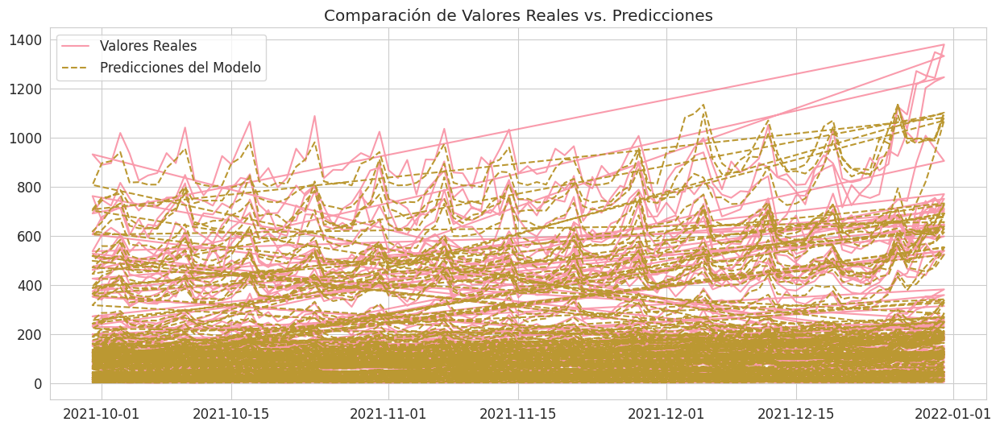

In [180]:
from sklearn.metrics import mean_squared_error

# Hacer predicciones sobre el conjunto de validación
log_predicciones = lgbm_reg.predict(X_val)

# ¡IMPORTANTE! Convertir las predicciones de vuelta a la escala original
# Si tu target 'y' era log_num_sold, usá np.expm1()
predicciones_finales = np.expm1(log_predicciones)

# Obtener los valores reales también en la escala original
valores_reales = np.expm1(y_val)


rmse = np.sqrt(mean_squared_error(valores_reales, predicciones_finales))
print(f"\nError del modelo (RMSE) en el conjunto de validación: {rmse:.2f}")


plt.figure(figsize=(15, 6))
plt.plot(train1.loc[indices_val, 'date'], valores_reales, label='Valores Reales', alpha=0.7)
plt.plot(train1.loc[indices_val, 'date'], predicciones_finales, label='Predicciones del Modelo', linestyle='--')
plt.title('Comparación de Valores Reales vs. Predicciones')
plt.legend()
plt.show()

In [181]:
def smape(y_true, y_pred):
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    diff = np.abs(y_true - y_pred) / denominator
    diff[denominator == 0] = 0.0  
    return np.mean(diff) * 100
# Calcular SMAPE
smape_error = smape(valores_reales, predicciones_finales)
print(f"Error del modelo (SMAPE): {smape_error:.2f}%")


Error del modelo (SMAPE): 5.41%


In [182]:
#Modelo para enviar a kaggle

lgbm_1 = lgb.LGBMRegressor(random_state=1722, n_jobs=-1)
lgbm_1.fit(X, y)



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2271
[LightGBM] [Info] Number of data points in the train set: 136950, number of used features: 26
[LightGBM] [Info] Start training from score 4.540041


LGBMRegressor(n_jobs=-1, random_state=1722)

In [183]:
# Hacer predicciones sobre el conjunto de test
log_preds_test = lgbm_1.predict(test1)
preds_test = np.expm1(log_preds_test)  # Inverso del log1p, si lo usaste en el entrenamiento

# Crear el archivo de submission
submission = pd.DataFrame({
    'row_id': test1['row_id'],       # Esta columna debe venir del archivo test.csv o sample_submission.csv
    'num_sold': preds_test           # Tu predicción en escala original
})

# Redondear si la métrica lo permite (sólo si es conteo entero, por ejemplo)
submission['num_sold'] = submission['num_sold'].round()

# Guardar archivo CSV
submission.to_csv('submission.csv', index=False)


ValueError: Number of features of the model must match the input. Model n_features_ is 26 and input n_features is 48